# CNN Autoencoder for anomaly detection


- Dataset
- Dataloader
- Model
- Metrics
- Training


In [1]:
# load custom packages from src dir
import sys
sys.path.insert(0, '..')

# python packages
import logging
import os
import time
import numpy as np
import pandas as pd

# Viz
import matplotlib.pyplot as plt
%matplotlib inline

# custom packages
import src.commons.dataset as ds
import src.commons.constants as cons

# U-Net custom implementation
from src.models.u_net import *

# Define the logging level
logging.getLogger().setLevel(logging.INFO)

## Model Parameters

In [ ]:
# device
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device: ', DEVICE)

# hyperparameters
NUM_CLASSES = 3 # in anomaly detection, it is just the 3 channels
NUM_WORKERS = 2
NUM_EPOCHS = 5
BATCH_SIZE = 4
LEARNING_RATE = 1e-5
RESIZE_DIM = 100
CHECKPOINT_PATH = ".." + cons.DIR_SEP + os.path.join("results")
print("CHECKPOINT PATH: ", CHECKPOINT_PATH)

## Data

In [ ]:
CATEGORY = "screw"
data = load_training_and_validation_data(CATEGORY, batch_size=BATCH_SIZE)
get_plot_training_data(data['dataset'], 4)

## Run sequence

In [2]:
all_categories = [
    'bottle', 'cable', 'capsule', 
    'carpet', 'grid', 'hazelnut', 
    'leather', 'metal_nut', 'pill', 
    'screw', 'tile', 'toothbrush', 
    'transistor', 'wood', 'zipper']

explore_dimensions = [100, 200, 400]

In [3]:
# device
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device: ', DEVICE)

# hyperparameters
NUM_CLASSES = 3 # in anomaly detection, it is just the 3 channels
NUM_WORKERS = 2
NUM_EPOCHS = 20
BATCH_SIZE = 4
LEARNING_RATE = 1e-5
RESIZE_DIM = 100
CHECKPOINT_PATH = ".." + cons.DIR_SEP + os.path.join("results")
print("CHECKPOINT PATH: ", CHECKPOINT_PATH)

device:  cpu
CHECKPOINT PATH:  ../results


In [4]:
def run_for_category(cat, explore_dimensions):
    data = load_training_and_validation_data(cat, batch_size=BATCH_SIZE)
    get_plot_training_data(data['dataset'], 4)

    test_data = load_test_data(cat, batch_size=BATCH_SIZE)
    test_data, test_dataloader = test_data['dataset'], test_data['test']

    experiment, performance_train, performance_val, process_duration = [], [], [], []
    for resize_dim in explore_dimensions:
        ts_start = time.time()
        # Training
        train_loss, val_loss, model = train_model(data, cat, 
            num_classes=NUM_CLASSES,
            device=DEVICE,
            resize_dim=resize_dim,
            learning_rate=LEARNING_RATE,
            checkpoint_path=CHECKPOINT_PATH,
            num_epochs=NUM_EPOCHS
        )
    
        performance_train.append(np.min(train_loss))
        performance_val.append(np.min(val_loss))
        experiment.append(f"cat_{cat}_with_{resize_dim}_resize_dim")
    
        print_loss(train_loss, val_loss)
    
        run_predictions_and_plot_results(model, test_dataloader, device=DEVICE, resize_dim=resize_dim)
        end_ts = time.time()
        process_duration = end_ts - ts_start

    return pd.DataFrame({
        'experiment': experiment, 
        'best_train_perf': performance_train, 
        'best_val_perf': performance_val,
        'exp_duration_sec': process_duration
    })


def run_all_categories(all_categories, all_reshaping_sizes):
    df_results = pd.DataFrame(columns=['experiment', 'best_train_perf', 'best_val_perf', 'exp_duration_sec'])
    csv_path = os.path.join(CHECKPOINT_PATH, 'autoencoder_results')
    for cat in all_categories:
        df_cat_results = run_for_category(cat, all_reshaping_sizes)
        df_results = pd.concat([df_results, df_cat_results])
        # checkpoint the experiments results
        df_results.to_csv(os.path.join(csv_path, f"training_results_autoencoder_{cat}.csv"), index=False)
    return df_results

209 209


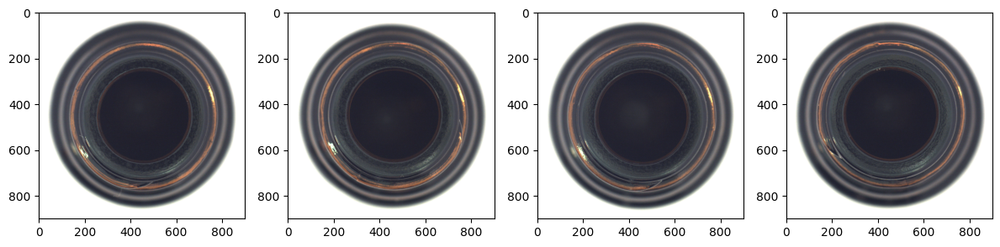

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.197: 100%|██████████| 48/48 [00:34<00:00,  1.37it/s]


Train loss: 0.256


loss = 0.240: 100%|██████████| 5/5 [00:01<00:00,  3.95it/s]


Validation loss: 0.239

Epoch 2/20


loss = 0.137: 100%|██████████| 48/48 [00:35<00:00,  1.36it/s]


Train loss: 0.163


loss = 0.127: 100%|██████████| 5/5 [00:01<00:00,  4.10it/s]


Validation loss: 0.127

Epoch 3/20


loss = 0.095: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.113


loss = 0.089: 100%|██████████| 5/5 [00:01<00:00,  3.93it/s]


Validation loss: 0.089

Epoch 4/20


loss = 0.068: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.078


loss = 0.061: 100%|██████████| 5/5 [00:01<00:00,  3.99it/s]


Validation loss: 0.060

Epoch 5/20


loss = 0.043: 100%|██████████| 48/48 [00:35<00:00,  1.36it/s]


Train loss: 0.054


loss = 0.042: 100%|██████████| 5/5 [00:01<00:00,  4.01it/s]


Validation loss: 0.041

Epoch 6/20


loss = 0.029: 100%|██████████| 48/48 [00:35<00:00,  1.36it/s]


Train loss: 0.038


loss = 0.029: 100%|██████████| 5/5 [00:01<00:00,  3.90it/s]


Validation loss: 0.029

Epoch 7/20


loss = 0.024: 100%|██████████| 48/48 [00:35<00:00,  1.36it/s]


Train loss: 0.027


loss = 0.022: 100%|██████████| 5/5 [00:01<00:00,  4.12it/s]


Validation loss: 0.022

Epoch 8/20


loss = 0.017: 100%|██████████| 48/48 [00:35<00:00,  1.36it/s]


Train loss: 0.020


loss = 0.016: 100%|██████████| 5/5 [00:01<00:00,  3.96it/s]


Validation loss: 0.016

Epoch 9/20


loss = 0.011: 100%|██████████| 48/48 [00:35<00:00,  1.36it/s]


Train loss: 0.015


loss = 0.012: 100%|██████████| 5/5 [00:01<00:00,  3.94it/s]


Validation loss: 0.012

Epoch 10/20


loss = 0.012: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.011


loss = 0.010: 100%|██████████| 5/5 [00:01<00:00,  4.07it/s]


Validation loss: 0.010

Epoch 11/20


loss = 0.009: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.009


loss = 0.008: 100%|██████████| 5/5 [00:01<00:00,  4.14it/s]


Validation loss: 0.008

Epoch 12/20


loss = 0.008: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.007


loss = 0.006: 100%|██████████| 5/5 [00:01<00:00,  4.02it/s]


Validation loss: 0.006

Epoch 13/20


loss = 0.005: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.006


loss = 0.005: 100%|██████████| 5/5 [00:01<00:00,  4.12it/s]


Validation loss: 0.005

Epoch 14/20


loss = 0.004: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.005


loss = 0.004: 100%|██████████| 5/5 [00:01<00:00,  3.86it/s]


Validation loss: 0.004

Epoch 15/20


loss = 0.003: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.004


loss = 0.003: 100%|██████████| 5/5 [00:01<00:00,  4.05it/s]


Validation loss: 0.003

Epoch 16/20


loss = 0.003: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.003


loss = 0.003: 100%|██████████| 5/5 [00:01<00:00,  4.09it/s]


Validation loss: 0.003

Epoch 17/20


loss = 0.003: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.003


loss = 0.003: 100%|██████████| 5/5 [00:01<00:00,  4.12it/s]


Validation loss: 0.003

Epoch 18/20


loss = 0.002: 100%|██████████| 48/48 [00:35<00:00,  1.36it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 5/5 [00:01<00:00,  4.08it/s]


Validation loss: 0.002

Epoch 19/20


loss = 0.002: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 5/5 [00:01<00:00,  4.07it/s]


Validation loss: 0.002

Epoch 20/20


loss = 0.001: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 5/5 [00:01<00:00,  4.09it/s]

Validation loss: 0.002


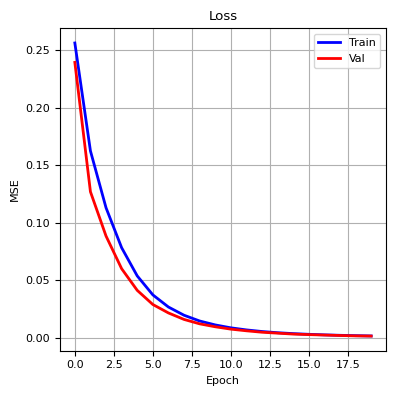

100%|██████████| 21/21 [00:05<00:00,  3.91it/s]


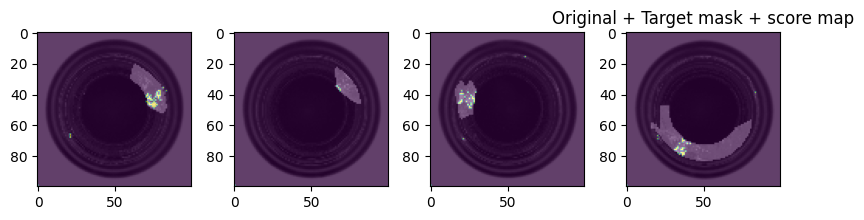

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.384: 100%|██████████| 48/48 [01:49<00:00,  2.28s/it]


Train loss: 0.484


loss = 0.449: 100%|██████████| 5/5 [00:03<00:00,  1.39it/s]


Validation loss: 0.449

Epoch 2/20


loss = 0.243: 100%|██████████| 48/48 [01:48<00:00,  2.27s/it]


Train loss: 0.297


loss = 0.235: 100%|██████████| 5/5 [00:03<00:00,  1.39it/s]


Validation loss: 0.235

Epoch 3/20


loss = 0.180: 100%|██████████| 48/48 [01:48<00:00,  2.27s/it]


Train loss: 0.200


loss = 0.169: 100%|██████████| 5/5 [00:03<00:00,  1.39it/s]


Validation loss: 0.169

Epoch 4/20


loss = 0.130: 100%|██████████| 48/48 [01:48<00:00,  2.27s/it]


Train loss: 0.148


loss = 0.132: 100%|██████████| 5/5 [00:03<00:00,  1.40it/s]


Validation loss: 0.131

Epoch 5/20


loss = 0.106: 100%|██████████| 48/48 [01:48<00:00,  2.27s/it]


Train loss: 0.117


loss = 0.106: 100%|██████████| 5/5 [00:03<00:00,  1.40it/s]


Validation loss: 0.105

Epoch 6/20


loss = 0.095: 100%|██████████| 48/48 [01:48<00:00,  2.26s/it]


Train loss: 0.098


loss = 0.090: 100%|██████████| 5/5 [00:03<00:00,  1.38it/s]


Validation loss: 0.090

Epoch 7/20


loss = 0.082: 100%|██████████| 48/48 [01:48<00:00,  2.27s/it]


Train loss: 0.085


loss = 0.077: 100%|██████████| 5/5 [00:03<00:00,  1.41it/s]


Validation loss: 0.077

Epoch 8/20


loss = 0.067: 100%|██████████| 48/48 [01:48<00:00,  2.27s/it]


Train loss: 0.074


loss = 0.069: 100%|██████████| 5/5 [00:03<00:00,  1.39it/s]


Validation loss: 0.069

Epoch 9/20


loss = 0.062: 100%|██████████| 48/48 [01:48<00:00,  2.27s/it]


Train loss: 0.066


loss = 0.062: 100%|██████████| 5/5 [00:03<00:00,  1.39it/s]


Validation loss: 0.062

Epoch 10/20


loss = 0.060: 100%|██████████| 48/48 [01:50<00:00,  2.31s/it]


Train loss: 0.060


loss = 0.056: 100%|██████████| 5/5 [00:03<00:00,  1.37it/s]


Validation loss: 0.057

Epoch 11/20


loss = 0.050: 100%|██████████| 48/48 [01:50<00:00,  2.30s/it]


Train loss: 0.054


loss = 0.051: 100%|██████████| 5/5 [00:03<00:00,  1.37it/s]


Validation loss: 0.051

Epoch 12/20


loss = 0.052: 100%|██████████| 48/48 [01:50<00:00,  2.30s/it]


Train loss: 0.050


loss = 0.047: 100%|██████████| 5/5 [00:03<00:00,  1.37it/s]


Validation loss: 0.047

Epoch 13/20


loss = 0.044: 100%|██████████| 48/48 [01:50<00:00,  2.30s/it]


Train loss: 0.045


loss = 0.044: 100%|██████████| 5/5 [00:03<00:00,  1.38it/s]


Validation loss: 0.044

Epoch 14/20


loss = 0.040: 100%|██████████| 48/48 [01:50<00:00,  2.29s/it]


Train loss: 0.041


loss = 0.039: 100%|██████████| 5/5 [00:03<00:00,  1.39it/s]


Validation loss: 0.039

Epoch 15/20


loss = 0.035: 100%|██████████| 48/48 [01:49<00:00,  2.29s/it]


Train loss: 0.038


loss = 0.036: 100%|██████████| 5/5 [00:03<00:00,  1.38it/s]


Validation loss: 0.036

Epoch 16/20


loss = 0.037: 100%|██████████| 48/48 [01:49<00:00,  2.29s/it]


Train loss: 0.035


loss = 0.033: 100%|██████████| 5/5 [00:03<00:00,  1.38it/s]


Validation loss: 0.033

Epoch 17/20


loss = 0.030: 100%|██████████| 48/48 [01:50<00:00,  2.30s/it]


Train loss: 0.032


loss = 0.030: 100%|██████████| 5/5 [00:03<00:00,  1.35it/s]


Validation loss: 0.030

Epoch 18/20


loss = 0.027: 100%|██████████| 48/48 [01:50<00:00,  2.29s/it]


Train loss: 0.029


loss = 0.028: 100%|██████████| 5/5 [00:03<00:00,  1.38it/s]


Validation loss: 0.028

Epoch 19/20


loss = 0.025: 100%|██████████| 48/48 [01:49<00:00,  2.29s/it]


Train loss: 0.027


loss = 0.025: 100%|██████████| 5/5 [00:03<00:00,  1.39it/s]


Validation loss: 0.025

Epoch 20/20


loss = 0.027: 100%|██████████| 48/48 [01:49<00:00,  2.29s/it]


Train loss: 0.025


loss = 0.024: 100%|██████████| 5/5 [00:03<00:00,  1.39it/s]

Validation loss: 0.024


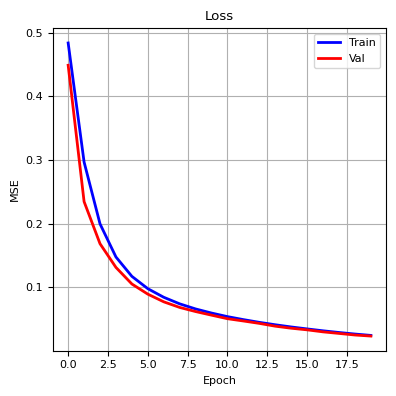

100%|██████████| 21/21 [00:15<00:00,  1.37it/s]


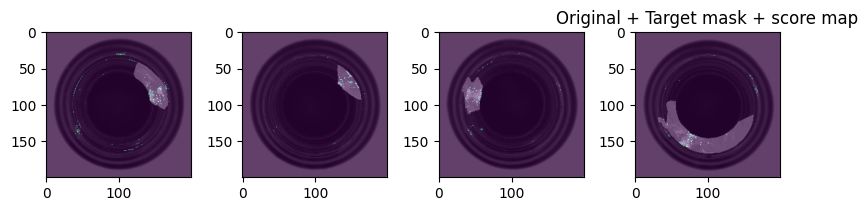

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.319: 100%|██████████| 48/48 [07:58<00:00,  9.97s/it]


Train loss: 0.469


loss = 0.463: 100%|██████████| 5/5 [00:13<00:00,  2.76s/it]


Validation loss: 0.463

Epoch 2/20


loss = 0.200: 100%|██████████| 48/48 [07:58<00:00,  9.96s/it]


Train loss: 0.257


loss = 0.191: 100%|██████████| 5/5 [00:13<00:00,  2.68s/it]


Validation loss: 0.191

Epoch 3/20


loss = 0.139: 100%|██████████| 48/48 [07:59<00:00,  9.99s/it]


Train loss: 0.165


loss = 0.132: 100%|██████████| 5/5 [00:14<00:00,  2.85s/it]


Validation loss: 0.131

Epoch 4/20


loss = 0.098: 100%|██████████| 48/48 [08:01<00:00, 10.03s/it]


Train loss: 0.114


loss = 0.094: 100%|██████████| 5/5 [00:13<00:00,  2.73s/it]


Validation loss: 0.094

Epoch 5/20


loss = 0.074: 100%|██████████| 48/48 [07:53<00:00,  9.87s/it]


Train loss: 0.086


loss = 0.074: 100%|██████████| 5/5 [00:13<00:00,  2.60s/it]


Validation loss: 0.074

Epoch 6/20


loss = 0.066: 100%|██████████| 48/48 [08:00<00:00, 10.02s/it]


Train loss: 0.068


loss = 0.060: 100%|██████████| 5/5 [00:13<00:00,  2.69s/it]


Validation loss: 0.061

Epoch 7/20


loss = 0.050: 100%|██████████| 48/48 [08:00<00:00, 10.02s/it]


Train loss: 0.057


loss = 0.051: 100%|██████████| 5/5 [00:13<00:00,  2.70s/it]


Validation loss: 0.051

Epoch 8/20


loss = 0.047: 100%|██████████| 48/48 [07:54<00:00,  9.89s/it]


Train loss: 0.049


loss = 0.044: 100%|██████████| 5/5 [00:13<00:00,  2.79s/it]


Validation loss: 0.044

Epoch 9/20


loss = 0.040: 100%|██████████| 48/48 [08:00<00:00, 10.01s/it]


Train loss: 0.042


loss = 0.039: 100%|██████████| 5/5 [00:13<00:00,  2.61s/it]


Validation loss: 0.039

Epoch 10/20


loss = 0.032: 100%|██████████| 48/48 [08:00<00:00, 10.01s/it]


Train loss: 0.037


loss = 0.034: 100%|██████████| 5/5 [00:13<00:00,  2.70s/it]


Validation loss: 0.034

Epoch 11/20


loss = 0.029: 100%|██████████| 48/48 [08:00<00:00, 10.02s/it]


Train loss: 0.033


loss = 0.030: 100%|██████████| 5/5 [00:13<00:00,  2.68s/it]


Validation loss: 0.030

Epoch 12/20


loss = 0.025: 100%|██████████| 48/48 [08:02<00:00, 10.05s/it]


Train loss: 0.029


loss = 0.026: 100%|██████████| 5/5 [00:13<00:00,  2.68s/it]


Validation loss: 0.027

Epoch 13/20


loss = 0.027: 100%|██████████| 48/48 [08:02<00:00, 10.04s/it]


Train loss: 0.026


loss = 0.024: 100%|██████████| 5/5 [00:13<00:00,  2.75s/it]


Validation loss: 0.024

Epoch 14/20


loss = 0.019: 100%|██████████| 48/48 [08:00<00:00, 10.02s/it]


Train loss: 0.023


loss = 0.021: 100%|██████████| 5/5 [00:13<00:00,  2.71s/it]


Validation loss: 0.021

Epoch 15/20


loss = 0.021: 100%|██████████| 48/48 [07:58<00:00,  9.96s/it]


Train loss: 0.021


loss = 0.019: 100%|██████████| 5/5 [00:13<00:00,  2.71s/it]


Validation loss: 0.019

Epoch 16/20


loss = 0.021: 100%|██████████| 48/48 [08:02<00:00, 10.05s/it]


Train loss: 0.018


loss = 0.017: 100%|██████████| 5/5 [00:13<00:00,  2.67s/it]


Validation loss: 0.017

Epoch 17/20


loss = 0.017: 100%|██████████| 48/48 [07:56<00:00,  9.92s/it]


Train loss: 0.016


loss = 0.015: 100%|██████████| 5/5 [00:13<00:00,  2.67s/it]


Validation loss: 0.015

Epoch 18/20


loss = 0.017: 100%|██████████| 48/48 [07:57<00:00,  9.94s/it]


Train loss: 0.015


loss = 0.014: 100%|██████████| 5/5 [00:13<00:00,  2.70s/it]


Validation loss: 0.014

Epoch 19/20


loss = 0.011: 100%|██████████| 48/48 [07:52<00:00,  9.84s/it]


Train loss: 0.013


loss = 0.012: 100%|██████████| 5/5 [00:13<00:00,  2.64s/it]


Validation loss: 0.012

Epoch 20/20


loss = 0.012: 100%|██████████| 48/48 [07:50<00:00,  9.81s/it]


Train loss: 0.012


loss = 0.011: 100%|██████████| 5/5 [00:13<00:00,  2.66s/it]

Validation loss: 0.011


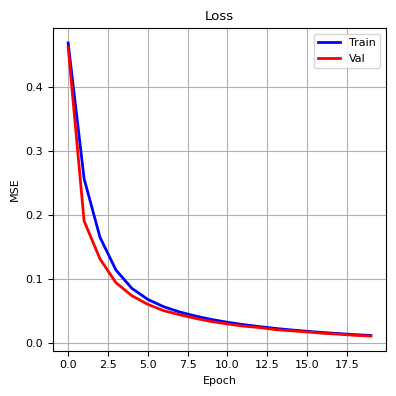

100%|██████████| 21/21 [00:57<00:00,  2.72s/it]


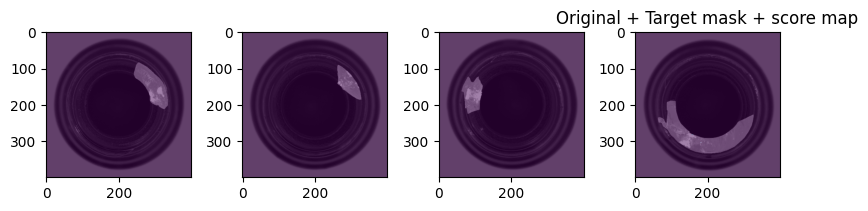

224 224


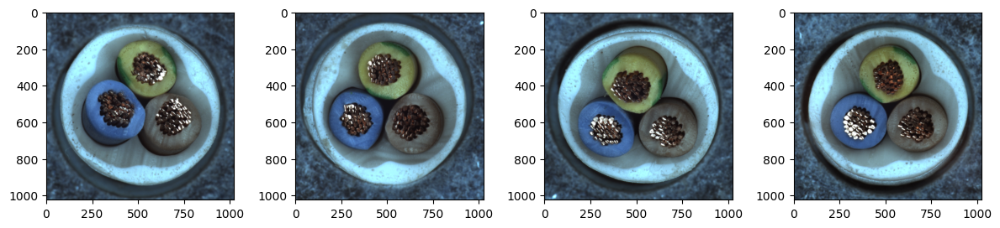

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.267: 100%|██████████| 51/51 [00:37<00:00,  1.36it/s]


Train loss: 0.383


loss = 0.262: 100%|██████████| 6/6 [00:01<00:00,  4.40it/s]


Validation loss: 0.257

Epoch 2/20


loss = 0.174: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.220


loss = 0.188: 100%|██████████| 6/6 [00:01<00:00,  4.42it/s]


Validation loss: 0.174

Epoch 3/20


loss = 0.095: 100%|██████████| 51/51 [00:38<00:00,  1.34it/s]


Train loss: 0.123


loss = 0.104: 100%|██████████| 6/6 [00:01<00:00,  4.07it/s]


Validation loss: 0.099

Epoch 4/20


loss = 0.060: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.073


loss = 0.094: 100%|██████████| 6/6 [00:01<00:00,  4.39it/s]


Validation loss: 0.077

Epoch 5/20


loss = 0.057: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.050


loss = 0.047: 100%|██████████| 6/6 [00:01<00:00,  4.22it/s]


Validation loss: 0.044

Epoch 6/20


loss = 0.026: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.034


loss = 0.087: 100%|██████████| 6/6 [00:01<00:00,  4.34it/s]


Validation loss: 0.055

Epoch 7/20


loss = 0.026: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.029


loss = 0.028: 100%|██████████| 6/6 [00:01<00:00,  4.49it/s]


Validation loss: 0.026

Epoch 8/20


loss = 0.016: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.021


loss = 0.021: 100%|██████████| 6/6 [00:01<00:00,  4.21it/s]


Validation loss: 0.019

Epoch 9/20


loss = 0.014: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.017


loss = 0.016: 100%|██████████| 6/6 [00:01<00:00,  4.38it/s]


Validation loss: 0.015

Epoch 10/20


loss = 0.015: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.014


loss = 0.015: 100%|██████████| 6/6 [00:01<00:00,  4.36it/s]


Validation loss: 0.014

Epoch 11/20


loss = 0.019: 100%|██████████| 51/51 [00:38<00:00,  1.34it/s]


Train loss: 0.012


loss = 0.017: 100%|██████████| 6/6 [00:01<00:00,  4.33it/s]


Validation loss: 0.014

Epoch 12/20


loss = 0.008: 100%|██████████| 51/51 [00:38<00:00,  1.34it/s]


Train loss: 0.010


loss = 0.009: 100%|██████████| 6/6 [00:01<00:00,  4.37it/s]


Validation loss: 0.009

Epoch 13/20


loss = 0.011: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.009


loss = 0.009: 100%|██████████| 6/6 [00:01<00:00,  4.52it/s]


Validation loss: 0.008

Epoch 14/20


loss = 0.011: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.008


loss = 0.009: 100%|██████████| 6/6 [00:01<00:00,  4.12it/s]


Validation loss: 0.008

Epoch 15/20


loss = 0.015: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.007


loss = 0.008: 100%|██████████| 6/6 [00:01<00:00,  4.34it/s]


Validation loss: 0.007

Epoch 16/20


loss = 0.007: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.007


loss = 0.006: 100%|██████████| 6/6 [00:01<00:00,  4.22it/s]


Validation loss: 0.006

Epoch 17/20


loss = 0.005: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.006


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  4.51it/s]


Validation loss: 0.005

Epoch 18/20


loss = 0.040: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.006


loss = 0.007: 100%|██████████| 6/6 [00:01<00:00,  4.39it/s]


Validation loss: 0.006

Epoch 19/20


loss = 0.004: 100%|██████████| 51/51 [00:37<00:00,  1.34it/s]


Train loss: 0.005


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  4.24it/s]


Validation loss: 0.005

Epoch 20/20


loss = 0.009: 100%|██████████| 51/51 [00:37<00:00,  1.35it/s]


Train loss: 0.004


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  4.41it/s]


Validation loss: 0.004


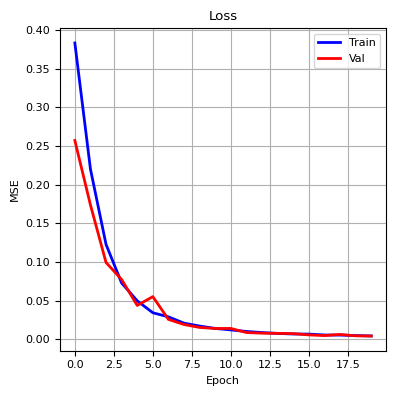

100%|██████████| 38/38 [00:09<00:00,  3.96it/s]


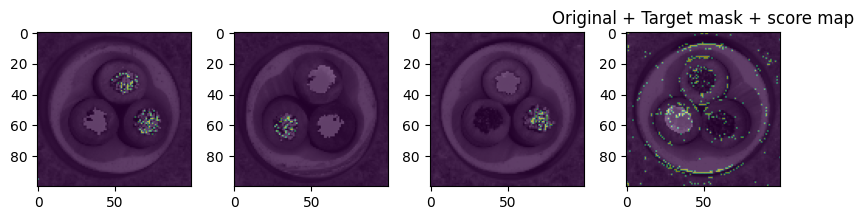

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.235: 100%|██████████| 51/51 [01:58<00:00,  2.33s/it]


Train loss: 0.283


loss = 0.192: 100%|██████████| 6/6 [00:04<00:00,  1.49it/s]


Validation loss: 0.191

Epoch 2/20


loss = 0.131: 100%|██████████| 51/51 [01:57<00:00,  2.31s/it]


Train loss: 0.165


loss = 0.133: 100%|██████████| 6/6 [00:04<00:00,  1.50it/s]


Validation loss: 0.126

Epoch 3/20


loss = 0.045: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.082


loss = 0.065: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


Validation loss: 0.060

Epoch 4/20


loss = 0.036: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.037


loss = 0.033: 100%|██████████| 6/6 [00:04<00:00,  1.49it/s]


Validation loss: 0.030

Epoch 5/20


loss = 0.015: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.019


loss = 0.018: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.016

Epoch 6/20


loss = 0.010: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.012


loss = 0.011: 100%|██████████| 6/6 [00:04<00:00,  1.49it/s]


Validation loss: 0.011

Epoch 7/20


loss = 0.007: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.009


loss = 0.009: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.008

Epoch 8/20


loss = 0.006: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.007


loss = 0.007: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.006

Epoch 9/20


loss = 0.006: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.006


loss = 0.006: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.005

Epoch 10/20


loss = 0.006: 100%|██████████| 51/51 [01:58<00:00,  2.33s/it]


Train loss: 0.005


loss = 0.007: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


Validation loss: 0.006

Epoch 11/20


loss = 0.004: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.005


loss = 0.005: 100%|██████████| 6/6 [00:04<00:00,  1.43it/s]


Validation loss: 0.004

Epoch 12/20


loss = 0.005: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.004


loss = 0.005: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.004

Epoch 13/20


loss = 0.004: 100%|██████████| 51/51 [01:57<00:00,  2.31s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


Validation loss: 0.003

Epoch 14/20


loss = 0.005: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.003


loss = 0.004: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.003

Epoch 15/20


loss = 0.003: 100%|██████████| 51/51 [01:58<00:00,  2.31s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.003

Epoch 16/20


loss = 0.003: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


Validation loss: 0.003

Epoch 17/20


loss = 0.003: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


Validation loss: 0.003

Epoch 18/20


loss = 0.003: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:04<00:00,  1.49it/s]


Validation loss: 0.002

Epoch 19/20


loss = 0.003: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.002


loss = 0.003: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


Validation loss: 0.002

Epoch 20/20


loss = 0.003: 100%|██████████| 51/51 [01:58<00:00,  2.32s/it]


Train loss: 0.002


loss = 0.003: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]

Validation loss: 0.002


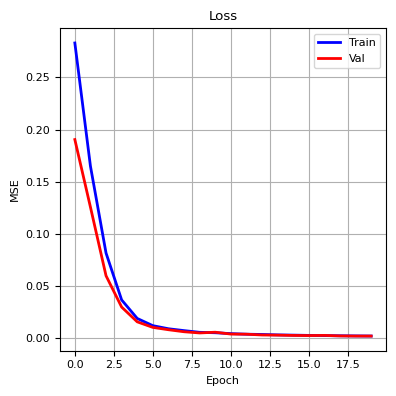

100%|██████████| 38/38 [00:27<00:00,  1.38it/s]


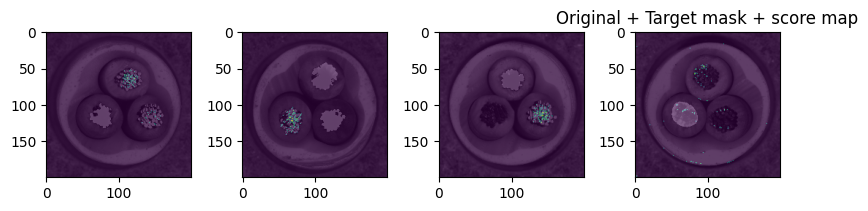

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.155: 100%|██████████| 51/51 [08:43<00:00, 10.26s/it]


Train loss: 0.228


loss = 0.160: 100%|██████████| 6/6 [00:15<00:00,  2.54s/it]


Validation loss: 0.161

Epoch 2/20


loss = 0.084: 100%|██████████| 51/51 [08:33<00:00, 10.06s/it]


Train loss: 0.118


loss = 0.089: 100%|██████████| 6/6 [00:14<00:00,  2.47s/it]


Validation loss: 0.086

Epoch 3/20


loss = 0.152: 100%|██████████| 51/51 [08:29<00:00,  9.99s/it]


Train loss: 0.061


loss = 0.048: 100%|██████████| 6/6 [00:15<00:00,  2.50s/it]


Validation loss: 0.048

Epoch 4/20


loss = 0.031: 100%|██████████| 51/51 [08:21<00:00,  9.83s/it]


Train loss: 0.034


loss = 0.028: 100%|██████████| 6/6 [00:15<00:00,  2.62s/it]


Validation loss: 0.028

Epoch 5/20


loss = 0.018: 100%|██████████| 51/51 [08:21<00:00,  9.82s/it]


Train loss: 0.021


loss = 0.019: 100%|██████████| 6/6 [00:14<00:00,  2.50s/it]


Validation loss: 0.019

Epoch 6/20


loss = 0.012: 100%|██████████| 51/51 [08:23<00:00,  9.87s/it]


Train loss: 0.014


loss = 0.013: 100%|██████████| 6/6 [00:14<00:00,  2.46s/it]


Validation loss: 0.013

Epoch 7/20


loss = 0.010: 100%|██████████| 51/51 [08:24<00:00,  9.90s/it]


Train loss: 0.010


loss = 0.010: 100%|██████████| 6/6 [00:15<00:00,  2.55s/it]


Validation loss: 0.009

Epoch 8/20


loss = 0.008: 100%|██████████| 51/51 [08:25<00:00,  9.92s/it]


Train loss: 0.008


loss = 0.008: 100%|██████████| 6/6 [00:15<00:00,  2.51s/it]


Validation loss: 0.008

Epoch 9/20


loss = 0.010: 100%|██████████| 51/51 [08:21<00:00,  9.83s/it]


Train loss: 0.006


loss = 0.006: 100%|██████████| 6/6 [00:15<00:00,  2.54s/it]


Validation loss: 0.006

Epoch 10/20


loss = 0.005: 100%|██████████| 51/51 [08:18<00:00,  9.78s/it]


Train loss: 0.005


loss = 0.007: 100%|██████████| 6/6 [00:15<00:00,  2.50s/it]


Validation loss: 0.006

Epoch 11/20


loss = 0.007: 100%|██████████| 51/51 [08:08<00:00,  9.58s/it]


Train loss: 0.005


loss = 0.004: 100%|██████████| 6/6 [00:15<00:00,  2.59s/it]


Validation loss: 0.004

Epoch 12/20


loss = 0.004: 100%|██████████| 51/51 [07:27<00:00,  8.78s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:14<00:00,  2.47s/it]


Validation loss: 0.003

Epoch 13/20


loss = 0.003: 100%|██████████| 51/51 [07:29<00:00,  8.81s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:14<00:00,  2.50s/it]


Validation loss: 0.003

Epoch 14/20


loss = 0.004: 100%|██████████| 51/51 [07:31<00:00,  8.86s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:14<00:00,  2.48s/it]


Validation loss: 0.003

Epoch 15/20


loss = 0.003: 100%|██████████| 51/51 [07:45<00:00,  9.12s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 6/6 [00:15<00:00,  2.52s/it]


Validation loss: 0.002

Epoch 16/20


loss = 0.002: 100%|██████████| 51/51 [07:59<00:00,  9.40s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:14<00:00,  2.43s/it]


Validation loss: 0.002

Epoch 17/20


loss = 0.002: 100%|██████████| 51/51 [08:02<00:00,  9.46s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:14<00:00,  2.39s/it]


Validation loss: 0.002

Epoch 18/20


loss = 0.002: 100%|██████████| 51/51 [08:05<00:00,  9.53s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:14<00:00,  2.45s/it]


Validation loss: 0.002

Epoch 19/20


loss = 0.002: 100%|██████████| 51/51 [08:04<00:00,  9.50s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:14<00:00,  2.43s/it]


Validation loss: 0.002

Epoch 20/20


loss = 0.003: 100%|██████████| 51/51 [08:03<00:00,  9.48s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:14<00:00,  2.46s/it]

Validation loss: 0.002


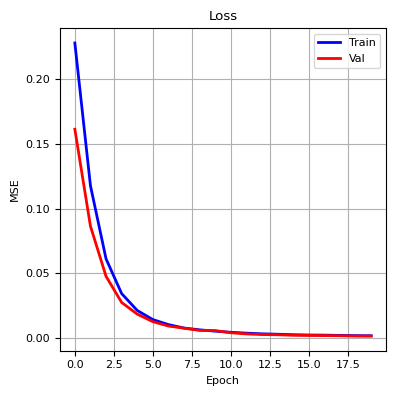

100%|██████████| 38/38 [01:41<00:00,  2.68s/it]


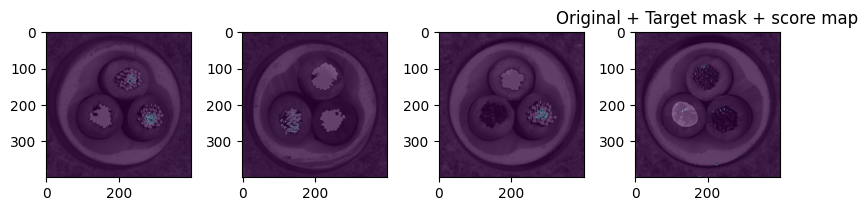

219 219


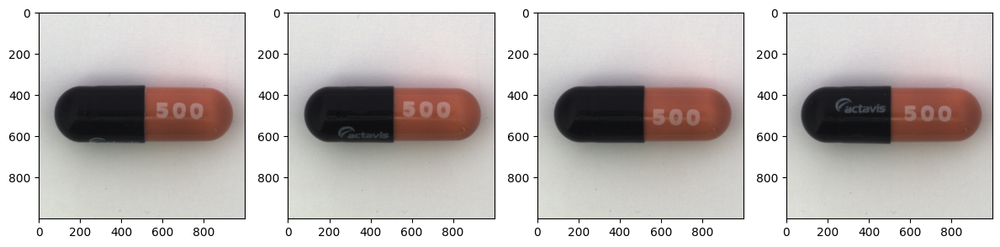

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.401: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]


Train loss: 0.480


loss = 0.385: 100%|██████████| 6/6 [00:01<00:00,  4.54it/s]


Validation loss: 0.385

Epoch 2/20


loss = 0.259: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.322


loss = 0.269: 100%|██████████| 6/6 [00:01<00:00,  4.40it/s]


Validation loss: 0.271

Epoch 3/20


loss = 0.215: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.240


loss = 0.211: 100%|██████████| 6/6 [00:01<00:00,  4.50it/s]


Validation loss: 0.212

Epoch 4/20


loss = 0.174: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.194


loss = 0.173: 100%|██████████| 6/6 [00:01<00:00,  4.57it/s]


Validation loss: 0.174

Epoch 5/20


loss = 0.162: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.164


loss = 0.149: 100%|██████████| 6/6 [00:01<00:00,  4.52it/s]


Validation loss: 0.150

Epoch 6/20


loss = 0.129: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]


Train loss: 0.141


loss = 0.128: 100%|██████████| 6/6 [00:01<00:00,  4.49it/s]


Validation loss: 0.129

Epoch 7/20


loss = 0.113: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.122


loss = 0.113: 100%|██████████| 6/6 [00:01<00:00,  4.56it/s]


Validation loss: 0.114

Epoch 8/20


loss = 0.109: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.107


loss = 0.102: 100%|██████████| 6/6 [00:01<00:00,  4.55it/s]


Validation loss: 0.103

Epoch 9/20


loss = 0.088: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.095


loss = 0.089: 100%|██████████| 6/6 [00:01<00:00,  4.54it/s]


Validation loss: 0.090

Epoch 10/20


loss = 0.080: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.085


loss = 0.080: 100%|██████████| 6/6 [00:01<00:00,  4.56it/s]


Validation loss: 0.081

Epoch 11/20


loss = 0.070: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]


Train loss: 0.076


loss = 0.071: 100%|██████████| 6/6 [00:01<00:00,  4.47it/s]


Validation loss: 0.072

Epoch 12/20


loss = 0.067: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.069


loss = 0.064: 100%|██████████| 6/6 [00:01<00:00,  4.58it/s]


Validation loss: 0.065

Epoch 13/20


loss = 0.060: 100%|██████████| 50/50 [00:36<00:00,  1.35it/s]


Train loss: 0.062


loss = 0.058: 100%|██████████| 6/6 [00:01<00:00,  4.49it/s]


Validation loss: 0.058

Epoch 14/20


loss = 0.061: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.056


loss = 0.053: 100%|██████████| 6/6 [00:01<00:00,  4.65it/s]


Validation loss: 0.054

Epoch 15/20


loss = 0.036: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]


Train loss: 0.050


loss = 0.047: 100%|██████████| 6/6 [00:01<00:00,  4.49it/s]


Validation loss: 0.048

Epoch 16/20


loss = 0.039: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.046


loss = 0.043: 100%|██████████| 6/6 [00:01<00:00,  4.30it/s]


Validation loss: 0.044

Epoch 17/20


loss = 0.039: 100%|██████████| 50/50 [00:36<00:00,  1.35it/s]


Train loss: 0.042


loss = 0.039: 100%|██████████| 6/6 [00:01<00:00,  4.60it/s]


Validation loss: 0.039

Epoch 18/20


loss = 0.049: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]


Train loss: 0.038


loss = 0.037: 100%|██████████| 6/6 [00:01<00:00,  4.34it/s]


Validation loss: 0.037

Epoch 19/20


loss = 0.031: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.034


loss = 0.032: 100%|██████████| 6/6 [00:01<00:00,  4.50it/s]


Validation loss: 0.032

Epoch 20/20


loss = 0.029: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]


Train loss: 0.031


loss = 0.029: 100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

Validation loss: 0.029


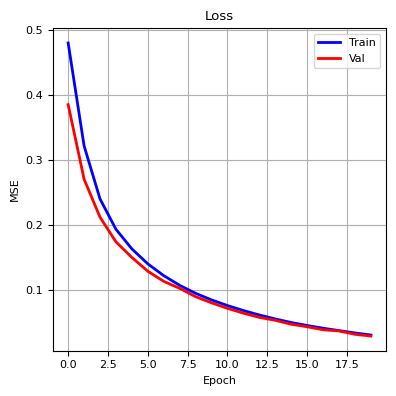

100%|██████████| 33/33 [00:08<00:00,  3.73it/s]


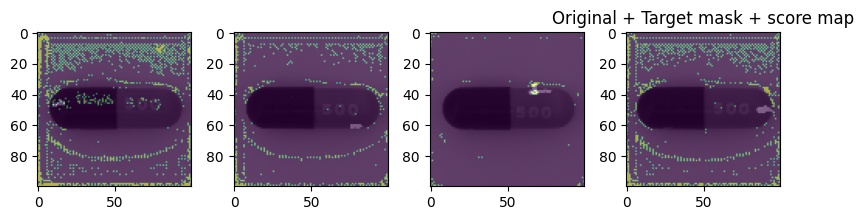

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.324: 100%|██████████| 50/50 [01:55<00:00,  2.31s/it]


Train loss: 0.419


loss = 0.334: 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]


Validation loss: 0.334

Epoch 2/20


loss = 0.228: 100%|██████████| 50/50 [01:55<00:00,  2.32s/it]


Train loss: 0.271


loss = 0.222: 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]


Validation loss: 0.223

Epoch 3/20


loss = 0.175: 100%|██████████| 50/50 [01:56<00:00,  2.33s/it]


Train loss: 0.194


loss = 0.159: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.159

Epoch 4/20


loss = 0.121: 100%|██████████| 50/50 [01:55<00:00,  2.32s/it]


Train loss: 0.142


loss = 0.119: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.119

Epoch 5/20


loss = 0.090: 100%|██████████| 50/50 [01:55<00:00,  2.31s/it]


Train loss: 0.106


loss = 0.091: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.092

Epoch 6/20


loss = 0.072: 100%|██████████| 50/50 [01:56<00:00,  2.33s/it]


Train loss: 0.082


loss = 0.073: 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]


Validation loss: 0.073

Epoch 7/20


loss = 0.061: 100%|██████████| 50/50 [01:55<00:00,  2.32s/it]


Train loss: 0.066


loss = 0.060: 100%|██████████| 6/6 [00:03<00:00,  1.58it/s]


Validation loss: 0.061

Epoch 8/20


loss = 0.052: 100%|██████████| 50/50 [01:55<00:00,  2.32s/it]


Train loss: 0.055


loss = 0.051: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.052

Epoch 9/20


loss = 0.036: 100%|██████████| 50/50 [01:56<00:00,  2.32s/it]


Train loss: 0.047


loss = 0.044: 100%|██████████| 6/6 [00:03<00:00,  1.58it/s]


Validation loss: 0.044

Epoch 10/20


loss = 0.033: 100%|██████████| 50/50 [01:55<00:00,  2.31s/it]


Train loss: 0.041


loss = 0.038: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.038

Epoch 11/20


loss = 0.032: 100%|██████████| 50/50 [01:55<00:00,  2.32s/it]


Train loss: 0.036


loss = 0.034: 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]


Validation loss: 0.034

Epoch 12/20


loss = 0.036: 100%|██████████| 50/50 [01:55<00:00,  2.32s/it]


Train loss: 0.032


loss = 0.031: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.031

Epoch 13/20


loss = 0.024: 100%|██████████| 50/50 [01:56<00:00,  2.33s/it]


Train loss: 0.029


loss = 0.027: 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]


Validation loss: 0.028

Epoch 14/20


loss = 0.029: 100%|██████████| 50/50 [01:55<00:00,  2.32s/it]


Train loss: 0.026


loss = 0.024: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.024

Epoch 15/20


loss = 0.022: 100%|██████████| 50/50 [01:55<00:00,  2.32s/it]


Train loss: 0.023


loss = 0.021: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.022

Epoch 16/20


loss = 0.020: 100%|██████████| 50/50 [01:56<00:00,  2.33s/it]


Train loss: 0.021


loss = 0.020: 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]


Validation loss: 0.020

Epoch 17/20


loss = 0.018: 100%|██████████| 50/50 [01:55<00:00,  2.31s/it]


Train loss: 0.019


loss = 0.018: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.018

Epoch 18/20


loss = 0.016: 100%|██████████| 50/50 [01:55<00:00,  2.31s/it]


Train loss: 0.017


loss = 0.015: 100%|██████████| 6/6 [00:03<00:00,  1.58it/s]


Validation loss: 0.016

Epoch 19/20


loss = 0.014: 100%|██████████| 50/50 [01:56<00:00,  2.32s/it]


Train loss: 0.015


loss = 0.015: 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]


Validation loss: 0.015

Epoch 20/20


loss = 0.011: 100%|██████████| 50/50 [01:55<00:00,  2.31s/it]


Train loss: 0.014


loss = 0.013: 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]

Validation loss: 0.013


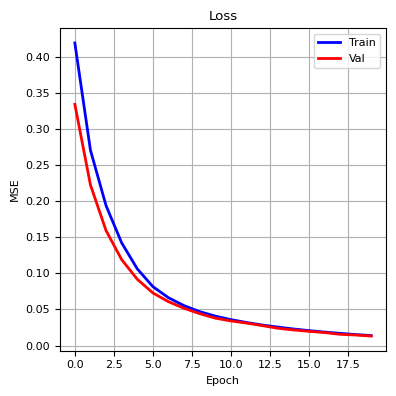

100%|██████████| 33/33 [00:24<00:00,  1.35it/s]


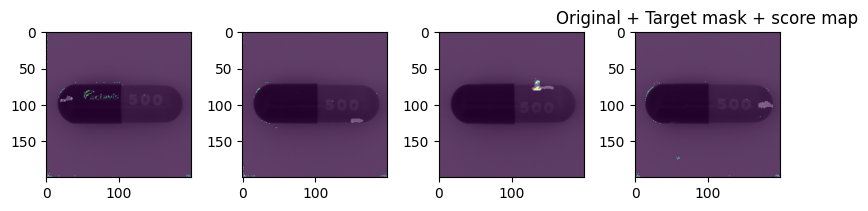

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.335: 100%|██████████| 50/50 [08:12<00:00,  9.86s/it]


Train loss: 0.462


loss = 0.343: 100%|██████████| 6/6 [00:14<00:00,  2.39s/it]


Validation loss: 0.346

Epoch 2/20


loss = 0.224: 100%|██████████| 50/50 [08:07<00:00,  9.75s/it]


Train loss: 0.278


loss = 0.209: 100%|██████████| 6/6 [00:14<00:00,  2.36s/it]


Validation loss: 0.213

Epoch 3/20


loss = 0.145: 100%|██████████| 50/50 [08:02<00:00,  9.64s/it]


Train loss: 0.180


loss = 0.138: 100%|██████████| 6/6 [00:14<00:00,  2.40s/it]


Validation loss: 0.141

Epoch 4/20


loss = 0.093: 100%|██████████| 50/50 [08:05<00:00,  9.70s/it]


Train loss: 0.122


loss = 0.097: 100%|██████████| 6/6 [00:13<00:00,  2.32s/it]


Validation loss: 0.099

Epoch 5/20


loss = 0.071: 100%|██████████| 50/50 [08:04<00:00,  9.70s/it]


Train loss: 0.088


loss = 0.074: 100%|██████████| 6/6 [00:14<00:00,  2.39s/it]


Validation loss: 0.075

Epoch 6/20


loss = 0.066: 100%|██████████| 50/50 [08:07<00:00,  9.74s/it]


Train loss: 0.067


loss = 0.059: 100%|██████████| 6/6 [00:14<00:00,  2.40s/it]


Validation loss: 0.060

Epoch 7/20


loss = 0.044: 100%|██████████| 50/50 [08:06<00:00,  9.72s/it]


Train loss: 0.053


loss = 0.047: 100%|██████████| 6/6 [00:13<00:00,  2.30s/it]


Validation loss: 0.048

Epoch 8/20


loss = 0.039: 100%|██████████| 50/50 [08:10<00:00,  9.80s/it]


Train loss: 0.044


loss = 0.040: 100%|██████████| 6/6 [00:13<00:00,  2.31s/it]


Validation loss: 0.040

Epoch 9/20


loss = 0.033: 100%|██████████| 50/50 [08:13<00:00,  9.86s/it]


Train loss: 0.037


loss = 0.034: 100%|██████████| 6/6 [00:14<00:00,  2.38s/it]


Validation loss: 0.034

Epoch 10/20


loss = 0.032: 100%|██████████| 50/50 [08:05<00:00,  9.70s/it]


Train loss: 0.031


loss = 0.028: 100%|██████████| 6/6 [00:13<00:00,  2.33s/it]


Validation loss: 0.029

Epoch 11/20


loss = 0.024: 100%|██████████| 50/50 [08:25<00:00, 10.11s/it]


Train loss: 0.027


loss = 0.025: 100%|██████████| 6/6 [00:13<00:00,  2.31s/it]


Validation loss: 0.025

Epoch 12/20


loss = 0.021: 100%|██████████| 50/50 [08:13<00:00,  9.87s/it]


Train loss: 0.023


loss = 0.021: 100%|██████████| 6/6 [00:13<00:00,  2.32s/it]


Validation loss: 0.021

Epoch 13/20


loss = 0.018: 100%|██████████| 50/50 [08:17<00:00,  9.96s/it]


Train loss: 0.020


loss = 0.019: 100%|██████████| 6/6 [00:13<00:00,  2.32s/it]


Validation loss: 0.019

Epoch 14/20


loss = 0.014: 100%|██████████| 50/50 [08:21<00:00, 10.02s/it]


Train loss: 0.017


loss = 0.016: 100%|██████████| 6/6 [00:14<00:00,  2.41s/it]


Validation loss: 0.016

Epoch 15/20


loss = 0.016: 100%|██████████| 50/50 [08:30<00:00, 10.21s/it]


Train loss: 0.015


loss = 0.014: 100%|██████████| 6/6 [00:14<00:00,  2.38s/it]


Validation loss: 0.014

Epoch 16/20


loss = 0.009: 100%|██████████| 50/50 [08:08<00:00,  9.76s/it]


Train loss: 0.013


loss = 0.012: 100%|██████████| 6/6 [00:14<00:00,  2.36s/it]


Validation loss: 0.012

Epoch 17/20


loss = 0.009: 100%|██████████| 50/50 [08:06<00:00,  9.73s/it]


Train loss: 0.012


loss = 0.011: 100%|██████████| 6/6 [00:15<00:00,  2.53s/it]


Validation loss: 0.011

Epoch 18/20


loss = 0.006: 100%|██████████| 50/50 [08:15<00:00,  9.90s/it]


Train loss: 0.010


loss = 0.009: 100%|██████████| 6/6 [00:14<00:00,  2.39s/it]


Validation loss: 0.009

Epoch 19/20


loss = 0.008: 100%|██████████| 50/50 [08:24<00:00, 10.09s/it]


Train loss: 0.009


loss = 0.008: 100%|██████████| 6/6 [00:14<00:00,  2.34s/it]


Validation loss: 0.008

Epoch 20/20


loss = 0.006: 100%|██████████| 50/50 [07:44<00:00,  9.29s/it]


Train loss: 0.008


loss = 0.007: 100%|██████████| 6/6 [00:13<00:00,  2.30s/it]

Validation loss: 0.007


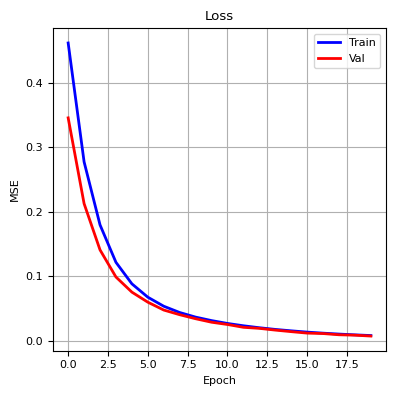

100%|██████████| 33/33 [01:28<00:00,  2.67s/it]


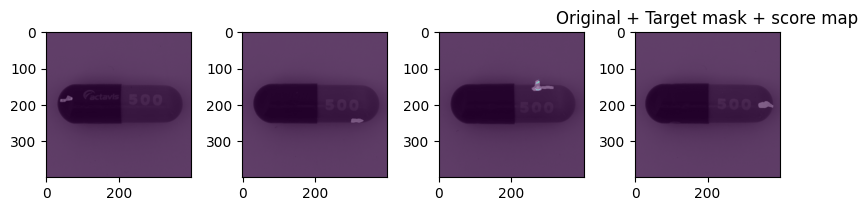

280 280


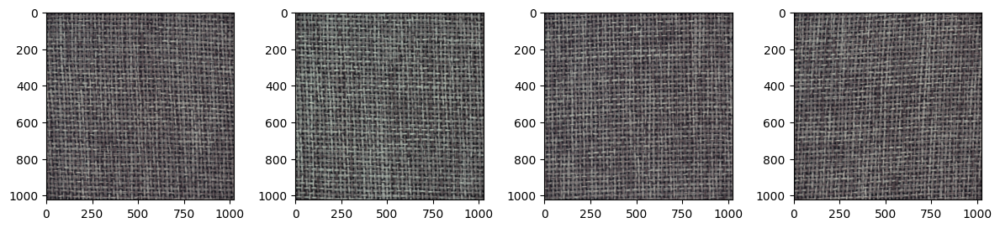

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.348: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.381


loss = 0.335: 100%|██████████| 7/7 [00:01<00:00,  4.11it/s]


Validation loss: 0.338

Epoch 2/20


loss = 0.300: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.322


loss = 0.307: 100%|██████████| 7/7 [00:01<00:00,  4.12it/s]


Validation loss: 0.323

Epoch 3/20


loss = 0.156: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.241


loss = 0.264: 100%|██████████| 7/7 [00:01<00:00,  3.90it/s]


Validation loss: 0.485

Epoch 4/20


loss = 0.072: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.111


loss = 0.154: 100%|██████████| 7/7 [00:01<00:00,  3.92it/s]


Validation loss: 0.370

Epoch 5/20


loss = 0.049: 100%|██████████| 63/63 [00:47<00:00,  1.33it/s]


Train loss: 0.062


loss = 0.055: 100%|██████████| 7/7 [00:01<00:00,  3.95it/s]


Validation loss: 0.081

Epoch 6/20


loss = 0.036: 100%|██████████| 63/63 [00:47<00:00,  1.33it/s]


Train loss: 0.043


loss = 0.039: 100%|██████████| 7/7 [00:01<00:00,  4.09it/s]


Validation loss: 0.052

Epoch 7/20


loss = 0.035: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.036


loss = 0.036: 100%|██████████| 7/7 [00:01<00:00,  3.95it/s]


Validation loss: 0.043

Epoch 8/20


loss = 0.024: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.027


loss = 0.024: 100%|██████████| 7/7 [00:01<00:00,  3.82it/s]


Validation loss: 0.039

Epoch 9/20


loss = 0.020: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.022


loss = 0.020: 100%|██████████| 7/7 [00:01<00:00,  4.25it/s]


Validation loss: 0.040

Epoch 10/20


loss = 0.018: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.018


loss = 0.021: 100%|██████████| 7/7 [00:01<00:00,  3.98it/s]


Validation loss: 0.087

Epoch 11/20


loss = 0.013: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.015


loss = 0.014: 100%|██████████| 7/7 [00:01<00:00,  4.05it/s]


Validation loss: 0.021

Epoch 12/20


loss = 0.011: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.014


loss = 0.013: 100%|██████████| 7/7 [00:01<00:00,  4.07it/s]


Validation loss: 0.024

Epoch 13/20


loss = 0.009: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.011


loss = 0.010: 100%|██████████| 7/7 [00:01<00:00,  3.98it/s]


Validation loss: 0.018

Epoch 14/20


loss = 0.010: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.010


loss = 0.009: 100%|██████████| 7/7 [00:01<00:00,  4.01it/s]


Validation loss: 0.022

Epoch 15/20


loss = 0.008: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.009


loss = 0.009: 100%|██████████| 7/7 [00:01<00:00,  4.10it/s]


Validation loss: 0.025

Epoch 16/20


loss = 0.007: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.008


loss = 0.008: 100%|██████████| 7/7 [00:01<00:00,  4.03it/s]


Validation loss: 0.023

Epoch 17/20


loss = 0.006: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.007


loss = 0.006: 100%|██████████| 7/7 [00:01<00:00,  3.96it/s]


Validation loss: 0.012

Epoch 18/20


loss = 0.006: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.006


loss = 0.006: 100%|██████████| 7/7 [00:01<00:00,  4.18it/s]


Validation loss: 0.016

Epoch 19/20


loss = 0.006: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.006


loss = 0.006: 100%|██████████| 7/7 [00:01<00:00,  3.88it/s]


Validation loss: 0.016

Epoch 20/20


loss = 0.005: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train loss: 0.005


loss = 0.005: 100%|██████████| 7/7 [00:01<00:00,  4.09it/s]

Validation loss: 0.015


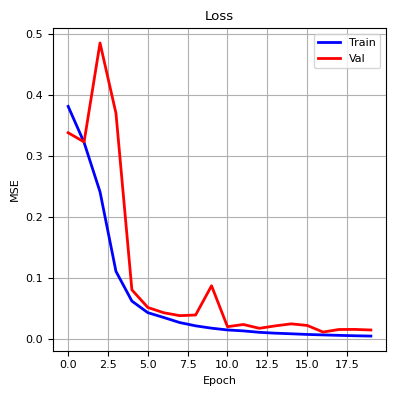

100%|██████████| 30/30 [00:07<00:00,  4.01it/s]


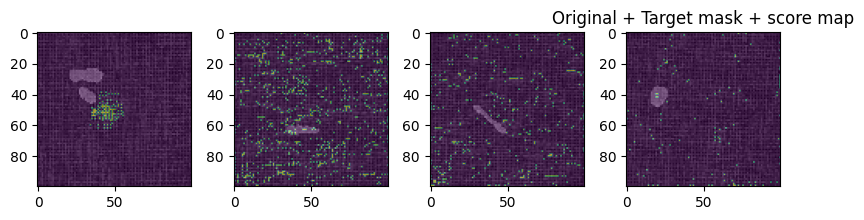

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.240: 100%|██████████| 63/63 [02:28<00:00,  2.36s/it]


Train loss: 0.278


loss = 0.224: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]


Validation loss: 0.230

Epoch 2/20


loss = 0.113: 100%|██████████| 63/63 [02:30<00:00,  2.40s/it]


Train loss: 0.190


loss = 0.138: 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]


Validation loss: 0.242

Epoch 3/20


loss = 0.035: 100%|██████████| 63/63 [02:30<00:00,  2.38s/it]


Train loss: 0.064


loss = 0.038: 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]


Validation loss: 0.044

Epoch 4/20


loss = 0.020: 100%|██████████| 63/63 [02:29<00:00,  2.37s/it]


Train loss: 0.028


loss = 0.021: 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]


Validation loss: 0.024

Epoch 5/20


loss = 0.015: 100%|██████████| 63/63 [02:29<00:00,  2.38s/it]


Train loss: 0.017


loss = 0.014: 100%|██████████| 7/7 [00:05<00:00,  1.28it/s]


Validation loss: 0.020

Epoch 6/20


loss = 0.010: 100%|██████████| 63/63 [02:28<00:00,  2.35s/it]


Train loss: 0.013


loss = 0.011: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]


Validation loss: 0.018

Epoch 7/20


loss = 0.008: 100%|██████████| 63/63 [02:28<00:00,  2.36s/it]


Train loss: 0.010


loss = 0.009: 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]


Validation loss: 0.016

Epoch 8/20


loss = 0.009: 100%|██████████| 63/63 [02:28<00:00,  2.36s/it]


Train loss: 0.009


loss = 0.009: 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]


Validation loss: 0.013

Epoch 9/20


loss = 0.007: 100%|██████████| 63/63 [02:28<00:00,  2.36s/it]


Train loss: 0.007


loss = 0.006: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]


Validation loss: 0.010

Epoch 10/20


loss = 0.005: 100%|██████████| 63/63 [02:28<00:00,  2.36s/it]


Train loss: 0.006


loss = 0.005: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]


Validation loss: 0.007

Epoch 11/20


loss = 0.005: 100%|██████████| 63/63 [02:31<00:00,  2.41s/it]


Train loss: 0.005


loss = 0.005: 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]


Validation loss: 0.008

Epoch 12/20


loss = 0.004: 100%|██████████| 63/63 [02:28<00:00,  2.36s/it]


Train loss: 0.005


loss = 0.004: 100%|██████████| 7/7 [00:05<00:00,  1.40it/s]


Validation loss: 0.009

Epoch 13/20


loss = 0.004: 100%|██████████| 63/63 [02:28<00:00,  2.36s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]


Validation loss: 0.007

Epoch 14/20


loss = 0.004: 100%|██████████| 63/63 [02:28<00:00,  2.35s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]


Validation loss: 0.007

Epoch 15/20


loss = 0.003: 100%|██████████| 63/63 [02:28<00:00,  2.35s/it]


Train loss: 0.004


loss = 0.003: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]


Validation loss: 0.006

Epoch 16/20


loss = 0.003: 100%|██████████| 63/63 [02:28<00:00,  2.36s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]


Validation loss: 0.007

Epoch 17/20


loss = 0.003: 100%|██████████| 63/63 [02:28<00:00,  2.35s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]


Validation loss: 0.008

Epoch 18/20


loss = 0.003: 100%|██████████| 63/63 [02:28<00:00,  2.35s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]


Validation loss: 0.009

Epoch 19/20


loss = 0.003: 100%|██████████| 63/63 [02:28<00:00,  2.36s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]


Validation loss: 0.006

Epoch 20/20


loss = 0.002: 100%|██████████| 63/63 [02:28<00:00,  2.35s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]

Validation loss: 0.006


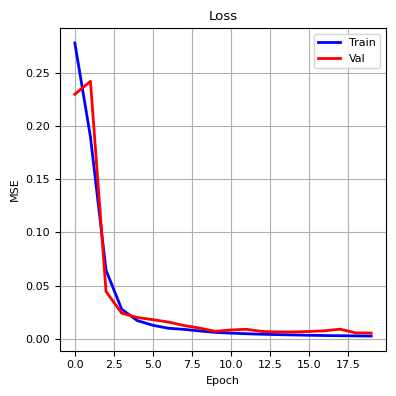

100%|██████████| 30/30 [00:21<00:00,  1.41it/s]


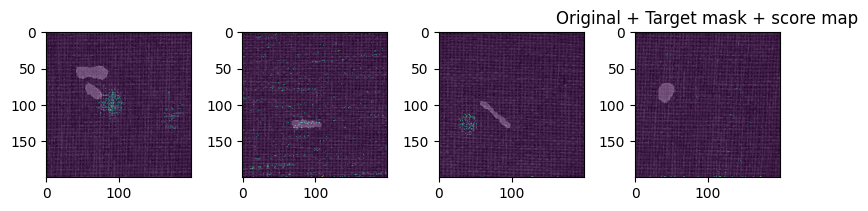

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.055: 100%|██████████| 63/63 [10:51<00:00, 10.34s/it]


Train loss: 0.082


loss = 0.050: 100%|██████████| 7/7 [00:19<00:00,  2.72s/it]


Validation loss: 0.051

Epoch 2/20


loss = 0.032: 100%|██████████| 63/63 [10:38<00:00, 10.13s/it]


Train loss: 0.042


loss = 0.033: 100%|██████████| 7/7 [00:18<00:00,  2.63s/it]


Validation loss: 0.034

Epoch 3/20


loss = 0.020: 100%|██████████| 63/63 [10:18<00:00,  9.82s/it]


Train loss: 0.026


loss = 0.021: 100%|██████████| 7/7 [00:18<00:00,  2.65s/it]


Validation loss: 0.021

Epoch 4/20


loss = 0.015: 100%|██████████| 63/63 [09:59<00:00,  9.52s/it]


Train loss: 0.017


loss = 0.015: 100%|██████████| 7/7 [00:18<00:00,  2.64s/it]


Validation loss: 0.015

Epoch 5/20


loss = 0.011: 100%|██████████| 63/63 [09:51<00:00,  9.40s/it]


Train loss: 0.012


loss = 0.011: 100%|██████████| 7/7 [00:18<00:00,  2.63s/it]


Validation loss: 0.011

Epoch 6/20


loss = 0.008: 100%|██████████| 63/63 [09:50<00:00,  9.38s/it]


Train loss: 0.009


loss = 0.008: 100%|██████████| 7/7 [00:18<00:00,  2.65s/it]


Validation loss: 0.008

Epoch 7/20


loss = 0.006: 100%|██████████| 63/63 [09:52<00:00,  9.41s/it]


Train loss: 0.007


loss = 0.007: 100%|██████████| 7/7 [00:18<00:00,  2.64s/it]


Validation loss: 0.007

Epoch 8/20


loss = 0.005: 100%|██████████| 63/63 [09:55<00:00,  9.45s/it]


Train loss: 0.006


loss = 0.005: 100%|██████████| 7/7 [00:18<00:00,  2.64s/it]


Validation loss: 0.006

Epoch 9/20


loss = 0.004: 100%|██████████| 63/63 [09:56<00:00,  9.48s/it]


Train loss: 0.005


loss = 0.005: 100%|██████████| 7/7 [00:20<00:00,  2.96s/it]


Validation loss: 0.005

Epoch 10/20


loss = 0.004: 100%|██████████| 63/63 [10:23<00:00,  9.89s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 7/7 [00:19<00:00,  2.73s/it]


Validation loss: 0.004

Epoch 11/20


loss = 0.004: 100%|██████████| 63/63 [10:23<00:00,  9.90s/it]


Train loss: 0.004


loss = 0.003: 100%|██████████| 7/7 [00:18<00:00,  2.69s/it]


Validation loss: 0.004

Epoch 12/20


loss = 0.003: 100%|██████████| 63/63 [10:28<00:00,  9.98s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 7/7 [00:19<00:00,  2.82s/it]


Validation loss: 0.003

Epoch 13/20


loss = 0.003: 100%|██████████| 63/63 [10:25<00:00,  9.94s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 7/7 [00:18<00:00,  2.70s/it]


Validation loss: 0.003

Epoch 14/20


loss = 0.003: 100%|██████████| 63/63 [10:32<00:00, 10.04s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 7/7 [00:18<00:00,  2.68s/it]


Validation loss: 0.003

Epoch 15/20


loss = 0.002: 100%|██████████| 63/63 [14:09<00:00, 13.48s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:18<00:00,  2.63s/it]


Validation loss: 0.002

Epoch 16/20


loss = 0.002: 100%|██████████| 63/63 [10:16<00:00,  9.78s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:18<00:00,  2.63s/it]


Validation loss: 0.002

Epoch 17/20


loss = 0.002: 100%|██████████| 63/63 [10:26<00:00,  9.95s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:17<00:00,  2.57s/it]


Validation loss: 0.002

Epoch 18/20


loss = 0.002: 100%|██████████| 63/63 [10:21<00:00,  9.86s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:18<00:00,  2.62s/it]


Validation loss: 0.002

Epoch 19/20


loss = 0.002: 100%|██████████| 63/63 [10:21<00:00,  9.86s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:18<00:00,  2.63s/it]


Validation loss: 0.002

Epoch 20/20


loss = 0.002: 100%|██████████| 63/63 [10:27<00:00,  9.96s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:18<00:00,  2.63s/it]

Validation loss: 0.002


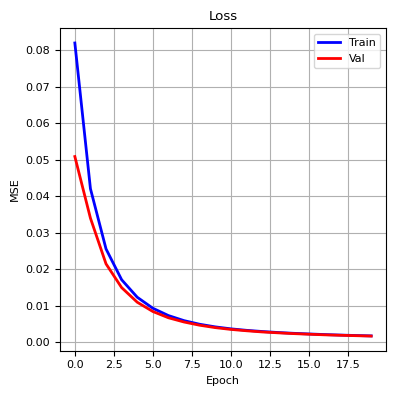

100%|██████████| 30/30 [01:18<00:00,  2.60s/it]


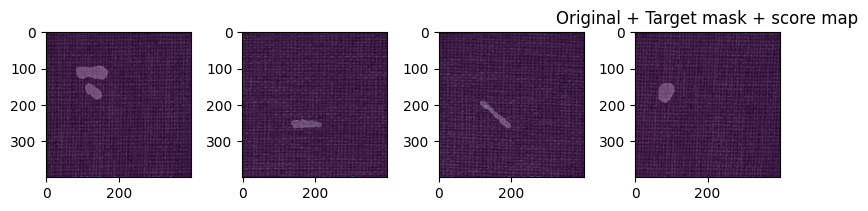

264 264


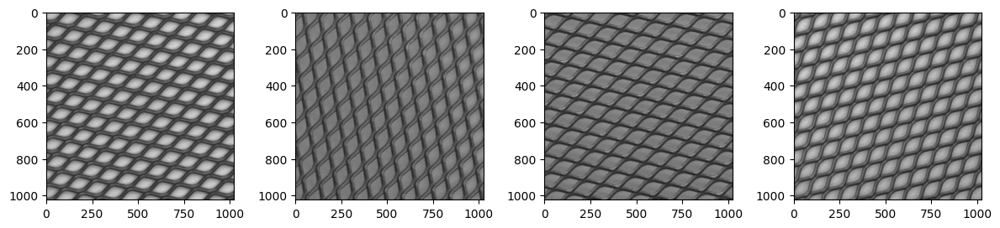

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.349: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]


Train loss: 0.386


loss = 0.346: 100%|██████████| 7/7 [00:01<00:00,  4.43it/s]


Validation loss: 0.328

Epoch 2/20


loss = 0.301: 100%|██████████| 60/60 [00:44<00:00,  1.34it/s]


Train loss: 0.318


loss = 0.336: 100%|██████████| 7/7 [00:01<00:00,  4.34it/s]


Validation loss: 0.323

Epoch 3/20


loss = 0.217: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]


Train loss: 0.259


loss = 0.237: 100%|██████████| 7/7 [00:01<00:00,  4.45it/s]


Validation loss: 0.308

Epoch 4/20


loss = 0.102: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]


Train loss: 0.155


loss = 0.104: 100%|██████████| 7/7 [00:01<00:00,  4.23it/s]


Validation loss: 0.118

Epoch 5/20


loss = 0.052: 100%|██████████| 60/60 [00:44<00:00,  1.34it/s]


Train loss: 0.071


loss = 0.048: 100%|██████████| 7/7 [00:01<00:00,  4.29it/s]


Validation loss: 0.056

Epoch 6/20


loss = 0.045: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]


Train loss: 0.045


loss = 0.032: 100%|██████████| 7/7 [00:01<00:00,  4.42it/s]


Validation loss: 0.046

Epoch 7/20


loss = 0.032: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]


Train loss: 0.036


loss = 0.026: 100%|██████████| 7/7 [00:01<00:00,  4.31it/s]


Validation loss: 0.032

Epoch 8/20


loss = 0.036: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]


Train loss: 0.027


loss = 0.020: 100%|██████████| 7/7 [00:01<00:00,  4.28it/s]


Validation loss: 0.025

Epoch 9/20


loss = 0.057: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]


Train loss: 0.022


loss = 0.017: 100%|██████████| 7/7 [00:01<00:00,  4.37it/s]


Validation loss: 0.021

Epoch 10/20


loss = 0.032: 100%|██████████| 60/60 [00:44<00:00,  1.34it/s]


Train loss: 0.020


loss = 0.014: 100%|██████████| 7/7 [00:01<00:00,  4.43it/s]


Validation loss: 0.018

Epoch 11/20


loss = 0.014: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]


Train loss: 0.016


loss = 0.011: 100%|██████████| 7/7 [00:01<00:00,  4.25it/s]


Validation loss: 0.015

Epoch 12/20


loss = 0.011: 100%|██████████| 60/60 [00:44<00:00,  1.34it/s]


Train loss: 0.014


loss = 0.010: 100%|██████████| 7/7 [00:01<00:00,  4.30it/s]


Validation loss: 0.013

Epoch 13/20


loss = 0.012: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]


Train loss: 0.012


loss = 0.009: 100%|██████████| 7/7 [00:01<00:00,  4.31it/s]


Validation loss: 0.011

Epoch 14/20


loss = 0.012: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]


Train loss: 0.011


loss = 0.008: 100%|██████████| 7/7 [00:01<00:00,  3.94it/s]


Validation loss: 0.010

Epoch 15/20


loss = 0.010: 100%|██████████| 60/60 [00:44<00:00,  1.34it/s]


Train loss: 0.009


loss = 0.007: 100%|██████████| 7/7 [00:01<00:00,  4.35it/s]


Validation loss: 0.009

Epoch 16/20


loss = 0.014: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]


Train loss: 0.008


loss = 0.006: 100%|██████████| 7/7 [00:01<00:00,  4.30it/s]


Validation loss: 0.008

Epoch 17/20


loss = 0.010: 100%|██████████| 60/60 [00:45<00:00,  1.33it/s]


Train loss: 0.007


loss = 0.005: 100%|██████████| 7/7 [00:01<00:00,  4.31it/s]


Validation loss: 0.007

Epoch 18/20


loss = 0.008: 100%|██████████| 60/60 [00:45<00:00,  1.32it/s]


Train loss: 0.007


loss = 0.005: 100%|██████████| 7/7 [00:01<00:00,  3.82it/s]


Validation loss: 0.006

Epoch 19/20


loss = 0.007: 100%|██████████| 60/60 [00:44<00:00,  1.34it/s]


Train loss: 0.008


loss = 0.005: 100%|██████████| 7/7 [00:01<00:00,  4.31it/s]


Validation loss: 0.006

Epoch 20/20


loss = 0.007: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]


Train loss: 0.006


loss = 0.005: 100%|██████████| 7/7 [00:01<00:00,  4.37it/s]


Validation loss: 0.006


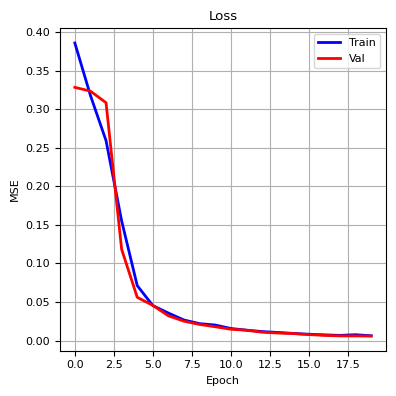

100%|██████████| 20/20 [00:04<00:00,  4.08it/s]


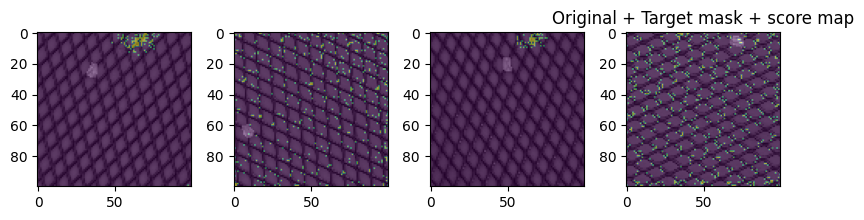

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.235: 100%|██████████| 60/60 [02:18<00:00,  2.31s/it]


Train loss: 0.273


loss = 0.217: 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


Validation loss: 0.223

Epoch 2/20


loss = 0.158: 100%|██████████| 60/60 [02:17<00:00,  2.30s/it]


Train loss: 0.185


loss = 0.145: 100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


Validation loss: 0.151

Epoch 3/20


loss = 0.068: 100%|██████████| 60/60 [02:17<00:00,  2.29s/it]


Train loss: 0.116


loss = 0.083: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.090

Epoch 4/20


loss = 0.056: 100%|██████████| 60/60 [02:18<00:00,  2.31s/it]


Train loss: 0.073


loss = 0.048: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.057

Epoch 5/20


loss = 0.032: 100%|██████████| 60/60 [02:17<00:00,  2.30s/it]


Train loss: 0.041


loss = 0.025: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.035

Epoch 6/20


loss = 0.018: 100%|██████████| 60/60 [02:17<00:00,  2.30s/it]


Train loss: 0.023


loss = 0.013: 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


Validation loss: 0.016

Epoch 7/20


loss = 0.011: 100%|██████████| 60/60 [02:17<00:00,  2.30s/it]


Train loss: 0.014


loss = 0.009: 100%|██████████| 7/7 [00:04<00:00,  1.44it/s]


Validation loss: 0.016

Epoch 8/20


loss = 0.010: 100%|██████████| 60/60 [02:17<00:00,  2.29s/it]


Train loss: 0.012


loss = 0.007: 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


Validation loss: 0.014

Epoch 9/20


loss = 0.005: 100%|██████████| 60/60 [02:17<00:00,  2.29s/it]


Train loss: 0.009


loss = 0.005: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.008

Epoch 10/20


loss = 0.010: 100%|██████████| 60/60 [02:18<00:00,  2.30s/it]


Train loss: 0.007


loss = 0.004: 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


Validation loss: 0.005

Epoch 11/20


loss = 0.008: 100%|██████████| 60/60 [02:17<00:00,  2.29s/it]


Train loss: 0.006


loss = 0.004: 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


Validation loss: 0.013

Epoch 12/20


loss = 0.005: 100%|██████████| 60/60 [02:20<00:00,  2.34s/it]


Train loss: 0.005


loss = 0.003: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.004

Epoch 13/20


loss = 0.003: 100%|██████████| 60/60 [02:19<00:00,  2.33s/it]


Train loss: 0.004


loss = 0.003: 100%|██████████| 7/7 [00:04<00:00,  1.51it/s]


Validation loss: 0.005

Epoch 14/20


loss = 0.003: 100%|██████████| 60/60 [02:18<00:00,  2.31s/it]


Train loss: 0.004


loss = 0.002: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.003

Epoch 15/20


loss = 0.004: 100%|██████████| 60/60 [02:17<00:00,  2.30s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


Validation loss: 0.003

Epoch 16/20


loss = 0.003: 100%|██████████| 60/60 [02:17<00:00,  2.29s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


Validation loss: 0.003

Epoch 17/20


loss = 0.004: 100%|██████████| 60/60 [02:17<00:00,  2.29s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.002

Epoch 18/20


loss = 0.003: 100%|██████████| 60/60 [02:17<00:00,  2.30s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


Validation loss: 0.002

Epoch 19/20


loss = 0.004: 100%|██████████| 60/60 [09:25<00:00,  9.42s/it] 


Train loss: 0.003


loss = 0.001: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.002

Epoch 20/20


loss = 0.003: 100%|██████████| 60/60 [02:27<00:00,  2.46s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]

Validation loss: 0.002


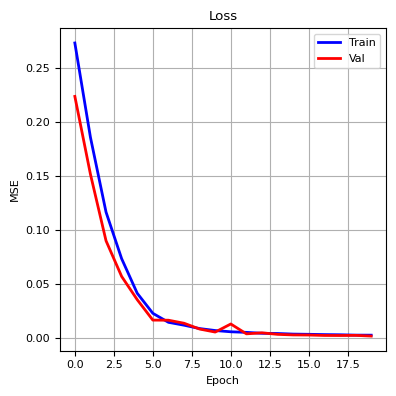

100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


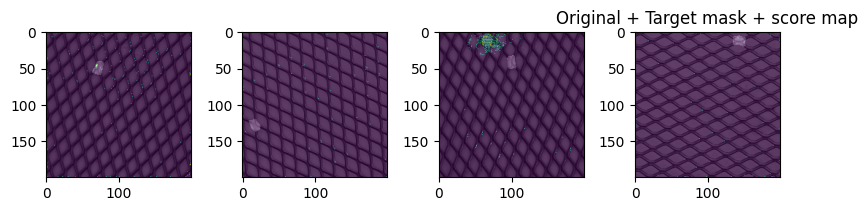

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.125: 100%|██████████| 60/60 [10:43<00:00, 10.73s/it]


Train loss: 0.159


loss = 0.107: 100%|██████████| 7/7 [00:18<00:00,  2.65s/it]


Validation loss: 0.105

Epoch 2/20


loss = 0.083: 100%|██████████| 60/60 [10:47<00:00, 10.80s/it]


Train loss: 0.095


loss = 0.075: 100%|██████████| 7/7 [00:18<00:00,  2.66s/it]


Validation loss: 0.075

Epoch 3/20


loss = 0.040: 100%|██████████| 60/60 [10:46<00:00, 10.77s/it]


Train loss: 0.058


loss = 0.041: 100%|██████████| 7/7 [00:19<00:00,  2.72s/it]


Validation loss: 0.042

Epoch 4/20


loss = 0.021: 100%|██████████| 60/60 [10:33<00:00, 10.55s/it]


Train loss: 0.031


loss = 0.023: 100%|██████████| 7/7 [00:19<00:00,  2.72s/it]


Validation loss: 0.023

Epoch 5/20


loss = 0.019: 100%|██████████| 60/60 [10:41<00:00, 10.70s/it]


Train loss: 0.018


loss = 0.013: 100%|██████████| 7/7 [00:19<00:00,  2.75s/it]


Validation loss: 0.014

Epoch 6/20


loss = 0.014: 100%|██████████| 60/60 [10:55<00:00, 10.92s/it]


Train loss: 0.011


loss = 0.008: 100%|██████████| 7/7 [00:19<00:00,  2.80s/it]


Validation loss: 0.008

Epoch 7/20


loss = 0.005: 100%|██████████| 60/60 [10:33<00:00, 10.56s/it]


Train loss: 0.008


loss = 0.005: 100%|██████████| 7/7 [00:17<00:00,  2.51s/it]


Validation loss: 0.006

Epoch 8/20


loss = 0.004: 100%|██████████| 60/60 [08:47<00:00,  8.79s/it]


Train loss: 0.006


loss = 0.004: 100%|██████████| 7/7 [00:17<00:00,  2.49s/it]


Validation loss: 0.005

Epoch 9/20


loss = 0.005: 100%|██████████| 60/60 [08:59<00:00,  8.98s/it]


Train loss: 0.005


loss = 0.003: 100%|██████████| 7/7 [00:17<00:00,  2.54s/it]


Validation loss: 0.004

Epoch 10/20


loss = 0.003: 100%|██████████| 60/60 [09:15<00:00,  9.26s/it]


Train loss: 0.004


loss = 0.003: 100%|██████████| 7/7 [00:17<00:00,  2.49s/it]


Validation loss: 0.003

Epoch 11/20


loss = 0.003: 100%|██████████| 60/60 [09:17<00:00,  9.29s/it]


Train loss: 0.004


loss = 0.002: 100%|██████████| 7/7 [00:17<00:00,  2.49s/it]


Validation loss: 0.003

Epoch 12/20


loss = 0.004: 100%|██████████| 60/60 [09:18<00:00,  9.30s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 7/7 [00:17<00:00,  2.51s/it]


Validation loss: 0.002

Epoch 13/20


loss = 0.002: 100%|██████████| 60/60 [09:40<00:00,  9.68s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 7/7 [00:17<00:00,  2.54s/it]


Validation loss: 0.002

Epoch 14/20


loss = 0.003: 100%|██████████| 60/60 [09:48<00:00,  9.81s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 7/7 [00:18<00:00,  2.61s/it]


Validation loss: 0.002

Epoch 15/20


loss = 0.003: 100%|██████████| 60/60 [09:42<00:00,  9.71s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 7/7 [00:17<00:00,  2.56s/it]


Validation loss: 0.002

Epoch 16/20


loss = 0.004: 100%|██████████| 60/60 [09:51<00:00,  9.86s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:17<00:00,  2.47s/it]


Validation loss: 0.002

Epoch 17/20


loss = 0.004: 100%|██████████| 60/60 [09:51<00:00,  9.86s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 7/7 [00:17<00:00,  2.52s/it]


Validation loss: 0.002

Epoch 18/20


loss = 0.002: 100%|██████████| 60/60 [09:44<00:00,  9.74s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 7/7 [00:17<00:00,  2.44s/it]


Validation loss: 0.001

Epoch 19/20


loss = 0.002: 100%|██████████| 60/60 [09:56<00:00,  9.94s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 7/7 [00:17<00:00,  2.49s/it]


Validation loss: 0.001

Epoch 20/20


loss = 0.003: 100%|██████████| 60/60 [09:49<00:00,  9.83s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 7/7 [00:17<00:00,  2.50s/it]

Validation loss: 0.001


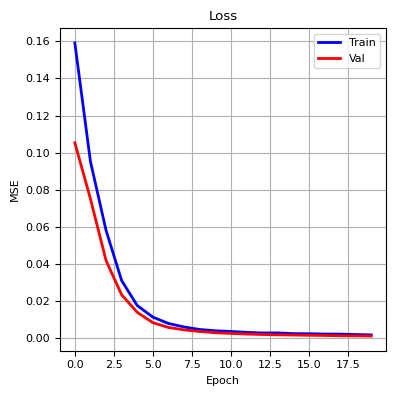

100%|██████████| 20/20 [00:52<00:00,  2.61s/it]


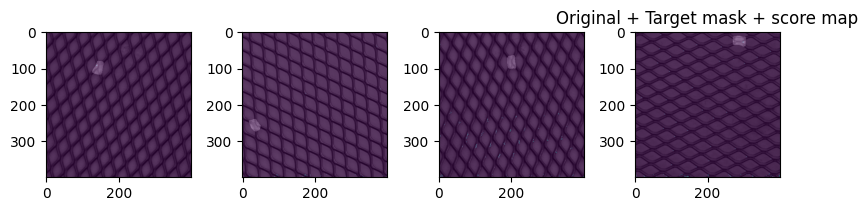

391 391


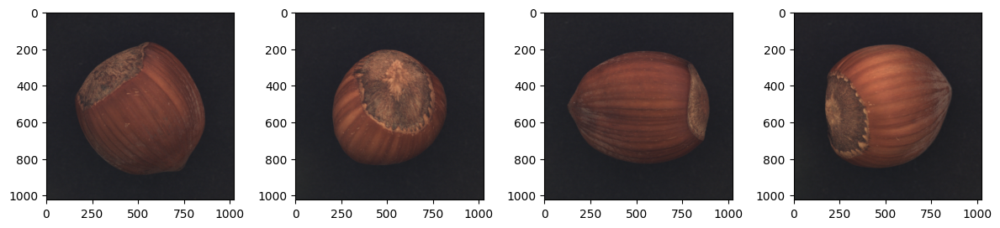

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.030: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.057


loss = 0.026: 100%|██████████| 10/10 [00:02<00:00,  3.97it/s]


Validation loss: 0.030

Epoch 2/20


loss = 0.011: 100%|██████████| 88/88 [01:05<00:00,  1.33it/s]


Train loss: 0.018


loss = 0.010: 100%|██████████| 10/10 [00:02<00:00,  4.28it/s]


Validation loss: 0.012

Epoch 3/20


loss = 0.006: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.008


loss = 0.005: 100%|██████████| 10/10 [00:02<00:00,  4.20it/s]


Validation loss: 0.006

Epoch 4/20


loss = 0.003: 100%|██████████| 88/88 [01:05<00:00,  1.35it/s]


Train loss: 0.004


loss = 0.003: 100%|██████████| 10/10 [00:02<00:00,  4.21it/s]


Validation loss: 0.004

Epoch 5/20


loss = 0.003: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.003


loss = 0.002: 100%|██████████| 10/10 [00:02<00:00,  4.13it/s]


Validation loss: 0.003

Epoch 6/20


loss = 0.002: 100%|██████████| 88/88 [01:05<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 10/10 [00:02<00:00,  4.16it/s]


Validation loss: 0.002

Epoch 7/20


loss = 0.002: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.002


loss = 0.001: 100%|██████████| 10/10 [00:02<00:00,  4.13it/s]


Validation loss: 0.002

Epoch 8/20


loss = 0.002: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.002


loss = 0.001: 100%|██████████| 10/10 [00:02<00:00,  4.24it/s]


Validation loss: 0.001

Epoch 9/20


loss = 0.001: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:02<00:00,  4.20it/s]


Validation loss: 0.001

Epoch 10/20


loss = 0.001: 100%|██████████| 88/88 [01:06<00:00,  1.33it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:02<00:00,  4.15it/s]


Validation loss: 0.001

Epoch 11/20


loss = 0.001: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:02<00:00,  4.22it/s]


Validation loss: 0.001

Epoch 12/20


loss = 0.001: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:02<00:00,  4.23it/s]


Validation loss: 0.001

Epoch 13/20


loss = 0.001: 100%|██████████| 88/88 [01:05<00:00,  1.33it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:02<00:00,  4.21it/s]


Validation loss: 0.001

Epoch 14/20


loss = 0.001: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:02<00:00,  4.09it/s]


Validation loss: 0.001

Epoch 15/20


loss = 0.001: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:02<00:00,  4.23it/s]


Validation loss: 0.001

Epoch 16/20


loss = 0.000: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:02<00:00,  4.11it/s]


Validation loss: 0.001

Epoch 17/20


loss = 0.001: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:02<00:00,  4.22it/s]


Validation loss: 0.001

Epoch 18/20


loss = 0.001: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:02<00:00,  4.03it/s]


Validation loss: 0.000

Epoch 19/20


loss = 0.001: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:02<00:00,  4.19it/s]


Validation loss: 0.000

Epoch 20/20


loss = 0.001: 100%|██████████| 88/88 [01:05<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:02<00:00,  4.14it/s]


Validation loss: 0.000


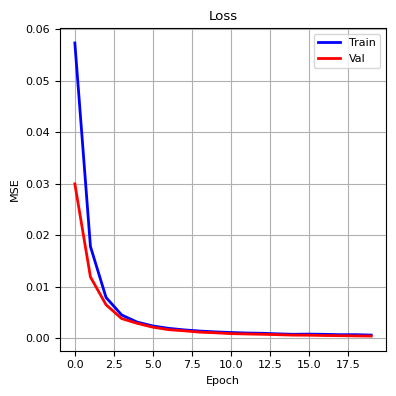

100%|██████████| 28/28 [00:06<00:00,  4.03it/s]


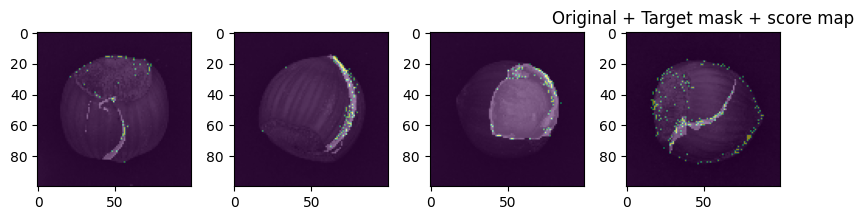

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.048: 100%|██████████| 88/88 [03:25<00:00,  2.33s/it]


Train loss: 0.113


loss = 0.044: 100%|██████████| 10/10 [00:07<00:00,  1.42it/s]


Validation loss: 0.051

Epoch 2/20


loss = 0.010: 100%|██████████| 88/88 [03:23<00:00,  2.31s/it]


Train loss: 0.025


loss = 0.011: 100%|██████████| 10/10 [00:07<00:00,  1.42it/s]


Validation loss: 0.026

Epoch 3/20


loss = 0.005: 100%|██████████| 88/88 [03:30<00:00,  2.40s/it]


Train loss: 0.008


loss = 0.005: 100%|██████████| 10/10 [00:07<00:00,  1.36it/s]


Validation loss: 0.012

Epoch 4/20


loss = 0.004: 100%|██████████| 88/88 [03:32<00:00,  2.42s/it]


Train loss: 0.005


loss = 0.003: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]


Validation loss: 0.009

Epoch 5/20


loss = 0.003: 100%|██████████| 88/88 [03:31<00:00,  2.40s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]


Validation loss: 0.007

Epoch 6/20


loss = 0.004: 100%|██████████| 88/88 [03:33<00:00,  2.42s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 10/10 [00:07<00:00,  1.40it/s]


Validation loss: 0.006

Epoch 7/20


loss = 0.002: 100%|██████████| 88/88 [03:30<00:00,  2.40s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]


Validation loss: 0.004

Epoch 8/20


loss = 0.002: 100%|██████████| 88/88 [03:31<00:00,  2.40s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]


Validation loss: 0.007

Epoch 9/20


loss = 0.003: 100%|██████████| 88/88 [03:48<00:00,  2.60s/it]


Train loss: 0.002


loss = 0.003: 100%|██████████| 10/10 [00:07<00:00,  1.28it/s]


Validation loss: 0.012

Epoch 10/20


loss = 0.001: 100%|██████████| 88/88 [03:38<00:00,  2.49s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 10/10 [00:07<00:00,  1.42it/s]


Validation loss: 0.002

Epoch 11/20


loss = 0.001: 100%|██████████| 88/88 [03:29<00:00,  2.38s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:07<00:00,  1.40it/s]


Validation loss: 0.002

Epoch 12/20


loss = 0.001: 100%|██████████| 88/88 [03:28<00:00,  2.37s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


Validation loss: 0.001

Epoch 13/20


loss = 0.001: 100%|██████████| 88/88 [03:29<00:00,  2.38s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:07<00:00,  1.42it/s]


Validation loss: 0.002

Epoch 14/20


loss = 0.001: 100%|██████████| 88/88 [03:29<00:00,  2.38s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


Validation loss: 0.003

Epoch 15/20


loss = 0.001: 100%|██████████| 88/88 [03:28<00:00,  2.37s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


Validation loss: 0.002

Epoch 16/20


loss = 0.001: 100%|██████████| 88/88 [03:28<00:00,  2.37s/it]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


Validation loss: 0.001

Epoch 17/20


loss = 0.001: 100%|██████████| 88/88 [03:28<00:00,  2.37s/it]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


Validation loss: 0.002

Epoch 18/20


loss = 0.001: 100%|██████████| 88/88 [03:29<00:00,  2.38s/it]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


Validation loss: 0.002

Epoch 19/20


loss = 0.000: 100%|██████████| 88/88 [03:29<00:00,  2.38s/it]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


Validation loss: 0.003

Epoch 20/20


loss = 0.001: 100%|██████████| 88/88 [03:28<00:00,  2.37s/it]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:07<00:00,  1.42it/s]

Validation loss: 0.001


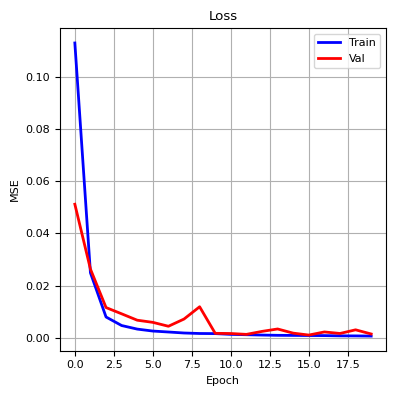

100%|██████████| 28/28 [00:20<00:00,  1.38it/s]


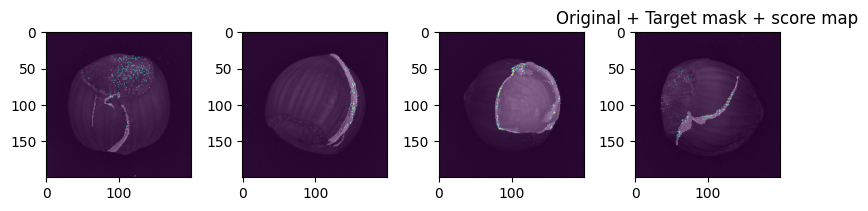

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.066: 100%|██████████| 88/88 [14:39<00:00,  9.99s/it]


Train loss: 0.182


loss = 0.064: 100%|██████████| 10/10 [00:26<00:00,  2.60s/it]


Validation loss: 0.073

Epoch 2/20


loss = 0.012: 100%|██████████| 88/88 [14:14<00:00,  9.71s/it]


Train loss: 0.030


loss = 0.024: 100%|██████████| 10/10 [00:26<00:00,  2.62s/it]


Validation loss: 0.138

Epoch 3/20


loss = 0.005: 100%|██████████| 88/88 [14:29<00:00,  9.88s/it]


Train loss: 0.008


loss = 0.005: 100%|██████████| 10/10 [00:26<00:00,  2.61s/it]


Validation loss: 0.019

Epoch 4/20


loss = 0.004: 100%|██████████| 88/88 [14:16<00:00,  9.74s/it]


Train loss: 0.004


loss = 0.003: 100%|██████████| 10/10 [00:26<00:00,  2.62s/it]


Validation loss: 0.027

Epoch 5/20


loss = 0.003: 100%|██████████| 88/88 [14:06<00:00,  9.62s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 10/10 [00:26<00:00,  2.66s/it]


Validation loss: 0.014

Epoch 6/20


loss = 0.002: 100%|██████████| 88/88 [14:17<00:00,  9.75s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 10/10 [00:26<00:00,  2.61s/it]


Validation loss: 0.009

Epoch 7/20


loss = 0.002: 100%|██████████| 88/88 [14:29<00:00,  9.88s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 10/10 [00:26<00:00,  2.69s/it]


Validation loss: 0.024

Epoch 8/20


loss = 0.001: 100%|██████████| 88/88 [14:38<00:00,  9.98s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 10/10 [00:26<00:00,  2.62s/it]


Validation loss: 0.011

Epoch 9/20


loss = 0.002: 100%|██████████| 88/88 [14:52<00:00, 10.14s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 10/10 [00:26<00:00,  2.65s/it]


Validation loss: 0.050

Epoch 10/20


loss = 0.001: 100%|██████████| 88/88 [12:59<00:00,  8.86s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:27<00:00,  2.70s/it]


Validation loss: 0.006

Epoch 11/20


loss = 0.001: 100%|██████████| 88/88 [13:02<00:00,  8.89s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:27<00:00,  2.73s/it]


Validation loss: 0.008

Epoch 12/20


loss = 0.001: 100%|██████████| 88/88 [13:08<00:00,  8.96s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:27<00:00,  2.71s/it]


Validation loss: 0.013

Epoch 13/20


loss = 0.001: 100%|██████████| 88/88 [13:19<00:00,  9.09s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:27<00:00,  2.76s/it]


Validation loss: 0.022

Epoch 14/20


loss = 0.001: 100%|██████████| 88/88 [13:29<00:00,  9.19s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:27<00:00,  2.78s/it]


Validation loss: 0.010

Epoch 15/20


loss = 0.001: 100%|██████████| 88/88 [13:48<00:00,  9.42s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:27<00:00,  2.74s/it]


Validation loss: 0.001

Epoch 16/20


loss = 0.001: 100%|██████████| 88/88 [14:01<00:00,  9.57s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 10/10 [00:27<00:00,  2.73s/it]


Validation loss: 0.002

Epoch 17/20


loss = 0.001: 100%|██████████| 88/88 [14:10<00:00,  9.67s/it]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:26<00:00,  2.65s/it]


Validation loss: 0.002

Epoch 18/20


loss = 0.001: 100%|██████████| 88/88 [14:12<00:00,  9.68s/it]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:26<00:00,  2.65s/it]


Validation loss: 0.002

Epoch 19/20


loss = 0.001: 100%|██████████| 88/88 [14:15<00:00,  9.72s/it]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:27<00:00,  2.73s/it]


Validation loss: 0.001

Epoch 20/20


loss = 0.000: 100%|██████████| 88/88 [14:16<00:00,  9.73s/it]


Train loss: 0.001


loss = 0.000: 100%|██████████| 10/10 [00:27<00:00,  2.70s/it]

Validation loss: 0.003


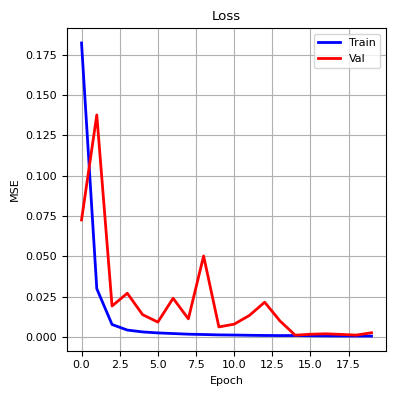

100%|██████████| 28/28 [01:19<00:00,  2.82s/it]


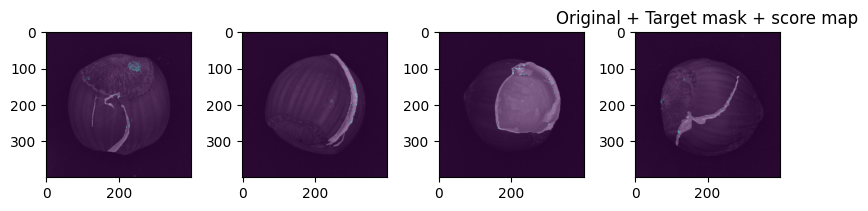

245 245


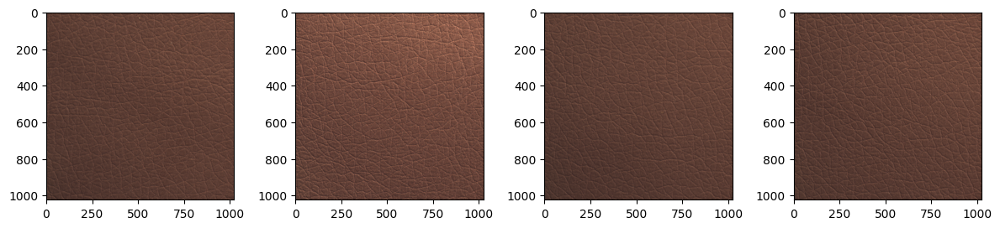

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.066: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


Train loss: 0.096


loss = 0.051: 100%|██████████| 6/6 [00:01<00:00,  3.79it/s]


Validation loss: 0.048

Epoch 2/20


loss = 0.048: 100%|██████████| 56/56 [00:41<00:00,  1.34it/s]


Train loss: 0.050


loss = 0.042: 100%|██████████| 6/6 [00:01<00:00,  3.77it/s]


Validation loss: 0.038

Epoch 3/20


loss = 0.019: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


Train loss: 0.028


loss = 0.025: 100%|██████████| 6/6 [00:01<00:00,  3.72it/s]


Validation loss: 0.022

Epoch 4/20


loss = 0.018: 100%|██████████| 56/56 [00:41<00:00,  1.36it/s]


Train loss: 0.017


loss = 0.016: 100%|██████████| 6/6 [00:01<00:00,  4.05it/s]


Validation loss: 0.014

Epoch 5/20


loss = 0.009: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


Train loss: 0.011


loss = 0.011: 100%|██████████| 6/6 [00:01<00:00,  3.67it/s]


Validation loss: 0.009

Epoch 6/20


loss = 0.007: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


Train loss: 0.008


loss = 0.008: 100%|██████████| 6/6 [00:01<00:00,  3.76it/s]


Validation loss: 0.007

Epoch 7/20


loss = 0.007: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


Train loss: 0.006


loss = 0.006: 100%|██████████| 6/6 [00:01<00:00,  3.69it/s]


Validation loss: 0.005

Epoch 8/20


loss = 0.006: 100%|██████████| 56/56 [00:41<00:00,  1.36it/s]


Train loss: 0.005


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  3.97it/s]


Validation loss: 0.004

Epoch 9/20


loss = 0.004: 100%|██████████| 56/56 [00:41<00:00,  1.36it/s]


Train loss: 0.004


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  3.65it/s]


Validation loss: 0.004

Epoch 10/20


loss = 0.005: 100%|██████████| 56/56 [00:41<00:00,  1.34it/s]


Train loss: 0.004


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  3.70it/s]


Validation loss: 0.003

Epoch 11/20


loss = 0.003: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  3.68it/s]


Validation loss: 0.003

Epoch 12/20


loss = 0.003: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  3.69it/s]


Validation loss: 0.003

Epoch 13/20


loss = 0.002: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


Train loss: 0.002


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  3.70it/s]


Validation loss: 0.002

Epoch 14/20


loss = 0.002: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


Train loss: 0.002


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  3.68it/s]


Validation loss: 0.002

Epoch 15/20


loss = 0.003: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  3.72it/s]


Validation loss: 0.002

Epoch 16/20


loss = 0.002: 100%|██████████| 56/56 [00:41<00:00,  1.34it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  3.79it/s]


Validation loss: 0.002

Epoch 17/20


loss = 0.002: 100%|██████████| 56/56 [00:41<00:00,  1.34it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  3.74it/s]


Validation loss: 0.002

Epoch 18/20


loss = 0.002: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  3.69it/s]


Validation loss: 0.001

Epoch 19/20


loss = 0.002: 100%|██████████| 56/56 [00:41<00:00,  1.34it/s]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:01<00:00,  3.73it/s]


Validation loss: 0.001

Epoch 20/20


loss = 0.003: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:01<00:00,  3.82it/s]

Validation loss: 0.001


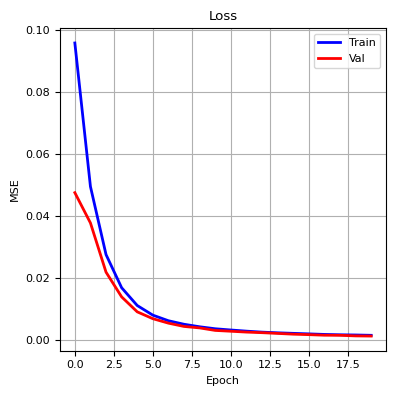

100%|██████████| 31/31 [00:08<00:00,  3.77it/s]


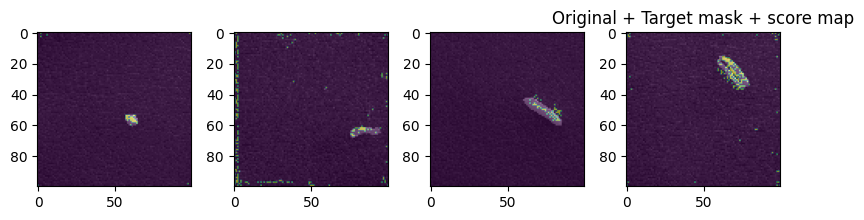

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.138: 100%|██████████| 56/56 [02:10<00:00,  2.33s/it]


Train loss: 0.174


loss = 0.108: 100%|██████████| 6/6 [00:04<00:00,  1.35it/s]


Validation loss: 0.094

Epoch 2/20


loss = 0.062: 100%|██████████| 56/56 [02:10<00:00,  2.33s/it]


Train loss: 0.092


loss = 0.083: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.070

Epoch 3/20


loss = 0.033: 100%|██████████| 56/56 [02:10<00:00,  2.33s/it]


Train loss: 0.047


loss = 0.043: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.037

Epoch 4/20


loss = 0.029: 100%|██████████| 56/56 [02:10<00:00,  2.33s/it]


Train loss: 0.027


loss = 0.026: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.022

Epoch 5/20


loss = 0.012: 100%|██████████| 56/56 [02:10<00:00,  2.33s/it]


Train loss: 0.017


loss = 0.016: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]


Validation loss: 0.014

Epoch 6/20


loss = 0.009: 100%|██████████| 56/56 [02:11<00:00,  2.34s/it]


Train loss: 0.012


loss = 0.011: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.010

Epoch 7/20


loss = 0.008: 100%|██████████| 56/56 [02:10<00:00,  2.33s/it]


Train loss: 0.009


loss = 0.009: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.008

Epoch 8/20


loss = 0.006: 100%|██████████| 56/56 [02:10<00:00,  2.34s/it]


Train loss: 0.007


loss = 0.007: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.006

Epoch 9/20


loss = 0.006: 100%|██████████| 56/56 [02:10<00:00,  2.33s/it]


Train loss: 0.005


loss = 0.006: 100%|██████████| 6/6 [00:04<00:00,  1.25it/s]


Validation loss: 0.005

Epoch 10/20


loss = 0.004: 100%|██████████| 56/56 [02:10<00:00,  2.34s/it]


Train loss: 0.005


loss = 0.005: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.004

Epoch 11/20


loss = 0.005: 100%|██████████| 56/56 [02:10<00:00,  2.33s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.004

Epoch 12/20


loss = 0.007: 100%|██████████| 56/56 [02:10<00:00,  2.33s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.003

Epoch 13/20


loss = 0.003: 100%|██████████| 56/56 [02:10<00:00,  2.32s/it]


Train loss: 0.003


loss = 0.004: 100%|██████████| 6/6 [00:04<00:00,  1.25it/s]


Validation loss: 0.003

Epoch 14/20


loss = 0.005: 100%|██████████| 56/56 [02:10<00:00,  2.32s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.002

Epoch 15/20


loss = 0.003: 100%|██████████| 56/56 [02:10<00:00,  2.33s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.002

Epoch 16/20


loss = 0.004: 100%|██████████| 56/56 [02:09<00:00,  2.32s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.002

Epoch 17/20


loss = 0.002: 100%|██████████| 56/56 [02:10<00:00,  2.34s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]


Validation loss: 0.002

Epoch 18/20


loss = 0.002: 100%|██████████| 56/56 [02:10<00:00,  2.32s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:04<00:00,  1.35it/s]


Validation loss: 0.002

Epoch 19/20


loss = 0.002: 100%|██████████| 56/56 [02:10<00:00,  2.33s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.002

Epoch 20/20


loss = 0.002: 100%|██████████| 56/56 [02:10<00:00,  2.33s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]

Validation loss: 0.002


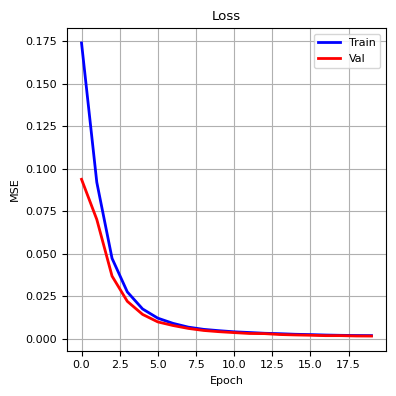

100%|██████████| 31/31 [00:23<00:00,  1.34it/s]


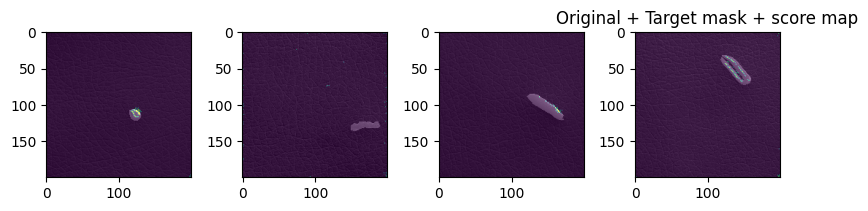

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.102: 100%|██████████| 56/56 [09:14<00:00,  9.90s/it]


Train loss: 0.149


loss = 0.096: 100%|██████████| 6/6 [00:16<00:00,  2.82s/it]


Validation loss: 0.079

Epoch 2/20


loss = 0.049: 100%|██████████| 56/56 [09:14<00:00,  9.90s/it]


Train loss: 0.074


loss = 0.054: 100%|██████████| 6/6 [00:16<00:00,  2.79s/it]


Validation loss: 0.051

Epoch 3/20


loss = 0.022: 100%|██████████| 56/56 [09:13<00:00,  9.88s/it]


Train loss: 0.035


loss = 0.028: 100%|██████████| 6/6 [00:16<00:00,  2.80s/it]


Validation loss: 0.026

Epoch 4/20


loss = 0.015: 100%|██████████| 56/56 [09:14<00:00,  9.90s/it]


Train loss: 0.019


loss = 0.017: 100%|██████████| 6/6 [00:17<00:00,  2.85s/it]


Validation loss: 0.016

Epoch 5/20


loss = 0.012: 100%|██████████| 56/56 [09:09<00:00,  9.82s/it]


Train loss: 0.013


loss = 0.011: 100%|██████████| 6/6 [00:17<00:00,  2.86s/it]


Validation loss: 0.011

Epoch 6/20


loss = 0.008: 100%|██████████| 56/56 [09:06<00:00,  9.76s/it]


Train loss: 0.009


loss = 0.009: 100%|██████████| 6/6 [00:17<00:00,  2.85s/it]


Validation loss: 0.008

Epoch 7/20


loss = 0.006: 100%|██████████| 56/56 [09:08<00:00,  9.80s/it]


Train loss: 0.007


loss = 0.007: 100%|██████████| 6/6 [00:16<00:00,  2.76s/it]


Validation loss: 0.006

Epoch 8/20


loss = 0.006: 100%|██████████| 56/56 [09:04<00:00,  9.73s/it]


Train loss: 0.006


loss = 0.006: 100%|██████████| 6/6 [00:17<00:00,  2.87s/it]


Validation loss: 0.005

Epoch 9/20


loss = 0.005: 100%|██████████| 56/56 [09:11<00:00,  9.84s/it]


Train loss: 0.005


loss = 0.005: 100%|██████████| 6/6 [00:16<00:00,  2.73s/it]


Validation loss: 0.004

Epoch 10/20


loss = 0.004: 100%|██████████| 56/56 [09:05<00:00,  9.74s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:16<00:00,  2.71s/it]


Validation loss: 0.004

Epoch 11/20


loss = 0.004: 100%|██████████| 56/56 [09:06<00:00,  9.76s/it]


Train loss: 0.004


loss = 0.003: 100%|██████████| 6/6 [00:16<00:00,  2.70s/it]


Validation loss: 0.003

Epoch 12/20


loss = 0.004: 100%|██████████| 56/56 [09:10<00:00,  9.83s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:16<00:00,  2.80s/it]


Validation loss: 0.003

Epoch 13/20


loss = 0.003: 100%|██████████| 56/56 [09:10<00:00,  9.84s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:16<00:00,  2.73s/it]


Validation loss: 0.002

Epoch 14/20


loss = 0.003: 100%|██████████| 56/56 [09:08<00:00,  9.79s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:16<00:00,  2.76s/it]


Validation loss: 0.002

Epoch 15/20


loss = 0.002: 100%|██████████| 56/56 [09:17<00:00,  9.96s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:16<00:00,  2.71s/it]


Validation loss: 0.002

Epoch 16/20


loss = 0.003: 100%|██████████| 56/56 [08:38<00:00,  9.26s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:16<00:00,  2.78s/it]


Validation loss: 0.002

Epoch 17/20


loss = 0.002: 100%|██████████| 56/56 [07:56<00:00,  8.51s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:17<00:00,  2.87s/it]


Validation loss: 0.002

Epoch 18/20


loss = 0.002: 100%|██████████| 56/56 [07:54<00:00,  8.47s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:16<00:00,  2.71s/it]


Validation loss: 0.002

Epoch 19/20


loss = 0.002: 100%|██████████| 56/56 [08:00<00:00,  8.58s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:16<00:00,  2.82s/it]


Validation loss: 0.001

Epoch 20/20


loss = 0.002: 100%|██████████| 56/56 [08:05<00:00,  8.68s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:16<00:00,  2.82s/it]

Validation loss: 0.001


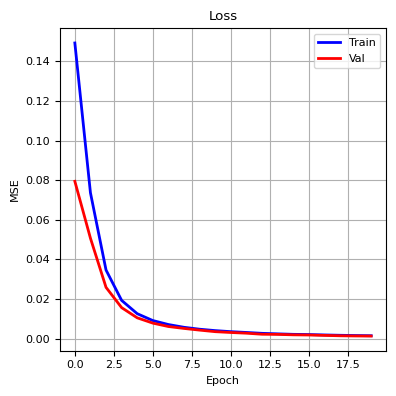

100%|██████████| 31/31 [01:26<00:00,  2.78s/it]


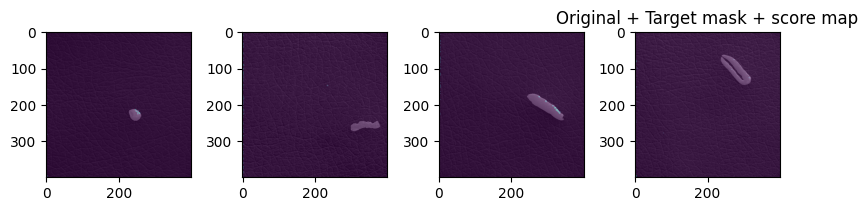

220 220


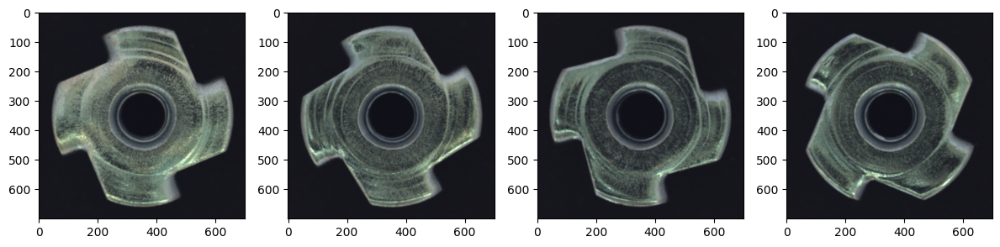

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.079: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.112


loss = 0.058: 100%|██████████| 6/6 [00:01<00:00,  4.42it/s]


Validation loss: 0.056

Epoch 2/20


loss = 0.051: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.062


loss = 0.047: 100%|██████████| 6/6 [00:01<00:00,  4.41it/s]


Validation loss: 0.045

Epoch 3/20


loss = 0.030: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]


Train loss: 0.038


loss = 0.030: 100%|██████████| 6/6 [00:01<00:00,  4.39it/s]


Validation loss: 0.029

Epoch 4/20


loss = 0.018: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]


Train loss: 0.022


loss = 0.018: 100%|██████████| 6/6 [00:01<00:00,  4.32it/s]


Validation loss: 0.017

Epoch 5/20


loss = 0.011: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.014


loss = 0.012: 100%|██████████| 6/6 [00:01<00:00,  4.45it/s]


Validation loss: 0.011

Epoch 6/20


loss = 0.008: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.009


loss = 0.008: 100%|██████████| 6/6 [00:01<00:00,  4.03it/s]


Validation loss: 0.008

Epoch 7/20


loss = 0.006: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.007


loss = 0.006: 100%|██████████| 6/6 [00:01<00:00,  4.41it/s]


Validation loss: 0.006

Epoch 8/20


loss = 0.006: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]


Train loss: 0.006


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  4.26it/s]


Validation loss: 0.005

Epoch 9/20


loss = 0.005: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]


Train loss: 0.005


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  4.44it/s]


Validation loss: 0.004

Epoch 10/20


loss = 0.004: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:01<00:00,  4.18it/s]


Validation loss: 0.004

Epoch 11/20


loss = 0.003: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.004


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  4.13it/s]


Validation loss: 0.003

Epoch 12/20


loss = 0.003: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  4.33it/s]


Validation loss: 0.003

Epoch 13/20


loss = 0.003: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  4.39it/s]


Validation loss: 0.003

Epoch 14/20


loss = 0.003: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]


Train loss: 0.003


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.34it/s]


Validation loss: 0.002

Epoch 15/20


loss = 0.003: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.42it/s]


Validation loss: 0.002

Epoch 16/20


loss = 0.002: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.51it/s]


Validation loss: 0.002

Epoch 17/20


loss = 0.002: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.39it/s]


Validation loss: 0.002

Epoch 18/20


loss = 0.002: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.32it/s]


Validation loss: 0.002

Epoch 19/20


loss = 0.002: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.37it/s]


Validation loss: 0.002

Epoch 20/20


loss = 0.002: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.17it/s]


Validation loss: 0.001


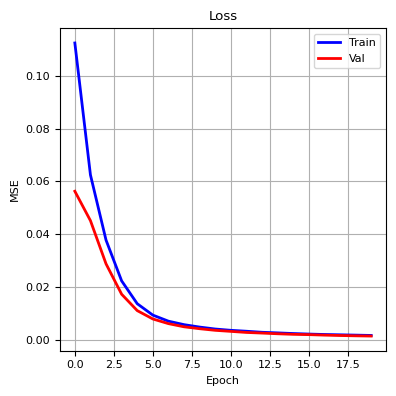

100%|██████████| 29/29 [00:07<00:00,  3.90it/s]


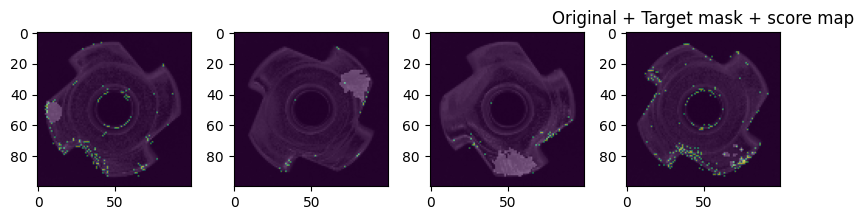

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.058: 100%|██████████| 50/50 [01:56<00:00,  2.33s/it]


Train loss: 0.096


loss = 0.049: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


Validation loss: 0.049

Epoch 2/20


loss = 0.029: 100%|██████████| 50/50 [01:58<00:00,  2.36s/it]


Train loss: 0.041


loss = 0.031: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.029

Epoch 3/20


loss = 0.018: 100%|██████████| 50/50 [01:57<00:00,  2.35s/it]


Train loss: 0.021


loss = 0.017: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.016

Epoch 4/20


loss = 0.011: 100%|██████████| 50/50 [01:57<00:00,  2.35s/it]


Train loss: 0.013


loss = 0.010: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.010

Epoch 5/20


loss = 0.008: 100%|██████████| 50/50 [01:57<00:00,  2.34s/it]


Train loss: 0.009


loss = 0.007: 100%|██████████| 6/6 [00:04<00:00,  1.49it/s]


Validation loss: 0.007

Epoch 6/20


loss = 0.005: 100%|██████████| 50/50 [01:57<00:00,  2.35s/it]


Train loss: 0.006


loss = 0.005: 100%|██████████| 6/6 [00:04<00:00,  1.49it/s]


Validation loss: 0.005

Epoch 7/20


loss = 0.004: 100%|██████████| 50/50 [01:57<00:00,  2.35s/it]


Train loss: 0.005


loss = 0.004: 100%|██████████| 6/6 [00:04<00:00,  1.40it/s]


Validation loss: 0.004

Epoch 8/20


loss = 0.004: 100%|██████████| 50/50 [01:56<00:00,  2.34s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:04<00:00,  1.35it/s]


Validation loss: 0.003

Epoch 9/20


loss = 0.004: 100%|██████████| 50/50 [01:57<00:00,  2.35s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.003

Epoch 10/20


loss = 0.002: 100%|██████████| 50/50 [01:57<00:00,  2.35s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:04<00:00,  1.42it/s]


Validation loss: 0.002

Epoch 11/20


loss = 0.002: 100%|██████████| 50/50 [01:57<00:00,  2.36s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


Validation loss: 0.002

Epoch 12/20


loss = 0.002: 100%|██████████| 50/50 [01:57<00:00,  2.36s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


Validation loss: 0.002

Epoch 13/20


loss = 0.002: 100%|██████████| 50/50 [01:57<00:00,  2.35s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.002

Epoch 14/20


loss = 0.001: 100%|██████████| 50/50 [01:57<00:00,  2.36s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.002

Epoch 15/20


loss = 0.002: 100%|██████████| 50/50 [01:57<00:00,  2.35s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]


Validation loss: 0.001

Epoch 16/20


loss = 0.002: 100%|██████████| 50/50 [01:59<00:00,  2.38s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:04<00:00,  1.49it/s]


Validation loss: 0.001

Epoch 17/20


loss = 0.004: 100%|██████████| 50/50 [01:57<00:00,  2.36s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:04<00:00,  1.50it/s]


Validation loss: 0.001

Epoch 18/20


loss = 0.001: 100%|██████████| 50/50 [01:57<00:00,  2.35s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


Validation loss: 0.001

Epoch 19/20


loss = 0.001: 100%|██████████| 50/50 [01:58<00:00,  2.36s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


Validation loss: 0.001

Epoch 20/20


loss = 0.002: 100%|██████████| 50/50 [01:57<00:00,  2.36s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]

Validation loss: 0.001


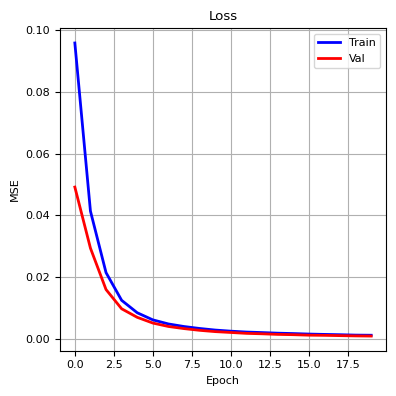

100%|██████████| 29/29 [00:20<00:00,  1.38it/s]


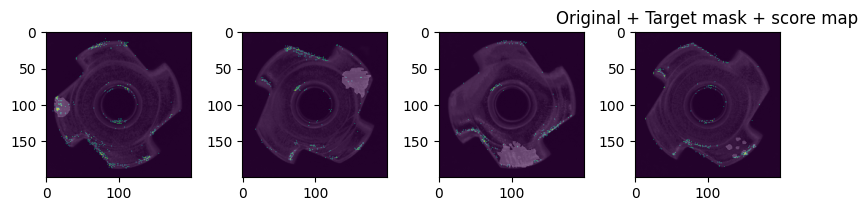

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.083: 100%|██████████| 50/50 [07:38<00:00,  9.17s/it]


Train loss: 0.127


loss = 0.122: 100%|██████████| 6/6 [00:14<00:00,  2.48s/it]


Validation loss: 0.120

Epoch 2/20


loss = 0.044: 100%|██████████| 50/50 [07:35<00:00,  9.10s/it]


Train loss: 0.063


loss = 0.043: 100%|██████████| 6/6 [00:15<00:00,  2.61s/it]


Validation loss: 0.042

Epoch 3/20


loss = 0.016: 100%|██████████| 50/50 [07:38<00:00,  9.17s/it]


Train loss: 0.029


loss = 0.018: 100%|██████████| 6/6 [00:14<00:00,  2.45s/it]


Validation loss: 0.018

Epoch 4/20


loss = 0.010: 100%|██████████| 50/50 [07:46<00:00,  9.32s/it]


Train loss: 0.012


loss = 0.009: 100%|██████████| 6/6 [00:15<00:00,  2.57s/it]


Validation loss: 0.008

Epoch 5/20


loss = 0.005: 100%|██████████| 50/50 [07:46<00:00,  9.32s/it]


Train loss: 0.006


loss = 0.007: 100%|██████████| 6/6 [00:15<00:00,  2.57s/it]


Validation loss: 0.005

Epoch 6/20


loss = 0.004: 100%|██████████| 50/50 [07:53<00:00,  9.47s/it]


Train loss: 0.004


loss = 0.005: 100%|██████████| 6/6 [00:15<00:00,  2.58s/it]


Validation loss: 0.004

Epoch 7/20


loss = 0.003: 100%|██████████| 50/50 [08:04<00:00,  9.68s/it]


Train loss: 0.003


loss = 0.005: 100%|██████████| 6/6 [00:14<00:00,  2.43s/it]


Validation loss: 0.004

Epoch 8/20


loss = 0.002: 100%|██████████| 50/50 [07:53<00:00,  9.47s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:14<00:00,  2.45s/it]


Validation loss: 0.002

Epoch 9/20


loss = 0.002: 100%|██████████| 50/50 [08:09<00:00,  9.79s/it]


Train loss: 0.002


loss = 0.003: 100%|██████████| 6/6 [00:14<00:00,  2.40s/it]


Validation loss: 0.002

Epoch 10/20


loss = 0.003: 100%|██████████| 50/50 [08:08<00:00,  9.76s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:14<00:00,  2.47s/it]


Validation loss: 0.002

Epoch 11/20


loss = 0.003: 100%|██████████| 50/50 [07:55<00:00,  9.52s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:15<00:00,  2.65s/it]


Validation loss: 0.001

Epoch 12/20


loss = 0.001: 100%|██████████| 50/50 [07:47<00:00,  9.35s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:15<00:00,  2.52s/it]


Validation loss: 0.001

Epoch 13/20


loss = 0.002: 100%|██████████| 50/50 [07:44<00:00,  9.30s/it]


Train loss: 0.001


loss = 0.002: 100%|██████████| 6/6 [00:14<00:00,  2.41s/it]


Validation loss: 0.001

Epoch 14/20


loss = 0.001: 100%|██████████| 50/50 [07:46<00:00,  9.32s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:14<00:00,  2.41s/it]


Validation loss: 0.001

Epoch 15/20


loss = 0.001: 100%|██████████| 50/50 [07:58<00:00,  9.57s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:15<00:00,  2.52s/it]


Validation loss: 0.001

Epoch 16/20


loss = 0.001: 100%|██████████| 50/50 [07:53<00:00,  9.47s/it]


Train loss: 0.001


loss = 0.002: 100%|██████████| 6/6 [00:14<00:00,  2.48s/it]


Validation loss: 0.001

Epoch 17/20


loss = 0.001: 100%|██████████| 50/50 [07:58<00:00,  9.57s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:14<00:00,  2.48s/it]


Validation loss: 0.001

Epoch 18/20


loss = 0.001: 100%|██████████| 50/50 [08:24<00:00, 10.09s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:15<00:00,  2.56s/it]


Validation loss: 0.001

Epoch 19/20


loss = 0.002: 100%|██████████| 50/50 [08:36<00:00, 10.33s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:14<00:00,  2.45s/it]


Validation loss: 0.001

Epoch 20/20


loss = 0.001: 100%|██████████| 50/50 [08:04<00:00,  9.68s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:15<00:00,  2.51s/it]

Validation loss: 0.001


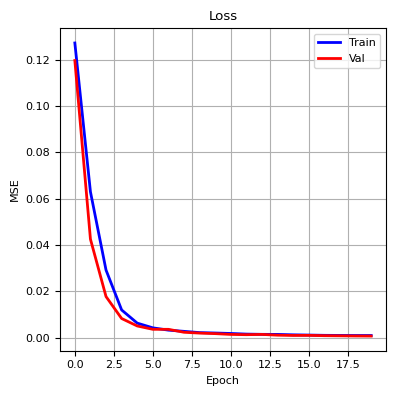

100%|██████████| 29/29 [01:16<00:00,  2.65s/it]


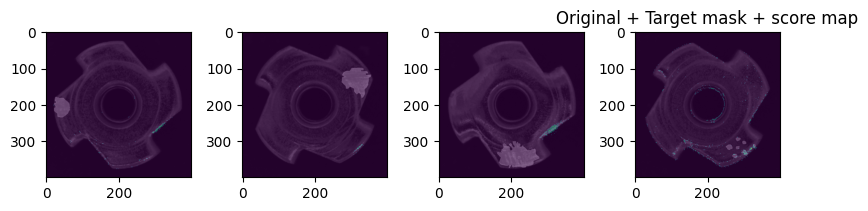

267 267


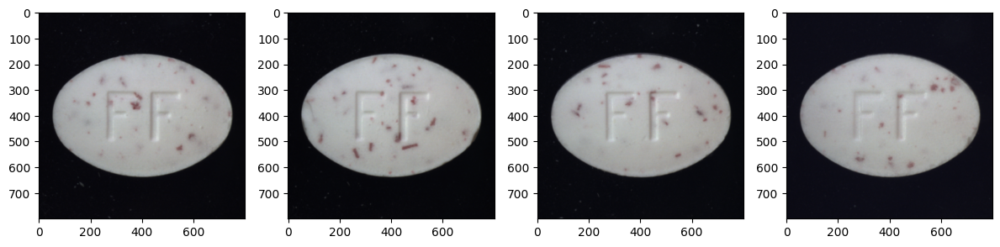

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.027: 100%|██████████| 61/61 [00:44<00:00,  1.36it/s]


Train loss: 0.067


loss = 0.030: 100%|██████████| 7/7 [00:01<00:00,  4.49it/s]


Validation loss: 0.030

Epoch 2/20


loss = 0.012: 100%|██████████| 61/61 [00:45<00:00,  1.34it/s]


Train loss: 0.018


loss = 0.013: 100%|██████████| 7/7 [00:01<00:00,  4.22it/s]


Validation loss: 0.013

Epoch 3/20


loss = 0.007: 100%|██████████| 61/61 [00:45<00:00,  1.34it/s]


Train loss: 0.009


loss = 0.007: 100%|██████████| 7/7 [00:01<00:00,  4.33it/s]


Validation loss: 0.008

Epoch 4/20


loss = 0.005: 100%|██████████| 61/61 [00:45<00:00,  1.35it/s]


Train loss: 0.006


loss = 0.005: 100%|██████████| 7/7 [00:01<00:00,  4.32it/s]


Validation loss: 0.005

Epoch 5/20


loss = 0.004: 100%|██████████| 61/61 [00:45<00:00,  1.35it/s]


Train loss: 0.004


loss = 0.004: 100%|██████████| 7/7 [00:01<00:00,  4.23it/s]


Validation loss: 0.004

Epoch 6/20


loss = 0.003: 100%|██████████| 61/61 [00:45<00:00,  1.35it/s]


Train loss: 0.003


loss = 0.003: 100%|██████████| 7/7 [00:01<00:00,  4.11it/s]


Validation loss: 0.003

Epoch 7/20


loss = 0.002: 100%|██████████| 61/61 [00:45<00:00,  1.35it/s]


Train loss: 0.003


loss = 0.002: 100%|██████████| 7/7 [00:01<00:00,  4.50it/s]


Validation loss: 0.002

Epoch 8/20


loss = 0.002: 100%|██████████| 61/61 [00:45<00:00,  1.34it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:01<00:00,  4.21it/s]


Validation loss: 0.002

Epoch 9/20


loss = 0.002: 100%|██████████| 61/61 [00:45<00:00,  1.35it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:01<00:00,  4.44it/s]


Validation loss: 0.002

Epoch 10/20


loss = 0.002: 100%|██████████| 61/61 [00:45<00:00,  1.34it/s]


Train loss: 0.002


loss = 0.001: 100%|██████████| 7/7 [00:01<00:00,  4.17it/s]


Validation loss: 0.002

Epoch 11/20


loss = 0.001: 100%|██████████| 61/61 [00:45<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:01<00:00,  4.41it/s]


Validation loss: 0.001

Epoch 12/20


loss = 0.001: 100%|██████████| 61/61 [00:45<00:00,  1.35it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:01<00:00,  4.18it/s]


Validation loss: 0.001

Epoch 13/20


loss = 0.002: 100%|██████████| 61/61 [00:45<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:01<00:00,  4.37it/s]


Validation loss: 0.001

Epoch 14/20


loss = 0.001: 100%|██████████| 61/61 [00:45<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:01<00:00,  4.27it/s]


Validation loss: 0.001

Epoch 15/20


loss = 0.001: 100%|██████████| 61/61 [00:45<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:01<00:00,  4.37it/s]


Validation loss: 0.001

Epoch 16/20


loss = 0.001: 100%|██████████| 61/61 [00:45<00:00,  1.35it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:01<00:00,  4.25it/s]


Validation loss: 0.001

Epoch 17/20


loss = 0.001: 100%|██████████| 61/61 [00:45<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:01<00:00,  4.38it/s]


Validation loss: 0.001

Epoch 18/20


loss = 0.001: 100%|██████████| 61/61 [00:45<00:00,  1.35it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:01<00:00,  4.21it/s]


Validation loss: 0.001

Epoch 19/20


loss = 0.001: 100%|██████████| 61/61 [00:45<00:00,  1.34it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:01<00:00,  4.29it/s]


Validation loss: 0.001

Epoch 20/20


loss = 0.001: 100%|██████████| 61/61 [00:45<00:00,  1.35it/s]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:01<00:00,  4.28it/s]


Validation loss: 0.001


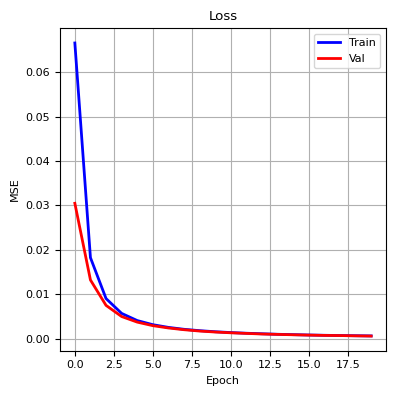

100%|██████████| 42/42 [00:10<00:00,  4.11it/s]


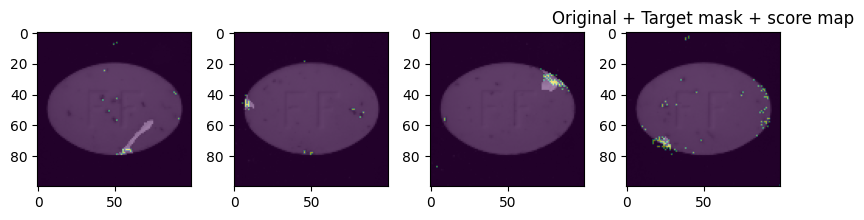

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.140: 100%|██████████| 61/61 [02:20<00:00,  2.30s/it]


Train loss: 0.239


loss = 0.170: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.163

Epoch 2/20


loss = 0.058: 100%|██████████| 61/61 [02:19<00:00,  2.29s/it]


Train loss: 0.088


loss = 0.052: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.051

Epoch 3/20


loss = 0.025: 100%|██████████| 61/61 [02:20<00:00,  2.31s/it]


Train loss: 0.038


loss = 0.024: 100%|██████████| 7/7 [00:04<00:00,  1.44it/s]


Validation loss: 0.023

Epoch 4/20


loss = 0.013: 100%|██████████| 61/61 [02:20<00:00,  2.30s/it]


Train loss: 0.017


loss = 0.012: 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


Validation loss: 0.012

Epoch 5/20


loss = 0.007: 100%|██████████| 61/61 [02:20<00:00,  2.30s/it]


Train loss: 0.009


loss = 0.007: 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]


Validation loss: 0.007

Epoch 6/20


loss = 0.003: 100%|██████████| 61/61 [02:20<00:00,  2.30s/it]


Train loss: 0.005


loss = 0.004: 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


Validation loss: 0.004

Epoch 7/20


loss = 0.003: 100%|██████████| 61/61 [02:24<00:00,  2.37s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


Validation loss: 0.003

Epoch 8/20


loss = 0.002: 100%|██████████| 61/61 [02:23<00:00,  2.35s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


Validation loss: 0.002

Epoch 9/20


loss = 0.002: 100%|██████████| 61/61 [02:22<00:00,  2.34s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.002

Epoch 10/20


loss = 0.002: 100%|██████████| 61/61 [02:21<00:00,  2.31s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


Validation loss: 0.002

Epoch 11/20


loss = 0.001: 100%|██████████| 61/61 [02:20<00:00,  2.31s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.001

Epoch 12/20


loss = 0.001: 100%|██████████| 61/61 [02:19<00:00,  2.29s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.001

Epoch 13/20


loss = 0.001: 100%|██████████| 61/61 [02:19<00:00,  2.28s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.001

Epoch 14/20


loss = 0.001: 100%|██████████| 61/61 [02:20<00:00,  2.30s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]


Validation loss: 0.001

Epoch 15/20


loss = 0.001: 100%|██████████| 61/61 [02:20<00:00,  2.30s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.001

Epoch 16/20


loss = 0.001: 100%|██████████| 61/61 [02:19<00:00,  2.29s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


Validation loss: 0.001

Epoch 17/20


loss = 0.001: 100%|██████████| 61/61 [02:20<00:00,  2.30s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


Validation loss: 0.001

Epoch 18/20


loss = 0.001: 100%|██████████| 61/61 [02:19<00:00,  2.29s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


Validation loss: 0.001

Epoch 19/20


loss = 0.001: 100%|██████████| 61/61 [02:19<00:00,  2.29s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:04<00:00,  1.50it/s]


Validation loss: 0.001

Epoch 20/20


loss = 0.001: 100%|██████████| 61/61 [02:19<00:00,  2.29s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]

Validation loss: 0.001


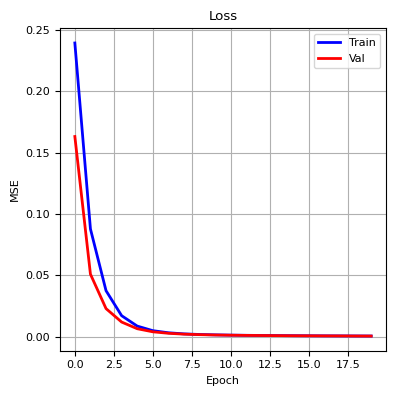

100%|██████████| 42/42 [00:30<00:00,  1.38it/s]


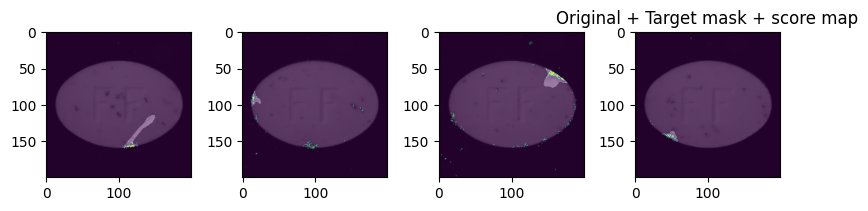

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.133: 100%|██████████| 61/61 [10:05<00:00,  9.92s/it]


Train loss: 0.227


loss = 0.111: 100%|██████████| 7/7 [00:17<00:00,  2.49s/it]


Validation loss: 0.115

Epoch 2/20


loss = 0.049: 100%|██████████| 61/61 [09:57<00:00,  9.80s/it]


Train loss: 0.083


loss = 0.044: 100%|██████████| 7/7 [00:17<00:00,  2.48s/it]


Validation loss: 0.044

Epoch 3/20


loss = 0.020: 100%|██████████| 61/61 [09:46<00:00,  9.61s/it]


Train loss: 0.034


loss = 0.021: 100%|██████████| 7/7 [00:18<00:00,  2.61s/it]


Validation loss: 0.021

Epoch 4/20


loss = 0.012: 100%|██████████| 61/61 [09:54<00:00,  9.74s/it]


Train loss: 0.016


loss = 0.011: 100%|██████████| 7/7 [00:17<00:00,  2.49s/it]


Validation loss: 0.011

Epoch 5/20


loss = 0.006: 100%|██████████| 61/61 [09:48<00:00,  9.64s/it]


Train loss: 0.008


loss = 0.006: 100%|██████████| 7/7 [00:17<00:00,  2.53s/it]


Validation loss: 0.006

Epoch 6/20


loss = 0.004: 100%|██████████| 61/61 [09:50<00:00,  9.68s/it]


Train loss: 0.005


loss = 0.004: 100%|██████████| 7/7 [00:17<00:00,  2.52s/it]


Validation loss: 0.004

Epoch 7/20


loss = 0.002: 100%|██████████| 61/61 [09:46<00:00,  9.61s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 7/7 [00:17<00:00,  2.51s/it]


Validation loss: 0.003

Epoch 8/20


loss = 0.002: 100%|██████████| 61/61 [09:53<00:00,  9.72s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 7/7 [00:17<00:00,  2.53s/it]


Validation loss: 0.002

Epoch 9/20


loss = 0.001: 100%|██████████| 61/61 [09:55<00:00,  9.76s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 7/7 [00:18<00:00,  2.60s/it]


Validation loss: 0.001

Epoch 10/20


loss = 0.001: 100%|██████████| 61/61 [09:34<00:00,  9.41s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:17<00:00,  2.57s/it]


Validation loss: 0.001

Epoch 11/20


loss = 0.001: 100%|██████████| 61/61 [09:37<00:00,  9.47s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:17<00:00,  2.56s/it]


Validation loss: 0.001

Epoch 12/20


loss = 0.001: 100%|██████████| 61/61 [09:48<00:00,  9.64s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:17<00:00,  2.47s/it]


Validation loss: 0.001

Epoch 13/20


loss = 0.001: 100%|██████████| 61/61 [09:55<00:00,  9.77s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:17<00:00,  2.54s/it]


Validation loss: 0.001

Epoch 14/20


loss = 0.001: 100%|██████████| 61/61 [10:02<00:00,  9.88s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:18<00:00,  2.60s/it]


Validation loss: 0.001

Epoch 15/20


loss = 0.001: 100%|██████████| 61/61 [10:01<00:00,  9.85s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 7/7 [00:17<00:00,  2.54s/it]


Validation loss: 0.001

Epoch 16/20


loss = 0.000: 100%|██████████| 61/61 [09:47<00:00,  9.63s/it]


Train loss: 0.001


loss = 0.000: 100%|██████████| 7/7 [00:17<00:00,  2.51s/it]


Validation loss: 0.000

Epoch 17/20


loss = 0.000: 100%|██████████| 61/61 [09:39<00:00,  9.50s/it]


Train loss: 0.000


loss = 0.000: 100%|██████████| 7/7 [00:17<00:00,  2.54s/it]


Validation loss: 0.000

Epoch 18/20


loss = 0.000: 100%|██████████| 61/61 [09:45<00:00,  9.59s/it]


Train loss: 0.000


loss = 0.000: 100%|██████████| 7/7 [00:17<00:00,  2.48s/it]


Validation loss: 0.000

Epoch 19/20


loss = 0.000: 100%|██████████| 61/61 [09:40<00:00,  9.51s/it]


Train loss: 0.000


loss = 0.000: 100%|██████████| 7/7 [00:18<00:00,  2.58s/it]


Validation loss: 0.000

Epoch 20/20


loss = 0.000: 100%|██████████| 61/61 [09:32<00:00,  9.38s/it]


Train loss: 0.000


loss = 0.000: 100%|██████████| 7/7 [00:17<00:00,  2.45s/it]

Validation loss: 0.000


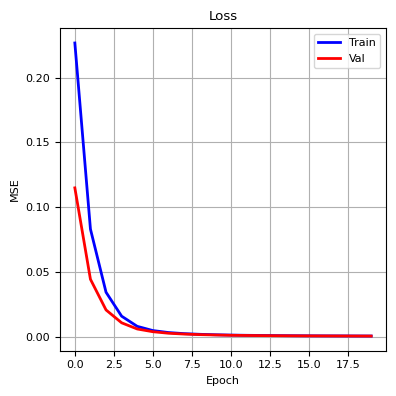

100%|██████████| 42/42 [01:52<00:00,  2.67s/it]


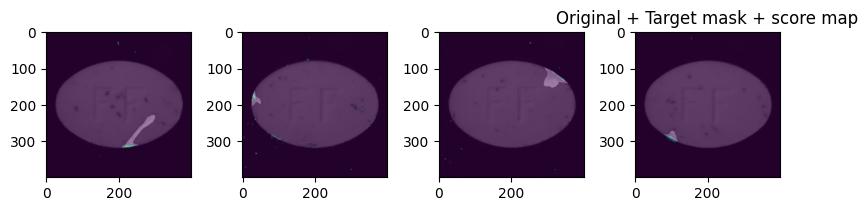

320 320


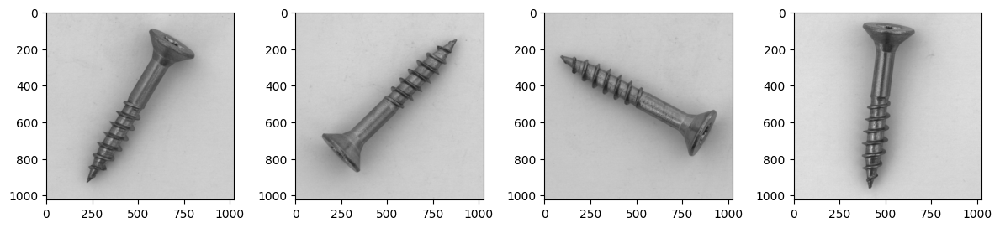

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.450: 100%|██████████| 72/72 [00:54<00:00,  1.32it/s]


Train loss: 0.540


loss = 0.420: 100%|██████████| 8/8 [00:01<00:00,  4.07it/s]


Validation loss: 0.418

Epoch 2/20


loss = 0.304: 100%|██████████| 72/72 [00:54<00:00,  1.32it/s]


Train loss: 0.364


loss = 0.311: 100%|██████████| 8/8 [00:01<00:00,  4.14it/s]


Validation loss: 0.310

Epoch 3/20


loss = 0.234: 100%|██████████| 72/72 [00:54<00:00,  1.32it/s]


Train loss: 0.275


loss = 0.244: 100%|██████████| 8/8 [00:01<00:00,  4.06it/s]


Validation loss: 0.243

Epoch 4/20


loss = 0.207: 100%|██████████| 72/72 [00:54<00:00,  1.32it/s]


Train loss: 0.222


loss = 0.203: 100%|██████████| 8/8 [00:01<00:00,  4.06it/s]


Validation loss: 0.202

Epoch 5/20


loss = 0.166: 100%|██████████| 72/72 [00:54<00:00,  1.32it/s]


Train loss: 0.184


loss = 0.169: 100%|██████████| 8/8 [00:01<00:00,  4.04it/s]


Validation loss: 0.168

Epoch 6/20


loss = 0.151: 100%|██████████| 72/72 [00:55<00:00,  1.30it/s]


Train loss: 0.156


loss = 0.148: 100%|██████████| 8/8 [00:01<00:00,  4.07it/s]


Validation loss: 0.146

Epoch 7/20


loss = 0.121: 100%|██████████| 72/72 [00:54<00:00,  1.32it/s]


Train loss: 0.134


loss = 0.127: 100%|██████████| 8/8 [00:01<00:00,  4.07it/s]


Validation loss: 0.126

Epoch 8/20


loss = 0.106: 100%|██████████| 72/72 [00:54<00:00,  1.32it/s]


Train loss: 0.117


loss = 0.112: 100%|██████████| 8/8 [00:02<00:00,  3.97it/s]


Validation loss: 0.111

Epoch 9/20


loss = 0.106: 100%|██████████| 72/72 [00:55<00:00,  1.30it/s]


Train loss: 0.103


loss = 0.098: 100%|██████████| 8/8 [00:01<00:00,  4.05it/s]


Validation loss: 0.098

Epoch 10/20


loss = 0.093: 100%|██████████| 72/72 [00:54<00:00,  1.32it/s]


Train loss: 0.091


loss = 0.088: 100%|██████████| 8/8 [00:01<00:00,  4.10it/s]


Validation loss: 0.087

Epoch 11/20


loss = 0.070: 100%|██████████| 72/72 [00:53<00:00,  1.33it/s]


Train loss: 0.080


loss = 0.076: 100%|██████████| 8/8 [00:01<00:00,  4.04it/s]


Validation loss: 0.075

Epoch 12/20


loss = 0.069: 100%|██████████| 72/72 [00:54<00:00,  1.32it/s]


Train loss: 0.071


loss = 0.070: 100%|██████████| 8/8 [00:01<00:00,  4.07it/s]


Validation loss: 0.069

Epoch 13/20


loss = 0.059: 100%|██████████| 72/72 [00:54<00:00,  1.32it/s]


Train loss: 0.063


loss = 0.059: 100%|██████████| 8/8 [00:01<00:00,  4.18it/s]


Validation loss: 0.059

Epoch 14/20


loss = 0.051: 100%|██████████| 72/72 [00:53<00:00,  1.33it/s]


Train loss: 0.056


loss = 0.052: 100%|██████████| 8/8 [00:01<00:00,  4.14it/s]


Validation loss: 0.052

Epoch 15/20


loss = 0.046: 100%|██████████| 72/72 [00:54<00:00,  1.33it/s]


Train loss: 0.050


loss = 0.048: 100%|██████████| 8/8 [00:01<00:00,  4.17it/s]


Validation loss: 0.048

Epoch 16/20


loss = 0.038: 100%|██████████| 72/72 [00:54<00:00,  1.33it/s]


Train loss: 0.045


loss = 0.042: 100%|██████████| 8/8 [00:01<00:00,  4.12it/s]


Validation loss: 0.042

Epoch 17/20


loss = 0.037: 100%|██████████| 72/72 [00:54<00:00,  1.33it/s]


Train loss: 0.040


loss = 0.037: 100%|██████████| 8/8 [00:01<00:00,  4.12it/s]


Validation loss: 0.037

Epoch 18/20


loss = 0.036: 100%|██████████| 72/72 [00:53<00:00,  1.34it/s]


Train loss: 0.036


loss = 0.032: 100%|██████████| 8/8 [00:01<00:00,  4.07it/s]


Validation loss: 0.032

Epoch 19/20


loss = 0.028: 100%|██████████| 72/72 [00:53<00:00,  1.33it/s]


Train loss: 0.032


loss = 0.028: 100%|██████████| 8/8 [00:01<00:00,  4.12it/s]


Validation loss: 0.029

Epoch 20/20


loss = 0.022: 100%|██████████| 72/72 [00:54<00:00,  1.33it/s]


Train loss: 0.028


loss = 0.026: 100%|██████████| 8/8 [00:01<00:00,  4.17it/s]

Validation loss: 0.026


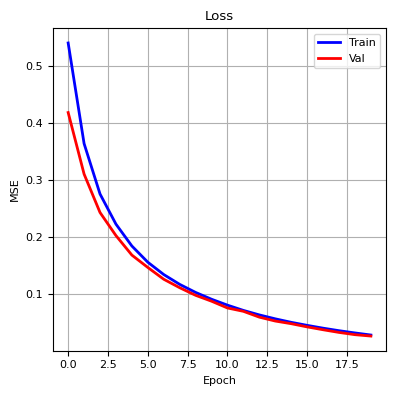

100%|██████████| 40/40 [00:10<00:00,  3.90it/s]


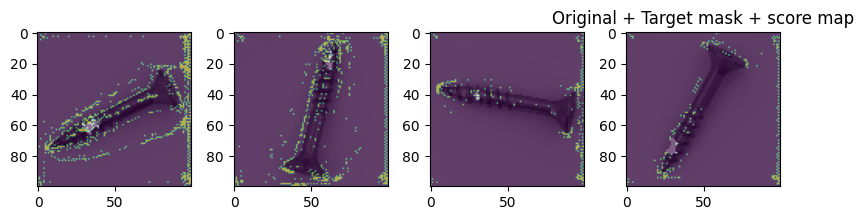

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.385: 100%|██████████| 72/72 [02:48<00:00,  2.34s/it]


Train loss: 0.525


loss = 0.369: 100%|██████████| 8/8 [00:05<00:00,  1.38it/s]


Validation loss: 0.370

Epoch 2/20


loss = 0.276: 100%|██████████| 72/72 [02:51<00:00,  2.38s/it]


Train loss: 0.322


loss = 0.265: 100%|██████████| 8/8 [00:06<00:00,  1.29it/s]


Validation loss: 0.265

Epoch 3/20


loss = 0.205: 100%|██████████| 72/72 [02:51<00:00,  2.38s/it]


Train loss: 0.237


loss = 0.202: 100%|██████████| 8/8 [00:05<00:00,  1.39it/s]


Validation loss: 0.202

Epoch 4/20


loss = 0.182: 100%|██████████| 72/72 [02:51<00:00,  2.38s/it]


Train loss: 0.188


loss = 0.169: 100%|██████████| 8/8 [00:05<00:00,  1.39it/s]


Validation loss: 0.169

Epoch 5/20


loss = 0.144: 100%|██████████| 72/72 [02:50<00:00,  2.36s/it]


Train loss: 0.155


loss = 0.143: 100%|██████████| 8/8 [00:05<00:00,  1.38it/s]


Validation loss: 0.142

Epoch 6/20


loss = 0.123: 100%|██████████| 72/72 [02:47<00:00,  2.33s/it]


Train loss: 0.131


loss = 0.119: 100%|██████████| 8/8 [00:06<00:00,  1.26it/s]


Validation loss: 0.118

Epoch 7/20


loss = 0.096: 100%|██████████| 72/72 [02:47<00:00,  2.33s/it]


Train loss: 0.112


loss = 0.104: 100%|██████████| 8/8 [00:05<00:00,  1.39it/s]


Validation loss: 0.104

Epoch 8/20


loss = 0.088: 100%|██████████| 72/72 [02:47<00:00,  2.33s/it]


Train loss: 0.097


loss = 0.086: 100%|██████████| 8/8 [00:05<00:00,  1.38it/s]


Validation loss: 0.086

Epoch 9/20


loss = 0.080: 100%|██████████| 72/72 [02:48<00:00,  2.34s/it]


Train loss: 0.085


loss = 0.078: 100%|██████████| 8/8 [00:05<00:00,  1.38it/s]


Validation loss: 0.078

Epoch 10/20


loss = 0.065: 100%|██████████| 72/72 [02:48<00:00,  2.34s/it]


Train loss: 0.075


loss = 0.067: 100%|██████████| 8/8 [00:05<00:00,  1.38it/s]


Validation loss: 0.067

Epoch 11/20


loss = 0.062: 100%|██████████| 72/72 [02:48<00:00,  2.34s/it]


Train loss: 0.066


loss = 0.058: 100%|██████████| 8/8 [00:05<00:00,  1.39it/s]


Validation loss: 0.058

Epoch 12/20


loss = 0.051: 100%|██████████| 72/72 [02:49<00:00,  2.36s/it]


Train loss: 0.058


loss = 0.054: 100%|██████████| 8/8 [00:05<00:00,  1.38it/s]


Validation loss: 0.054

Epoch 13/20


loss = 0.050: 100%|██████████| 72/72 [02:48<00:00,  2.33s/it]


Train loss: 0.052


loss = 0.047: 100%|██████████| 8/8 [00:05<00:00,  1.37it/s]


Validation loss: 0.048

Epoch 14/20


loss = 0.033: 100%|██████████| 72/72 [02:47<00:00,  2.33s/it]


Train loss: 0.046


loss = 0.042: 100%|██████████| 8/8 [00:05<00:00,  1.39it/s]


Validation loss: 0.042

Epoch 15/20


loss = 0.037: 100%|██████████| 72/72 [02:47<00:00,  2.33s/it]


Train loss: 0.041


loss = 0.038: 100%|██████████| 8/8 [00:05<00:00,  1.39it/s]


Validation loss: 0.039

Epoch 16/20


loss = 0.032: 100%|██████████| 72/72 [02:46<00:00,  2.32s/it]


Train loss: 0.036


loss = 0.033: 100%|██████████| 8/8 [00:06<00:00,  1.31it/s]


Validation loss: 0.033

Epoch 17/20


loss = 0.025: 100%|██████████| 72/72 [02:46<00:00,  2.32s/it]


Train loss: 0.032


loss = 0.029: 100%|██████████| 8/8 [00:05<00:00,  1.40it/s]


Validation loss: 0.029

Epoch 18/20


loss = 0.030: 100%|██████████| 72/72 [02:47<00:00,  2.33s/it]


Train loss: 0.028


loss = 0.026: 100%|██████████| 8/8 [00:05<00:00,  1.40it/s]


Validation loss: 0.026

Epoch 19/20


loss = 0.020: 100%|██████████| 72/72 [02:48<00:00,  2.34s/it]


Train loss: 0.025


loss = 0.023: 100%|██████████| 8/8 [00:05<00:00,  1.39it/s]


Validation loss: 0.023

Epoch 20/20


loss = 0.018: 100%|██████████| 72/72 [02:47<00:00,  2.33s/it]


Train loss: 0.022


loss = 0.019: 100%|██████████| 8/8 [00:05<00:00,  1.38it/s]

Validation loss: 0.020


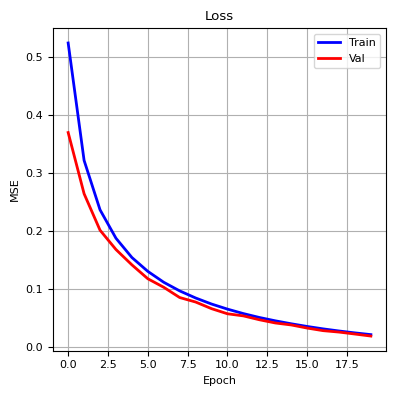

100%|██████████| 40/40 [00:29<00:00,  1.36it/s]


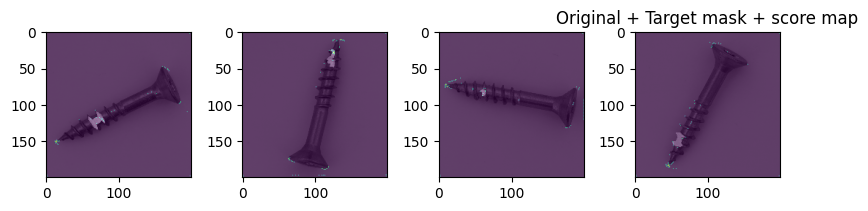

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.298: 100%|██████████| 72/72 [11:39<00:00,  9.72s/it]


Train loss: 0.393


loss = 0.287: 100%|██████████| 8/8 [00:21<00:00,  2.69s/it]


Validation loss: 0.288

Epoch 2/20


loss = 0.175: 100%|██████████| 72/72 [11:40<00:00,  9.73s/it]


Train loss: 0.225


loss = 0.173: 100%|██████████| 8/8 [00:21<00:00,  2.69s/it]


Validation loss: 0.173

Epoch 3/20


loss = 0.131: 100%|██████████| 72/72 [12:17<00:00, 10.24s/it]


Train loss: 0.152


loss = 0.127: 100%|██████████| 8/8 [00:22<00:00,  2.83s/it]


Validation loss: 0.126

Epoch 4/20


loss = 0.108: 100%|██████████| 72/72 [12:16<00:00, 10.23s/it]


Train loss: 0.114


loss = 0.100: 100%|██████████| 8/8 [00:21<00:00,  2.75s/it]


Validation loss: 0.099

Epoch 5/20


loss = 0.084: 100%|██████████| 72/72 [11:48<00:00,  9.84s/it]


Train loss: 0.092


loss = 0.086: 100%|██████████| 8/8 [00:21<00:00,  2.73s/it]


Validation loss: 0.086

Epoch 6/20


loss = 0.062: 100%|██████████| 72/72 [12:15<00:00, 10.22s/it]


Train loss: 0.077


loss = 0.069: 100%|██████████| 8/8 [00:21<00:00,  2.66s/it]


Validation loss: 0.069

Epoch 7/20


loss = 0.052: 100%|██████████| 72/72 [12:02<00:00, 10.03s/it]


Train loss: 0.066


loss = 0.062: 100%|██████████| 8/8 [00:21<00:00,  2.73s/it]


Validation loss: 0.061

Epoch 8/20


loss = 0.055: 100%|██████████| 72/72 [11:45<00:00,  9.80s/it]


Train loss: 0.057


loss = 0.053: 100%|██████████| 8/8 [00:21<00:00,  2.64s/it]


Validation loss: 0.052

Epoch 9/20


loss = 0.045: 100%|██████████| 72/72 [11:25<00:00,  9.53s/it]


Train loss: 0.050


loss = 0.048: 100%|██████████| 8/8 [00:21<00:00,  2.69s/it]


Validation loss: 0.047

Epoch 10/20


loss = 0.037: 100%|██████████| 72/72 [11:10<00:00,  9.31s/it]


Train loss: 0.043


loss = 0.040: 100%|██████████| 8/8 [00:22<00:00,  2.85s/it]


Validation loss: 0.040

Epoch 11/20


loss = 0.029: 100%|██████████| 72/72 [11:49<00:00,  9.85s/it]


Train loss: 0.038


loss = 0.035: 100%|██████████| 8/8 [00:21<00:00,  2.73s/it]


Validation loss: 0.035

Epoch 12/20


loss = 0.030: 100%|██████████| 72/72 [11:53<00:00,  9.92s/it]


Train loss: 0.033


loss = 0.031: 100%|██████████| 8/8 [00:22<00:00,  2.75s/it]


Validation loss: 0.031

Epoch 13/20


loss = 0.030: 100%|██████████| 72/72 [11:30<00:00,  9.58s/it]


Train loss: 0.029


loss = 0.026: 100%|██████████| 8/8 [00:20<00:00,  2.59s/it]


Validation loss: 0.026

Epoch 14/20


loss = 0.026: 100%|██████████| 72/72 [11:29<00:00,  9.58s/it]


Train loss: 0.025


loss = 0.024: 100%|██████████| 8/8 [00:21<00:00,  2.70s/it]


Validation loss: 0.023

Epoch 15/20


loss = 0.023: 100%|██████████| 72/72 [12:13<00:00, 10.19s/it]


Train loss: 0.022


loss = 0.021: 100%|██████████| 8/8 [00:22<00:00,  2.75s/it]


Validation loss: 0.021

Epoch 16/20


loss = 0.015: 100%|██████████| 72/72 [12:26<00:00, 10.37s/it]


Train loss: 0.019


loss = 0.017: 100%|██████████| 8/8 [00:22<00:00,  2.83s/it]


Validation loss: 0.017

Epoch 17/20


loss = 0.015: 100%|██████████| 72/72 [12:34<00:00, 10.48s/it]


Train loss: 0.016


loss = 0.016: 100%|██████████| 8/8 [00:21<00:00,  2.72s/it]


Validation loss: 0.016

Epoch 18/20


loss = 0.014: 100%|██████████| 72/72 [11:54<00:00,  9.92s/it]


Train loss: 0.014


loss = 0.013: 100%|██████████| 8/8 [00:22<00:00,  2.76s/it]


Validation loss: 0.013

Epoch 19/20


loss = 0.011: 100%|██████████| 72/72 [11:58<00:00,  9.98s/it]


Train loss: 0.012


loss = 0.011: 100%|██████████| 8/8 [00:22<00:00,  2.75s/it]


Validation loss: 0.011

Epoch 20/20


loss = 0.008: 100%|██████████| 72/72 [11:43<00:00,  9.77s/it]


Train loss: 0.010


loss = 0.009: 100%|██████████| 8/8 [00:21<00:00,  2.69s/it]

Validation loss: 0.009


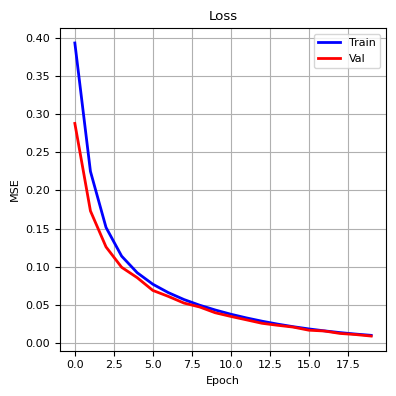

100%|██████████| 40/40 [01:50<00:00,  2.77s/it]


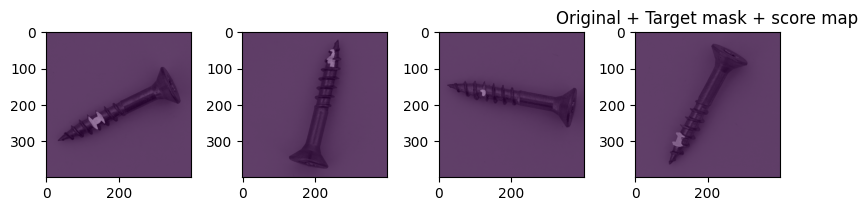

230 230


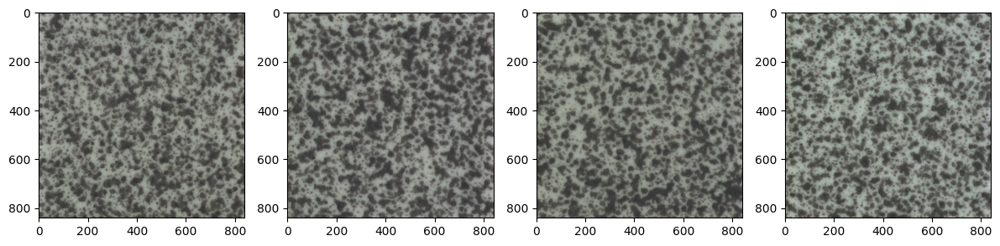

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.331: 100%|██████████| 52/52 [00:38<00:00,  1.36it/s]


Train loss: 0.374


loss = 0.294: 100%|██████████| 6/6 [00:01<00:00,  4.04it/s]


Validation loss: 0.277

Epoch 2/20


loss = 0.217: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.280


loss = 0.221: 100%|██████████| 6/6 [00:01<00:00,  4.27it/s]


Validation loss: 0.220

Epoch 3/20


loss = 0.105: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.150


loss = 0.116: 100%|██████████| 6/6 [00:01<00:00,  4.23it/s]


Validation loss: 0.118

Epoch 4/20


loss = 0.080: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.086


loss = 0.074: 100%|██████████| 6/6 [00:01<00:00,  4.21it/s]


Validation loss: 0.075

Epoch 5/20


loss = 0.039: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.059


loss = 0.052: 100%|██████████| 6/6 [00:01<00:00,  4.18it/s]


Validation loss: 0.053

Epoch 6/20


loss = 0.045: 100%|██████████| 52/52 [00:38<00:00,  1.35it/s]


Train loss: 0.045


loss = 0.041: 100%|██████████| 6/6 [00:01<00:00,  4.18it/s]


Validation loss: 0.041

Epoch 7/20


loss = 0.028: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.035


loss = 0.031: 100%|██████████| 6/6 [00:01<00:00,  4.17it/s]


Validation loss: 0.031

Epoch 8/20


loss = 0.022: 100%|██████████| 52/52 [00:38<00:00,  1.35it/s]


Train loss: 0.028


loss = 0.025: 100%|██████████| 6/6 [00:01<00:00,  4.18it/s]


Validation loss: 0.025

Epoch 9/20


loss = 0.021: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.023


loss = 0.021: 100%|██████████| 6/6 [00:01<00:00,  4.26it/s]


Validation loss: 0.021

Epoch 10/20


loss = 0.023: 100%|██████████| 52/52 [00:38<00:00,  1.35it/s]


Train loss: 0.019


loss = 0.017: 100%|██████████| 6/6 [00:01<00:00,  4.26it/s]


Validation loss: 0.017

Epoch 11/20


loss = 0.015: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.016


loss = 0.015: 100%|██████████| 6/6 [00:01<00:00,  4.17it/s]


Validation loss: 0.015

Epoch 12/20


loss = 0.012: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.014


loss = 0.012: 100%|██████████| 6/6 [00:01<00:00,  4.17it/s]


Validation loss: 0.012

Epoch 13/20


loss = 0.018: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.012


loss = 0.012: 100%|██████████| 6/6 [00:01<00:00,  4.17it/s]


Validation loss: 0.012

Epoch 14/20


loss = 0.011: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.010


loss = 0.010: 100%|██████████| 6/6 [00:01<00:00,  4.28it/s]


Validation loss: 0.010

Epoch 15/20


loss = 0.007: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.009


loss = 0.008: 100%|██████████| 6/6 [00:01<00:00,  4.10it/s]


Validation loss: 0.008

Epoch 16/20


loss = 0.007: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.008


loss = 0.007: 100%|██████████| 6/6 [00:01<00:00,  4.20it/s]


Validation loss: 0.007

Epoch 17/20


loss = 0.007: 100%|██████████| 52/52 [00:38<00:00,  1.35it/s]


Train loss: 0.007


loss = 0.007: 100%|██████████| 6/6 [00:01<00:00,  4.20it/s]


Validation loss: 0.007

Epoch 18/20


loss = 0.005: 100%|██████████| 52/52 [00:38<00:00,  1.34it/s]


Train loss: 0.006


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  4.20it/s]


Validation loss: 0.005

Epoch 19/20


loss = 0.005: 100%|██████████| 52/52 [00:38<00:00,  1.35it/s]


Train loss: 0.005


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  4.25it/s]


Validation loss: 0.005

Epoch 20/20


loss = 0.004: 100%|██████████| 52/52 [00:38<00:00,  1.35it/s]


Train loss: 0.005


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  4.15it/s]


Validation loss: 0.005


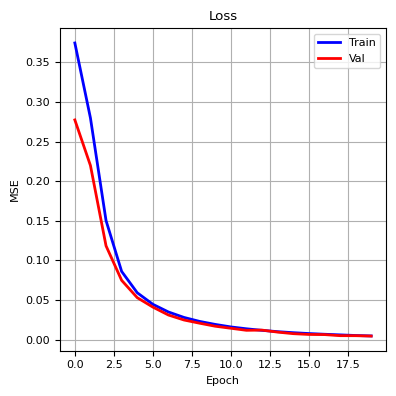

100%|██████████| 30/30 [00:07<00:00,  4.00it/s]


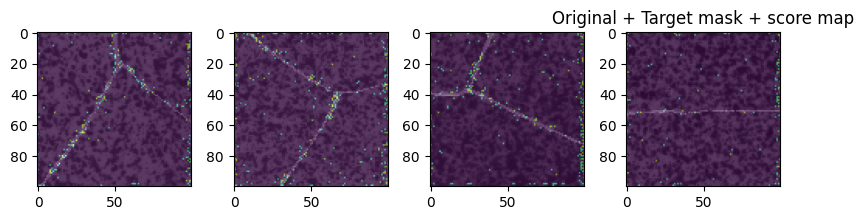

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.303: 100%|██████████| 52/52 [02:03<00:00,  2.38s/it]


Train loss: 0.348


loss = 0.307: 100%|██████████| 6/6 [00:04<00:00,  1.46it/s]


Validation loss: 0.302

Epoch 2/20


loss = 0.169: 100%|██████████| 52/52 [02:03<00:00,  2.37s/it]


Train loss: 0.224


loss = 0.170: 100%|██████████| 6/6 [00:04<00:00,  1.45it/s]


Validation loss: 0.171

Epoch 3/20


loss = 0.101: 100%|██████████| 52/52 [02:03<00:00,  2.38s/it]


Train loss: 0.120


loss = 0.098: 100%|██████████| 6/6 [00:04<00:00,  1.46it/s]


Validation loss: 0.099

Epoch 4/20


loss = 0.068: 100%|██████████| 52/52 [02:03<00:00,  2.38s/it]


Train loss: 0.075


loss = 0.065: 100%|██████████| 6/6 [00:04<00:00,  1.44it/s]


Validation loss: 0.064

Epoch 5/20


loss = 0.048: 100%|██████████| 52/52 [02:05<00:00,  2.42s/it]


Train loss: 0.053


loss = 0.047: 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]


Validation loss: 0.047

Epoch 6/20


loss = 0.036: 100%|██████████| 52/52 [02:06<00:00,  2.43s/it]


Train loss: 0.039


loss = 0.034: 100%|██████████| 6/6 [00:04<00:00,  1.42it/s]


Validation loss: 0.034

Epoch 7/20


loss = 0.015: 100%|██████████| 52/52 [02:05<00:00,  2.42s/it]


Train loss: 0.026


loss = 0.022: 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]


Validation loss: 0.022

Epoch 8/20


loss = 0.022: 100%|██████████| 52/52 [02:04<00:00,  2.40s/it]


Train loss: 0.019


loss = 0.020: 100%|██████████| 6/6 [00:04<00:00,  1.43it/s]


Validation loss: 0.020

Epoch 9/20


loss = 0.013: 100%|██████████| 52/52 [02:04<00:00,  2.39s/it]


Train loss: 0.016


loss = 0.014: 100%|██████████| 6/6 [00:04<00:00,  1.44it/s]


Validation loss: 0.014

Epoch 10/20


loss = 0.008: 100%|██████████| 52/52 [02:04<00:00,  2.40s/it]


Train loss: 0.012


loss = 0.010: 100%|██████████| 6/6 [00:04<00:00,  1.42it/s]


Validation loss: 0.010

Epoch 11/20


loss = 0.006: 100%|██████████| 52/52 [02:04<00:00,  2.39s/it]


Train loss: 0.009


loss = 0.008: 100%|██████████| 6/6 [00:04<00:00,  1.43it/s]


Validation loss: 0.008

Epoch 12/20


loss = 0.009: 100%|██████████| 52/52 [02:04<00:00,  2.39s/it]


Train loss: 0.009


loss = 0.008: 100%|██████████| 6/6 [00:04<00:00,  1.43it/s]


Validation loss: 0.008

Epoch 13/20


loss = 0.008: 100%|██████████| 52/52 [02:04<00:00,  2.40s/it]


Train loss: 0.007


loss = 0.006: 100%|██████████| 6/6 [00:04<00:00,  1.33it/s]


Validation loss: 0.006

Epoch 14/20


loss = 0.004: 100%|██████████| 52/52 [02:06<00:00,  2.43s/it]


Train loss: 0.006


loss = 0.005: 100%|██████████| 6/6 [00:04<00:00,  1.44it/s]


Validation loss: 0.005

Epoch 15/20


loss = 0.004: 100%|██████████| 52/52 [02:05<00:00,  2.41s/it]


Train loss: 0.005


loss = 0.004: 100%|██████████| 6/6 [00:04<00:00,  1.44it/s]


Validation loss: 0.004

Epoch 16/20


loss = 0.005: 100%|██████████| 52/52 [02:04<00:00,  2.40s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:04<00:00,  1.43it/s]


Validation loss: 0.004

Epoch 17/20


loss = 0.005: 100%|██████████| 52/52 [02:04<00:00,  2.40s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:04<00:00,  1.45it/s]


Validation loss: 0.004

Epoch 18/20


loss = 0.002: 100%|██████████| 52/52 [02:04<00:00,  2.40s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:04<00:00,  1.44it/s]


Validation loss: 0.003

Epoch 19/20


loss = 0.003: 100%|██████████| 52/52 [02:05<00:00,  2.41s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:04<00:00,  1.40it/s]


Validation loss: 0.003

Epoch 20/20


loss = 0.003: 100%|██████████| 52/52 [02:06<00:00,  2.44s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 6/6 [00:04<00:00,  1.45it/s]

Validation loss: 0.002


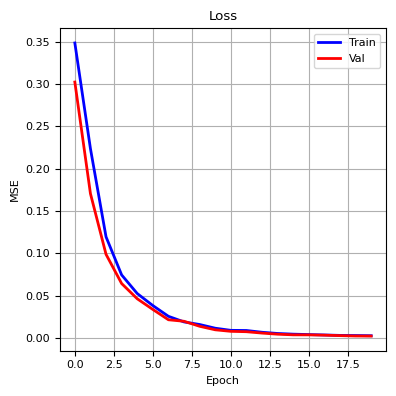

100%|██████████| 30/30 [00:21<00:00,  1.37it/s]


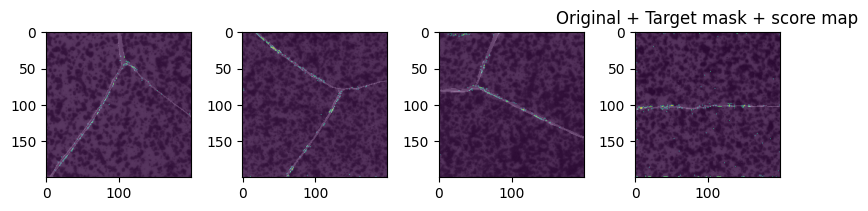

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.198: 100%|██████████| 52/52 [08:41<00:00, 10.04s/it]


Train loss: 0.267


loss = 0.208: 100%|██████████| 6/6 [00:15<00:00,  2.61s/it]


Validation loss: 0.197

Epoch 2/20


loss = 0.095: 100%|██████████| 52/52 [08:45<00:00, 10.10s/it]


Train loss: 0.149


loss = 0.105: 100%|██████████| 6/6 [00:15<00:00,  2.58s/it]


Validation loss: 0.105

Epoch 3/20


loss = 0.052: 100%|██████████| 52/52 [08:43<00:00, 10.06s/it]


Train loss: 0.072


loss = 0.051: 100%|██████████| 6/6 [00:15<00:00,  2.58s/it]


Validation loss: 0.051

Epoch 4/20


loss = 0.032: 100%|██████████| 52/52 [08:38<00:00,  9.97s/it]


Train loss: 0.039


loss = 0.030: 100%|██████████| 6/6 [00:15<00:00,  2.64s/it]


Validation loss: 0.030

Epoch 5/20


loss = 0.018: 100%|██████████| 52/52 [08:38<00:00,  9.97s/it]


Train loss: 0.024


loss = 0.019: 100%|██████████| 6/6 [00:15<00:00,  2.59s/it]


Validation loss: 0.019

Epoch 6/20


loss = 0.009: 100%|██████████| 52/52 [08:47<00:00, 10.14s/it]


Train loss: 0.015


loss = 0.012: 100%|██████████| 6/6 [00:15<00:00,  2.62s/it]


Validation loss: 0.012

Epoch 7/20


loss = 0.011: 100%|██████████| 52/52 [08:59<00:00, 10.37s/it]


Train loss: 0.011


loss = 0.009: 100%|██████████| 6/6 [00:16<00:00,  2.67s/it]


Validation loss: 0.010

Epoch 8/20


loss = 0.005: 100%|██████████| 52/52 [09:05<00:00, 10.50s/it]


Train loss: 0.008


loss = 0.006: 100%|██████████| 6/6 [00:15<00:00,  2.67s/it]


Validation loss: 0.006

Epoch 9/20


loss = 0.006: 100%|██████████| 52/52 [09:02<00:00, 10.43s/it]


Train loss: 0.006


loss = 0.005: 100%|██████████| 6/6 [00:15<00:00,  2.54s/it]


Validation loss: 0.004

Epoch 10/20


loss = 0.004: 100%|██████████| 52/52 [08:46<00:00, 10.12s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:15<00:00,  2.61s/it]


Validation loss: 0.003

Epoch 11/20


loss = 0.003: 100%|██████████| 52/52 [08:43<00:00, 10.06s/it]


Train loss: 0.004


loss = 0.003: 100%|██████████| 6/6 [00:15<00:00,  2.63s/it]


Validation loss: 0.003

Epoch 12/20


loss = 0.002: 100%|██████████| 52/52 [08:37<00:00,  9.95s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 6/6 [00:16<00:00,  2.67s/it]


Validation loss: 0.002

Epoch 13/20


loss = 0.003: 100%|██████████| 52/52 [08:34<00:00,  9.89s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 6/6 [00:15<00:00,  2.58s/it]


Validation loss: 0.002

Epoch 14/20


loss = 0.002: 100%|██████████| 52/52 [08:39<00:00,  9.98s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:17<00:00,  2.85s/it]


Validation loss: 0.002

Epoch 15/20


loss = 0.002: 100%|██████████| 52/52 [09:35<00:00, 11.07s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:15<00:00,  2.51s/it]


Validation loss: 0.002

Epoch 16/20


loss = 0.002: 100%|██████████| 52/52 [09:01<00:00, 10.42s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:16<00:00,  2.73s/it]


Validation loss: 0.002

Epoch 17/20


loss = 0.002: 100%|██████████| 52/52 [08:29<00:00,  9.80s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:15<00:00,  2.62s/it]


Validation loss: 0.001

Epoch 18/20


loss = 0.002: 100%|██████████| 52/52 [08:28<00:00,  9.78s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:15<00:00,  2.62s/it]


Validation loss: 0.001

Epoch 19/20


loss = 0.001: 100%|██████████| 52/52 [08:30<00:00,  9.82s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:15<00:00,  2.59s/it]


Validation loss: 0.001

Epoch 20/20


loss = 0.002: 100%|██████████| 52/52 [08:40<00:00, 10.01s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:16<00:00,  2.76s/it]

Validation loss: 0.001


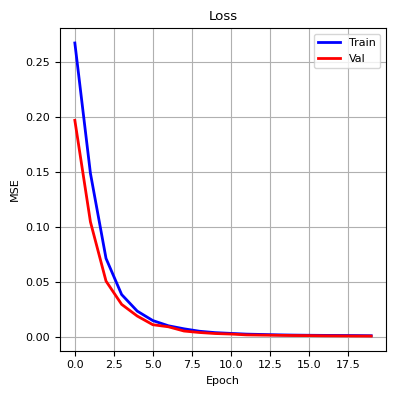

100%|██████████| 30/30 [01:26<00:00,  2.88s/it]


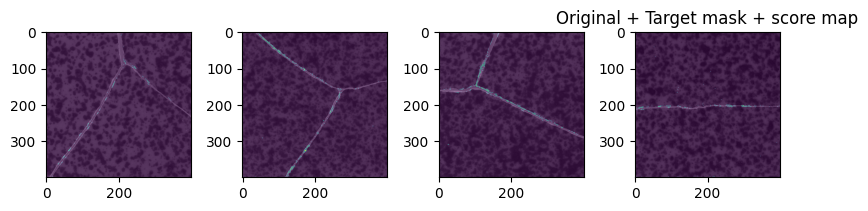

60 60


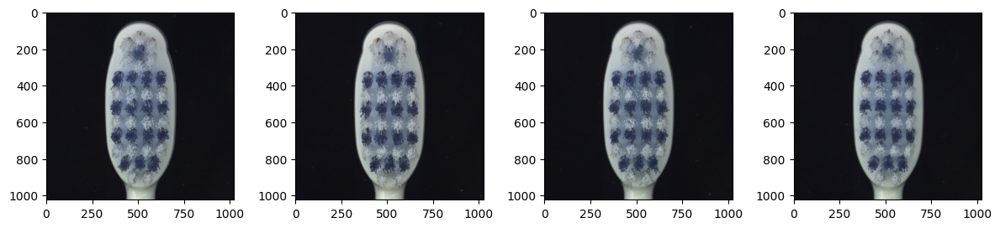

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.117: 100%|██████████| 14/14 [00:10<00:00,  1.36it/s]


Train loss: 0.151


loss = 0.078: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s]


Validation loss: 0.076

Epoch 2/20


loss = 0.089: 100%|██████████| 14/14 [00:10<00:00,  1.34it/s]


Train loss: 0.101


loss = 0.084: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s]


Validation loss: 0.082

Epoch 3/20


loss = 0.071: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]


Train loss: 0.079


loss = 0.071: 100%|██████████| 2/2 [00:00<00:00,  4.84it/s]


Validation loss: 0.072

Epoch 4/20


loss = 0.067: 100%|██████████| 14/14 [00:10<00:00,  1.34it/s]


Train loss: 0.065


loss = 0.058: 100%|██████████| 2/2 [00:00<00:00,  4.84it/s]


Validation loss: 0.058

Epoch 5/20


loss = 0.051: 100%|██████████| 14/14 [00:10<00:00,  1.34it/s]


Train loss: 0.055


loss = 0.047: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s]


Validation loss: 0.047

Epoch 6/20


loss = 0.044: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]


Train loss: 0.047


loss = 0.042: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s]


Validation loss: 0.042

Epoch 7/20


loss = 0.039: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]


Train loss: 0.041


loss = 0.037: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s]


Validation loss: 0.037

Epoch 8/20


loss = 0.033: 100%|██████████| 14/14 [00:10<00:00,  1.32it/s]


Train loss: 0.036


loss = 0.032: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s]


Validation loss: 0.032

Epoch 9/20


loss = 0.033: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]


Train loss: 0.032


loss = 0.029: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s]


Validation loss: 0.029

Epoch 10/20


loss = 0.028: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]


Train loss: 0.028


loss = 0.026: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s]


Validation loss: 0.026

Epoch 11/20


loss = 0.025: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]


Train loss: 0.025


loss = 0.023: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s]


Validation loss: 0.023

Epoch 12/20


loss = 0.019: 100%|██████████| 14/14 [00:10<00:00,  1.32it/s]


Train loss: 0.022


loss = 0.020: 100%|██████████| 2/2 [00:00<00:00,  4.80it/s]


Validation loss: 0.020

Epoch 13/20


loss = 0.018: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]


Train loss: 0.020


loss = 0.018: 100%|██████████| 2/2 [00:00<00:00,  4.94it/s]


Validation loss: 0.018

Epoch 14/20


loss = 0.019: 100%|██████████| 14/14 [00:10<00:00,  1.32it/s]


Train loss: 0.018


loss = 0.016: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s]


Validation loss: 0.016

Epoch 15/20


loss = 0.015: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]


Train loss: 0.016


loss = 0.014: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s]


Validation loss: 0.014

Epoch 16/20


loss = 0.012: 100%|██████████| 14/14 [00:10<00:00,  1.34it/s]


Train loss: 0.014


loss = 0.013: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s]


Validation loss: 0.013

Epoch 17/20


loss = 0.013: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]


Train loss: 0.012


loss = 0.011: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s]


Validation loss: 0.011

Epoch 18/20


loss = 0.011: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]


Train loss: 0.011


loss = 0.010: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s]


Validation loss: 0.011

Epoch 19/20


loss = 0.009: 100%|██████████| 14/14 [00:10<00:00,  1.34it/s]


Train loss: 0.010


loss = 0.009: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s]


Validation loss: 0.009

Epoch 20/20


loss = 0.009: 100%|██████████| 14/14 [00:10<00:00,  1.34it/s]


Train loss: 0.009


loss = 0.009: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s]


Validation loss: 0.009


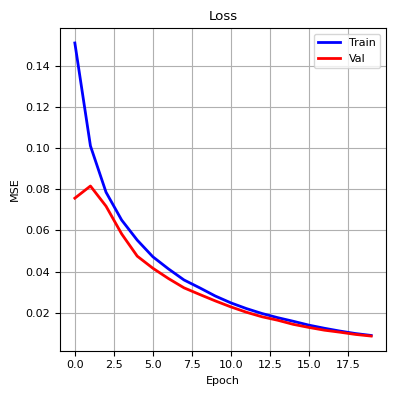

100%|██████████| 11/11 [00:02<00:00,  3.95it/s]


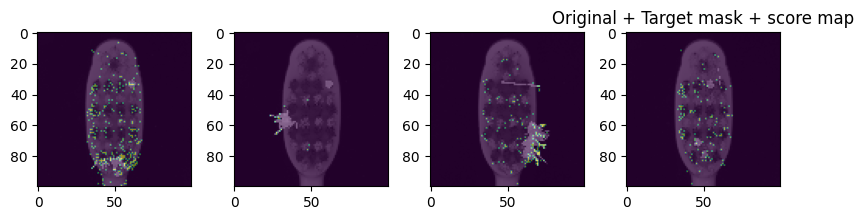

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.125: 100%|██████████| 14/14 [00:32<00:00,  2.30s/it]


Train loss: 0.153


loss = 0.075: 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]


Validation loss: 0.074

Epoch 2/20


loss = 0.088: 100%|██████████| 14/14 [00:32<00:00,  2.35s/it]


Train loss: 0.100


loss = 0.094: 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]


Validation loss: 0.093

Epoch 3/20


loss = 0.076: 100%|██████████| 14/14 [00:33<00:00,  2.37s/it]


Train loss: 0.078


loss = 0.076: 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]


Validation loss: 0.077

Epoch 4/20


loss = 0.070: 100%|██████████| 14/14 [00:32<00:00,  2.29s/it]


Train loss: 0.065


loss = 0.050: 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]


Validation loss: 0.050

Epoch 5/20


loss = 0.048: 100%|██████████| 14/14 [00:33<00:00,  2.37s/it]


Train loss: 0.053


loss = 0.044: 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]


Validation loss: 0.043

Epoch 6/20


loss = 0.042: 100%|██████████| 14/14 [00:32<00:00,  2.36s/it]


Train loss: 0.045


loss = 0.043: 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]


Validation loss: 0.041

Epoch 7/20


loss = 0.036: 100%|██████████| 14/14 [00:31<00:00,  2.28s/it]


Train loss: 0.039


loss = 0.039: 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]


Validation loss: 0.038

Epoch 8/20


loss = 0.031: 100%|██████████| 14/14 [00:33<00:00,  2.38s/it]


Train loss: 0.034


loss = 0.034: 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]


Validation loss: 0.033

Epoch 9/20


loss = 0.026: 100%|██████████| 14/14 [00:31<00:00,  2.27s/it]


Train loss: 0.030


loss = 0.029: 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]


Validation loss: 0.028

Epoch 10/20


loss = 0.037: 100%|██████████| 14/14 [00:33<00:00,  2.36s/it]


Train loss: 0.028


loss = 0.028: 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]


Validation loss: 0.027

Epoch 11/20


loss = 0.026: 100%|██████████| 14/14 [00:31<00:00,  2.28s/it]


Train loss: 0.023


loss = 0.024: 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]


Validation loss: 0.023

Epoch 12/20


loss = 0.023: 100%|██████████| 14/14 [00:33<00:00,  2.37s/it]


Train loss: 0.020


loss = 0.021: 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]


Validation loss: 0.020

Epoch 13/20


loss = 0.020: 100%|██████████| 14/14 [00:32<00:00,  2.34s/it]


Train loss: 0.018


loss = 0.019: 100%|██████████| 2/2 [00:01<00:00,  1.55it/s]


Validation loss: 0.018

Epoch 14/20


loss = 0.018: 100%|██████████| 14/14 [00:32<00:00,  2.30s/it]


Train loss: 0.016


loss = 0.017: 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]


Validation loss: 0.016

Epoch 15/20


loss = 0.016: 100%|██████████| 14/14 [00:33<00:00,  2.36s/it]


Train loss: 0.014


loss = 0.015: 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]


Validation loss: 0.014

Epoch 16/20


loss = 0.014: 100%|██████████| 14/14 [00:31<00:00,  2.28s/it]


Train loss: 0.013


loss = 0.013: 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]


Validation loss: 0.013

Epoch 17/20


loss = 0.011: 100%|██████████| 14/14 [00:33<00:00,  2.39s/it]


Train loss: 0.011


loss = 0.012: 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]


Validation loss: 0.011

Epoch 18/20


loss = 0.010: 100%|██████████| 14/14 [00:32<00:00,  2.30s/it]


Train loss: 0.010


loss = 0.010: 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]


Validation loss: 0.010

Epoch 19/20


loss = 0.009: 100%|██████████| 14/14 [00:33<00:00,  2.39s/it]


Train loss: 0.010


loss = 0.010: 100%|██████████| 2/2 [00:01<00:00,  1.78it/s]


Validation loss: 0.009

Epoch 20/20


loss = 0.009: 100%|██████████| 14/14 [00:32<00:00,  2.34s/it]


Train loss: 0.009


loss = 0.009: 100%|██████████| 2/2 [00:01<00:00,  1.55it/s]

Validation loss: 0.009


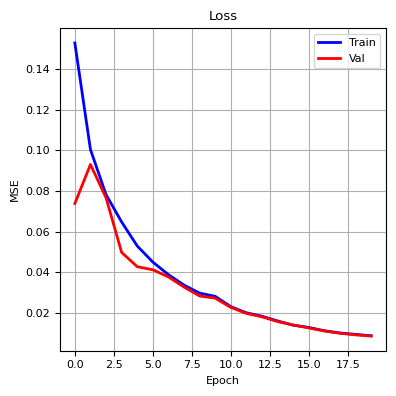

100%|██████████| 11/11 [00:07<00:00,  1.40it/s]


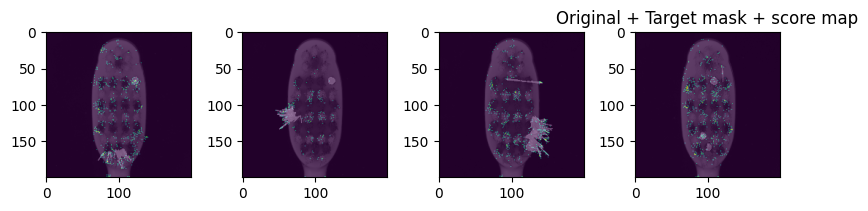

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.126: 100%|██████████| 14/14 [02:21<00:00, 10.13s/it]


Train loss: 0.172


loss = 0.075: 100%|██████████| 2/2 [00:04<00:00,  2.28s/it]


Validation loss: 0.074

Epoch 2/20


loss = 0.070: 100%|██████████| 14/14 [02:16<00:00,  9.79s/it]


Train loss: 0.086


loss = 0.075: 100%|██████████| 2/2 [00:04<00:00,  2.25s/it]


Validation loss: 0.074

Epoch 3/20


loss = 0.058: 100%|██████████| 14/14 [02:16<00:00,  9.73s/it]


Train loss: 0.062


loss = 0.065: 100%|██████████| 2/2 [00:04<00:00,  2.25s/it]


Validation loss: 0.062

Epoch 4/20


loss = 0.042: 100%|██████████| 14/14 [02:20<00:00, 10.01s/it]


Train loss: 0.049


loss = 0.039: 100%|██████████| 2/2 [00:04<00:00,  2.29s/it]


Validation loss: 0.037

Epoch 5/20


loss = 0.044: 100%|██████████| 14/14 [02:15<00:00,  9.68s/it]


Train loss: 0.042


loss = 0.032: 100%|██████████| 2/2 [00:04<00:00,  2.24s/it]


Validation loss: 0.031

Epoch 6/20


loss = 0.031: 100%|██████████| 14/14 [02:15<00:00,  9.65s/it]


Train loss: 0.035


loss = 0.030: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


Validation loss: 0.029

Epoch 7/20


loss = 0.026: 100%|██████████| 14/14 [02:16<00:00,  9.73s/it]


Train loss: 0.029


loss = 0.027: 100%|██████████| 2/2 [00:04<00:00,  2.02s/it]


Validation loss: 0.025

Epoch 8/20


loss = 0.024: 100%|██████████| 14/14 [02:17<00:00,  9.79s/it]


Train loss: 0.025


loss = 0.025: 100%|██████████| 2/2 [00:04<00:00,  2.08s/it]


Validation loss: 0.023

Epoch 9/20


loss = 0.020: 100%|██████████| 14/14 [02:16<00:00,  9.78s/it]


Train loss: 0.022


loss = 0.022: 100%|██████████| 2/2 [00:04<00:00,  2.06s/it]


Validation loss: 0.020

Epoch 10/20


loss = 0.017: 100%|██████████| 14/14 [02:15<00:00,  9.69s/it]


Train loss: 0.019


loss = 0.020: 100%|██████████| 2/2 [00:04<00:00,  2.26s/it]


Validation loss: 0.018

Epoch 11/20


loss = 0.018: 100%|██████████| 14/14 [02:14<00:00,  9.60s/it]


Train loss: 0.016


loss = 0.016: 100%|██████████| 2/2 [00:04<00:00,  2.10s/it]


Validation loss: 0.015

Epoch 12/20


loss = 0.013: 100%|██████████| 14/14 [02:15<00:00,  9.66s/it]


Train loss: 0.014


loss = 0.014: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


Validation loss: 0.013

Epoch 13/20


loss = 0.011: 100%|██████████| 14/14 [02:16<00:00,  9.74s/it]


Train loss: 0.012


loss = 0.012: 100%|██████████| 2/2 [00:04<00:00,  2.31s/it]


Validation loss: 0.011

Epoch 14/20


loss = 0.011: 100%|██████████| 14/14 [02:18<00:00,  9.90s/it]


Train loss: 0.010


loss = 0.011: 100%|██████████| 2/2 [00:03<00:00,  1.98s/it]


Validation loss: 0.010

Epoch 15/20


loss = 0.010: 100%|██████████| 14/14 [02:17<00:00,  9.81s/it]


Train loss: 0.010


loss = 0.010: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


Validation loss: 0.009

Epoch 16/20


loss = 0.009: 100%|██████████| 14/14 [02:17<00:00,  9.84s/it]


Train loss: 0.009


loss = 0.009: 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]


Validation loss: 0.008

Epoch 17/20


loss = 0.008: 100%|██████████| 14/14 [02:15<00:00,  9.67s/it]


Train loss: 0.008


loss = 0.008: 100%|██████████| 2/2 [00:04<00:00,  2.18s/it]


Validation loss: 0.007

Epoch 18/20


loss = 0.014: 100%|██████████| 14/14 [02:14<00:00,  9.64s/it]


Train loss: 0.008


loss = 0.007: 100%|██████████| 2/2 [00:04<00:00,  2.14s/it]


Validation loss: 0.007

Epoch 19/20


loss = 0.007: 100%|██████████| 14/14 [02:15<00:00,  9.65s/it]


Train loss: 0.006


loss = 0.006: 100%|██████████| 2/2 [00:04<00:00,  2.14s/it]


Validation loss: 0.006

Epoch 20/20


loss = 0.011: 100%|██████████| 14/14 [02:18<00:00,  9.90s/it]


Train loss: 0.007


loss = 0.006: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]

Validation loss: 0.006


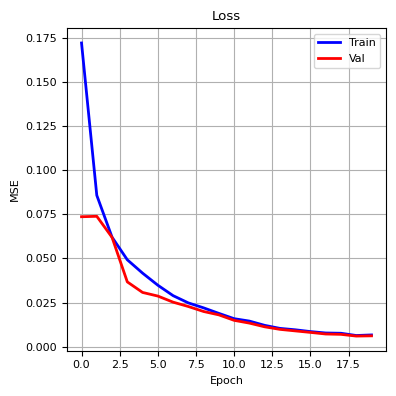

100%|██████████| 11/11 [00:29<00:00,  2.67s/it]


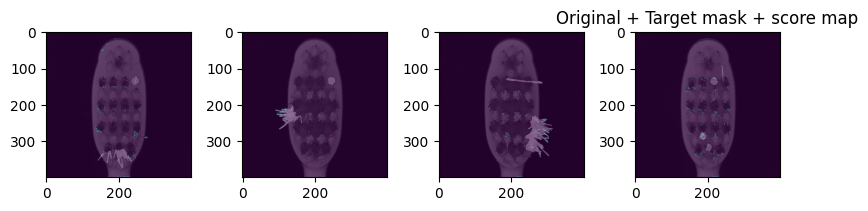

213 213


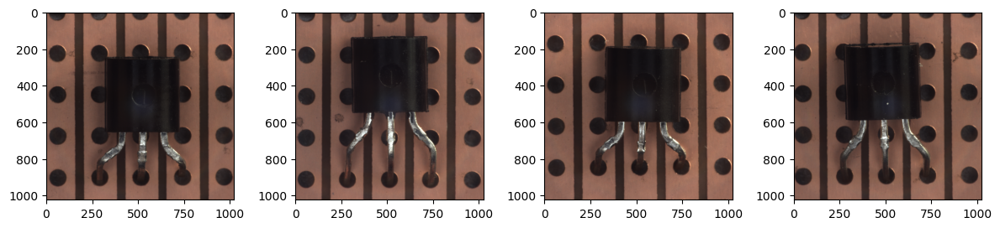

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.139: 100%|██████████| 48/48 [00:35<00:00,  1.34it/s]


Train loss: 0.177


loss = 0.120: 100%|██████████| 6/6 [00:01<00:00,  4.52it/s]


Validation loss: 0.122

Epoch 2/20


loss = 0.070: 100%|██████████| 48/48 [00:35<00:00,  1.34it/s]


Train loss: 0.103


loss = 0.075: 100%|██████████| 6/6 [00:01<00:00,  4.58it/s]


Validation loss: 0.078

Epoch 3/20


loss = 0.039: 100%|██████████| 48/48 [00:35<00:00,  1.34it/s]


Train loss: 0.054


loss = 0.039: 100%|██████████| 6/6 [00:01<00:00,  4.65it/s]


Validation loss: 0.041

Epoch 4/20


loss = 0.025: 100%|██████████| 48/48 [00:35<00:00,  1.34it/s]


Train loss: 0.028


loss = 0.022: 100%|██████████| 6/6 [00:01<00:00,  4.61it/s]


Validation loss: 0.023

Epoch 5/20


loss = 0.012: 100%|██████████| 48/48 [00:35<00:00,  1.35it/s]


Train loss: 0.016


loss = 0.013: 100%|██████████| 6/6 [00:01<00:00,  4.55it/s]


Validation loss: 0.013

Epoch 6/20


loss = 0.008: 100%|██████████| 48/48 [00:36<00:00,  1.33it/s]


Train loss: 0.010


loss = 0.008: 100%|██████████| 6/6 [00:01<00:00,  4.49it/s]


Validation loss: 0.009

Epoch 7/20


loss = 0.006: 100%|██████████| 48/48 [00:36<00:00,  1.32it/s]


Train loss: 0.007


loss = 0.006: 100%|██████████| 6/6 [00:01<00:00,  4.49it/s]


Validation loss: 0.006

Epoch 8/20


loss = 0.005: 100%|██████████| 48/48 [00:36<00:00,  1.33it/s]


Train loss: 0.005


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  4.26it/s]


Validation loss: 0.005

Epoch 9/20


loss = 0.004: 100%|██████████| 48/48 [00:36<00:00,  1.32it/s]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:01<00:00,  4.44it/s]


Validation loss: 0.004

Epoch 10/20


loss = 0.004: 100%|██████████| 48/48 [00:36<00:00,  1.33it/s]


Train loss: 0.004


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  4.45it/s]


Validation loss: 0.004

Epoch 11/20


loss = 0.003: 100%|██████████| 48/48 [00:35<00:00,  1.33it/s]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  4.45it/s]


Validation loss: 0.003

Epoch 12/20


loss = 0.003: 100%|██████████| 48/48 [00:35<00:00,  1.33it/s]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  4.41it/s]


Validation loss: 0.003

Epoch 13/20


loss = 0.002: 100%|██████████| 48/48 [00:36<00:00,  1.32it/s]


Train loss: 0.003


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.52it/s]


Validation loss: 0.003

Epoch 14/20


loss = 0.002: 100%|██████████| 48/48 [00:36<00:00,  1.32it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.45it/s]


Validation loss: 0.002

Epoch 15/20


loss = 0.002: 100%|██████████| 48/48 [00:36<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.61it/s]


Validation loss: 0.002

Epoch 16/20


loss = 0.002: 100%|██████████| 48/48 [00:36<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.56it/s]


Validation loss: 0.002

Epoch 17/20


loss = 0.002: 100%|██████████| 48/48 [00:36<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.44it/s]


Validation loss: 0.002

Epoch 18/20


loss = 0.002: 100%|██████████| 48/48 [00:36<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.51it/s]


Validation loss: 0.002

Epoch 19/20


loss = 0.002: 100%|██████████| 48/48 [00:36<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:01<00:00,  4.60it/s]


Validation loss: 0.002

Epoch 20/20


loss = 0.002: 100%|██████████| 48/48 [00:36<00:00,  1.33it/s]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

Validation loss: 0.002


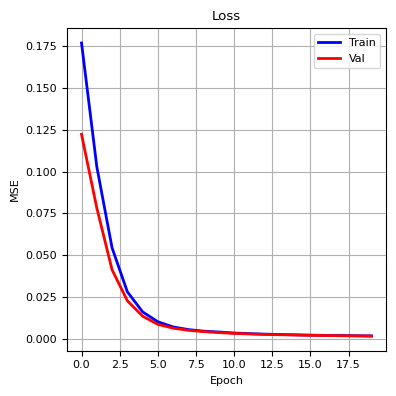

100%|██████████| 25/25 [00:06<00:00,  3.75it/s]


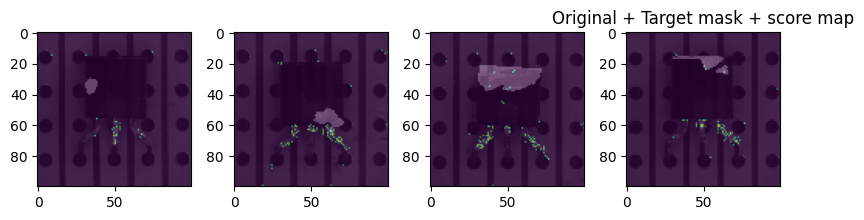

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.088: 100%|██████████| 48/48 [01:54<00:00,  2.39s/it]


Train loss: 0.136


loss = 0.082: 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]


Validation loss: 0.083

Epoch 2/20


loss = 0.044: 100%|██████████| 48/48 [01:55<00:00,  2.40s/it]


Train loss: 0.061


loss = 0.042: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.044

Epoch 3/20


loss = 0.022: 100%|██████████| 48/48 [01:54<00:00,  2.39s/it]


Train loss: 0.029


loss = 0.021: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.022

Epoch 4/20


loss = 0.012: 100%|██████████| 48/48 [01:56<00:00,  2.43s/it]


Train loss: 0.016


loss = 0.012: 100%|██████████| 6/6 [00:03<00:00,  1.53it/s]


Validation loss: 0.013

Epoch 5/20


loss = 0.008: 100%|██████████| 48/48 [01:55<00:00,  2.40s/it]


Train loss: 0.010


loss = 0.008: 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]


Validation loss: 0.008

Epoch 6/20


loss = 0.006: 100%|██████████| 48/48 [01:55<00:00,  2.40s/it]


Train loss: 0.007


loss = 0.006: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.006

Epoch 7/20


loss = 0.005: 100%|██████████| 48/48 [01:55<00:00,  2.40s/it]


Train loss: 0.006


loss = 0.005: 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]


Validation loss: 0.005

Epoch 8/20


loss = 0.004: 100%|██████████| 48/48 [01:55<00:00,  2.40s/it]


Train loss: 0.005


loss = 0.004: 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]


Validation loss: 0.004

Epoch 9/20


loss = 0.003: 100%|██████████| 48/48 [01:55<00:00,  2.40s/it]


Train loss: 0.004


loss = 0.003: 100%|██████████| 6/6 [00:03<00:00,  1.53it/s]


Validation loss: 0.004

Epoch 10/20


loss = 0.003: 100%|██████████| 48/48 [01:55<00:00,  2.40s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]


Validation loss: 0.003

Epoch 11/20


loss = 0.003: 100%|██████████| 48/48 [01:55<00:00,  2.41s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.003

Epoch 12/20


loss = 0.003: 100%|██████████| 48/48 [01:55<00:00,  2.40s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 6/6 [00:03<00:00,  1.58it/s]


Validation loss: 0.002

Epoch 13/20


loss = 0.002: 100%|██████████| 48/48 [01:55<00:00,  2.40s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.002

Epoch 14/20


loss = 0.002: 100%|██████████| 48/48 [01:55<00:00,  2.41s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]


Validation loss: 0.002

Epoch 15/20


loss = 0.002: 100%|██████████| 48/48 [01:55<00:00,  2.40s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]


Validation loss: 0.002

Epoch 16/20


loss = 0.002: 100%|██████████| 48/48 [01:55<00:00,  2.40s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.002

Epoch 17/20


loss = 0.002: 100%|██████████| 48/48 [01:56<00:00,  2.42s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]


Validation loss: 0.002

Epoch 18/20


loss = 0.002: 100%|██████████| 48/48 [01:55<00:00,  2.40s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.001

Epoch 19/20


loss = 0.002: 100%|██████████| 48/48 [01:56<00:00,  2.42s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


Validation loss: 0.001

Epoch 20/20


loss = 0.001: 100%|██████████| 48/48 [01:54<00:00,  2.39s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]


Validation loss: 0.001


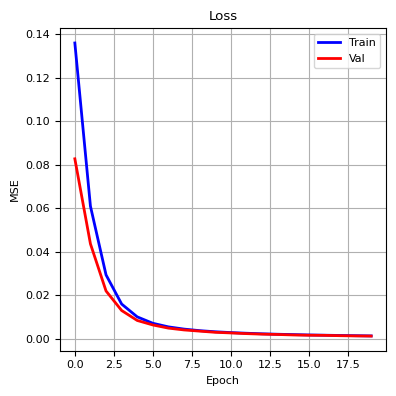

100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


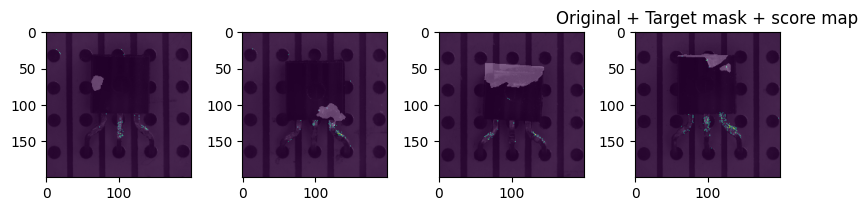

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.124: 100%|██████████| 48/48 [08:12<00:00, 10.26s/it]


Train loss: 0.187


loss = 0.086: 100%|██████████| 6/6 [00:14<00:00,  2.35s/it]


Validation loss: 0.088

Epoch 2/20


loss = 0.050: 100%|██████████| 48/48 [08:14<00:00, 10.31s/it]


Train loss: 0.083


loss = 0.050: 100%|██████████| 6/6 [00:14<00:00,  2.43s/it]


Validation loss: 0.052

Epoch 3/20


loss = 0.020: 100%|██████████| 48/48 [08:11<00:00, 10.25s/it]


Train loss: 0.035


loss = 0.021: 100%|██████████| 6/6 [00:14<00:00,  2.47s/it]


Validation loss: 0.022

Epoch 4/20


loss = 0.011: 100%|██████████| 48/48 [08:13<00:00, 10.28s/it]


Train loss: 0.014


loss = 0.010: 100%|██████████| 6/6 [00:14<00:00,  2.43s/it]


Validation loss: 0.010

Epoch 5/20


loss = 0.006: 100%|██████████| 48/48 [08:12<00:00, 10.26s/it]


Train loss: 0.008


loss = 0.006: 100%|██████████| 6/6 [00:15<00:00,  2.51s/it]


Validation loss: 0.006

Epoch 6/20


loss = 0.004: 100%|██████████| 48/48 [08:10<00:00, 10.23s/it]


Train loss: 0.005


loss = 0.004: 100%|██████████| 6/6 [00:14<00:00,  2.39s/it]


Validation loss: 0.004

Epoch 7/20


loss = 0.004: 100%|██████████| 48/48 [08:15<00:00, 10.33s/it]


Train loss: 0.004


loss = 0.003: 100%|██████████| 6/6 [00:15<00:00,  2.56s/it]


Validation loss: 0.004

Epoch 8/20


loss = 0.003: 100%|██████████| 48/48 [08:10<00:00, 10.23s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:15<00:00,  2.58s/it]


Validation loss: 0.003

Epoch 9/20


loss = 0.003: 100%|██████████| 48/48 [08:05<00:00, 10.10s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 6/6 [00:15<00:00,  2.58s/it]


Validation loss: 0.003

Epoch 10/20


loss = 0.002: 100%|██████████| 48/48 [08:07<00:00, 10.16s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:15<00:00,  2.54s/it]


Validation loss: 0.002

Epoch 11/20


loss = 0.002: 100%|██████████| 48/48 [08:06<00:00, 10.13s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:14<00:00,  2.42s/it]


Validation loss: 0.002

Epoch 12/20


loss = 0.002: 100%|██████████| 48/48 [08:12<00:00, 10.27s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:14<00:00,  2.47s/it]


Validation loss: 0.002

Epoch 13/20


loss = 0.002: 100%|██████████| 48/48 [08:11<00:00, 10.24s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:15<00:00,  2.63s/it]


Validation loss: 0.002

Epoch 14/20


loss = 0.002: 100%|██████████| 48/48 [08:11<00:00, 10.24s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:15<00:00,  2.54s/it]


Validation loss: 0.001

Epoch 15/20


loss = 0.002: 100%|██████████| 48/48 [08:14<00:00, 10.30s/it]


Train loss: 0.002


loss = 0.001: 100%|██████████| 6/6 [00:14<00:00,  2.48s/it]


Validation loss: 0.001

Epoch 16/20


loss = 0.001: 100%|██████████| 48/48 [08:07<00:00, 10.15s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:14<00:00,  2.45s/it]


Validation loss: 0.001

Epoch 17/20


loss = 0.001: 100%|██████████| 48/48 [08:06<00:00, 10.14s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:14<00:00,  2.41s/it]


Validation loss: 0.001

Epoch 18/20


loss = 0.001: 100%|██████████| 48/48 [08:05<00:00, 10.11s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:14<00:00,  2.42s/it]


Validation loss: 0.001

Epoch 19/20


loss = 0.001: 100%|██████████| 48/48 [08:05<00:00, 10.12s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:15<00:00,  2.55s/it]


Validation loss: 0.001

Epoch 20/20


loss = 0.001: 100%|██████████| 48/48 [08:02<00:00, 10.05s/it]


Train loss: 0.001


loss = 0.001: 100%|██████████| 6/6 [00:14<00:00,  2.47s/it]

Validation loss: 0.001


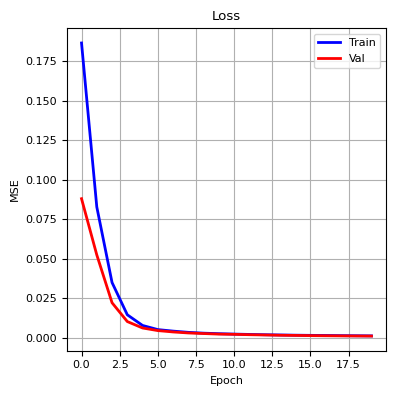

100%|██████████| 25/25 [01:12<00:00,  2.91s/it]


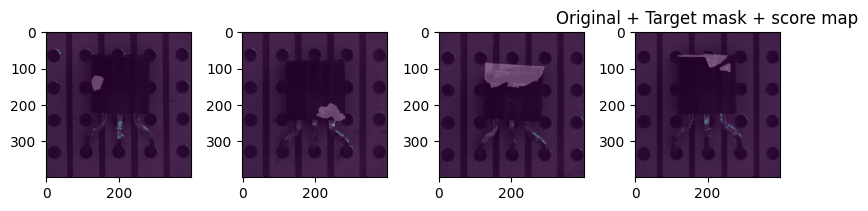

247 247


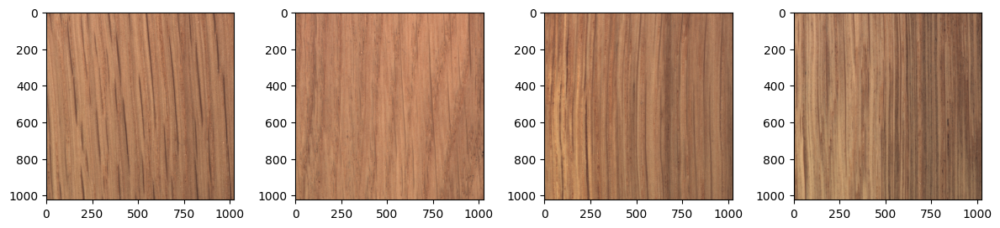

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.242: 100%|██████████| 56/56 [00:42<00:00,  1.33it/s]


Train loss: 0.278


loss = 0.208: 100%|██████████| 6/6 [00:01<00:00,  4.10it/s]


Validation loss: 0.213

Epoch 2/20


loss = 0.140: 100%|██████████| 56/56 [00:42<00:00,  1.33it/s]


Train loss: 0.188


loss = 0.160: 100%|██████████| 6/6 [00:01<00:00,  4.00it/s]


Validation loss: 0.160

Epoch 3/20


loss = 0.113: 100%|██████████| 56/56 [00:41<00:00,  1.33it/s]


Train loss: 0.129


loss = 0.112: 100%|██████████| 6/6 [00:01<00:00,  3.77it/s]


Validation loss: 0.112

Epoch 4/20


loss = 0.083: 100%|██████████| 56/56 [00:41<00:00,  1.34it/s]


Train loss: 0.093


loss = 0.081: 100%|██████████| 6/6 [00:01<00:00,  4.15it/s]


Validation loss: 0.080

Epoch 5/20


loss = 0.059: 100%|██████████| 56/56 [00:42<00:00,  1.33it/s]


Train loss: 0.069


loss = 0.062: 100%|██████████| 6/6 [00:01<00:00,  4.03it/s]


Validation loss: 0.061

Epoch 6/20


loss = 0.041: 100%|██████████| 56/56 [00:42<00:00,  1.33it/s]


Train loss: 0.052


loss = 0.045: 100%|██████████| 6/6 [00:01<00:00,  3.99it/s]


Validation loss: 0.044

Epoch 7/20


loss = 0.030: 100%|██████████| 56/56 [00:42<00:00,  1.33it/s]


Train loss: 0.040


loss = 0.036: 100%|██████████| 6/6 [00:01<00:00,  4.07it/s]


Validation loss: 0.035

Epoch 8/20


loss = 0.035: 100%|██████████| 56/56 [00:42<00:00,  1.32it/s]


Train loss: 0.032


loss = 0.028: 100%|██████████| 6/6 [00:01<00:00,  4.12it/s]


Validation loss: 0.027

Epoch 9/20


loss = 0.023: 100%|██████████| 56/56 [00:42<00:00,  1.32it/s]


Train loss: 0.025


loss = 0.021: 100%|██████████| 6/6 [00:01<00:00,  3.76it/s]


Validation loss: 0.021

Epoch 10/20


loss = 0.023: 100%|██████████| 56/56 [00:42<00:00,  1.33it/s]


Train loss: 0.020


loss = 0.020: 100%|██████████| 6/6 [00:01<00:00,  4.06it/s]


Validation loss: 0.019

Epoch 11/20


loss = 0.016: 100%|██████████| 56/56 [00:42<00:00,  1.33it/s]


Train loss: 0.017


loss = 0.013: 100%|██████████| 6/6 [00:01<00:00,  3.99it/s]


Validation loss: 0.013

Epoch 12/20


loss = 0.010: 100%|██████████| 56/56 [00:42<00:00,  1.33it/s]


Train loss: 0.014


loss = 0.012: 100%|██████████| 6/6 [00:01<00:00,  4.09it/s]


Validation loss: 0.012

Epoch 13/20


loss = 0.011: 100%|██████████| 56/56 [00:41<00:00,  1.34it/s]


Train loss: 0.011


loss = 0.010: 100%|██████████| 6/6 [00:01<00:00,  3.83it/s]


Validation loss: 0.010

Epoch 14/20


loss = 0.009: 100%|██████████| 56/56 [00:42<00:00,  1.33it/s]


Train loss: 0.009


loss = 0.009: 100%|██████████| 6/6 [00:01<00:00,  3.96it/s]


Validation loss: 0.009

Epoch 15/20


loss = 0.009: 100%|██████████| 56/56 [00:42<00:00,  1.32it/s]


Train loss: 0.008


loss = 0.007: 100%|██████████| 6/6 [00:01<00:00,  4.06it/s]


Validation loss: 0.007

Epoch 16/20


loss = 0.005: 100%|██████████| 56/56 [00:42<00:00,  1.32it/s]


Train loss: 0.007


loss = 0.007: 100%|██████████| 6/6 [00:01<00:00,  4.02it/s]


Validation loss: 0.007

Epoch 17/20


loss = 0.009: 100%|██████████| 56/56 [00:42<00:00,  1.33it/s]


Train loss: 0.006


loss = 0.006: 100%|██████████| 6/6 [00:01<00:00,  3.73it/s]


Validation loss: 0.006

Epoch 18/20


loss = 0.005: 100%|██████████| 56/56 [00:42<00:00,  1.33it/s]


Train loss: 0.005


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  3.64it/s]


Validation loss: 0.005

Epoch 19/20


loss = 0.005: 100%|██████████| 56/56 [00:41<00:00,  1.34it/s]


Train loss: 0.005


loss = 0.004: 100%|██████████| 6/6 [00:01<00:00,  3.66it/s]


Validation loss: 0.004

Epoch 20/20


loss = 0.004: 100%|██████████| 56/56 [00:42<00:00,  1.33it/s]


Train loss: 0.004


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  3.77it/s]

Validation loss: 0.003


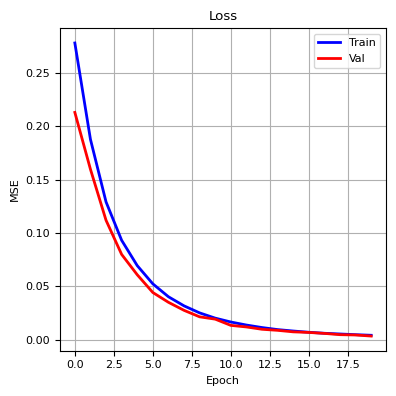

100%|██████████| 20/20 [00:05<00:00,  3.93it/s]


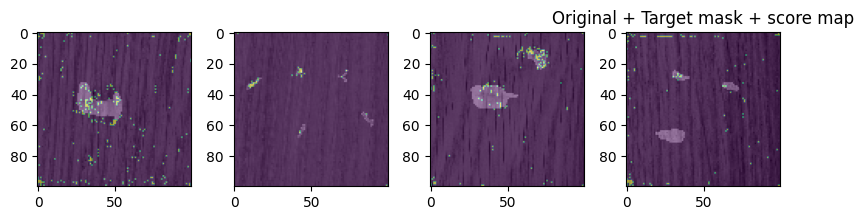

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.302: 100%|██████████| 56/56 [02:14<00:00,  2.40s/it]


Train loss: 0.366


loss = 0.281: 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]


Validation loss: 0.283

Epoch 2/20


loss = 0.207: 100%|██████████| 56/56 [02:13<00:00,  2.39s/it]


Train loss: 0.226


loss = 0.196: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.193

Epoch 3/20


loss = 0.118: 100%|██████████| 56/56 [02:15<00:00,  2.42s/it]


Train loss: 0.154


loss = 0.130: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.129

Epoch 4/20


loss = 0.091: 100%|██████████| 56/56 [02:13<00:00,  2.39s/it]


Train loss: 0.114


loss = 0.098: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.096

Epoch 5/20


loss = 0.088: 100%|██████████| 56/56 [02:14<00:00,  2.40s/it]


Train loss: 0.089


loss = 0.081: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.079

Epoch 6/20


loss = 0.060: 100%|██████████| 56/56 [02:15<00:00,  2.41s/it]


Train loss: 0.070


loss = 0.067: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.065

Epoch 7/20


loss = 0.041: 100%|██████████| 56/56 [02:14<00:00,  2.41s/it]


Train loss: 0.056


loss = 0.051: 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]


Validation loss: 0.050

Epoch 8/20


loss = 0.035: 100%|██████████| 56/56 [02:14<00:00,  2.40s/it]


Train loss: 0.045


loss = 0.036: 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]


Validation loss: 0.036

Epoch 9/20


loss = 0.033: 100%|██████████| 56/56 [02:14<00:00,  2.41s/it]


Train loss: 0.036


loss = 0.033: 100%|██████████| 6/6 [00:04<00:00,  1.32it/s]


Validation loss: 0.033

Epoch 10/20


loss = 0.026: 100%|██████████| 56/56 [02:13<00:00,  2.39s/it]


Train loss: 0.029


loss = 0.028: 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]


Validation loss: 0.028

Epoch 11/20


loss = 0.021: 100%|██████████| 56/56 [02:14<00:00,  2.41s/it]


Train loss: 0.024


loss = 0.023: 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]


Validation loss: 0.023

Epoch 12/20


loss = 0.016: 100%|██████████| 56/56 [02:15<00:00,  2.42s/it]


Train loss: 0.020


loss = 0.022: 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]


Validation loss: 0.022

Epoch 13/20


loss = 0.019: 100%|██████████| 56/56 [02:14<00:00,  2.40s/it]


Train loss: 0.017


loss = 0.017: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.017

Epoch 14/20


loss = 0.013: 100%|██████████| 56/56 [02:14<00:00,  2.40s/it]


Train loss: 0.015


loss = 0.015: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.016

Epoch 15/20


loss = 0.010: 100%|██████████| 56/56 [02:14<00:00,  2.40s/it]


Train loss: 0.013


loss = 0.013: 100%|██████████| 6/6 [00:04<00:00,  1.22it/s]


Validation loss: 0.014

Epoch 16/20


loss = 0.014: 100%|██████████| 56/56 [02:14<00:00,  2.41s/it]


Train loss: 0.011


loss = 0.011: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.012

Epoch 17/20


loss = 0.013: 100%|██████████| 56/56 [02:14<00:00,  2.40s/it]


Train loss: 0.010


loss = 0.010: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.012

Epoch 18/20


loss = 0.008: 100%|██████████| 56/56 [02:14<00:00,  2.40s/it]


Train loss: 0.008


loss = 0.009: 100%|██████████| 6/6 [00:04<00:00,  1.24it/s]


Validation loss: 0.009

Epoch 19/20


loss = 0.007: 100%|██████████| 56/56 [02:14<00:00,  2.41s/it]


Train loss: 0.007


loss = 0.012: 100%|██████████| 6/6 [00:04<00:00,  1.34it/s]


Validation loss: 0.013

Epoch 20/20


loss = 0.004: 100%|██████████| 56/56 [02:14<00:00,  2.40s/it]


Train loss: 0.006


loss = 0.008: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]

Validation loss: 0.008


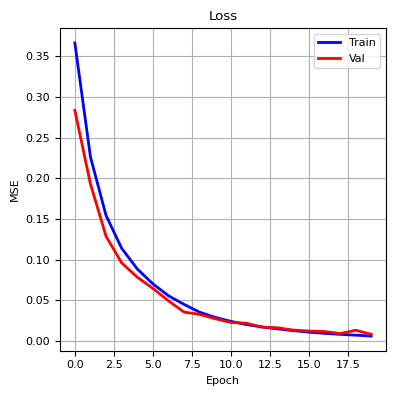

100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


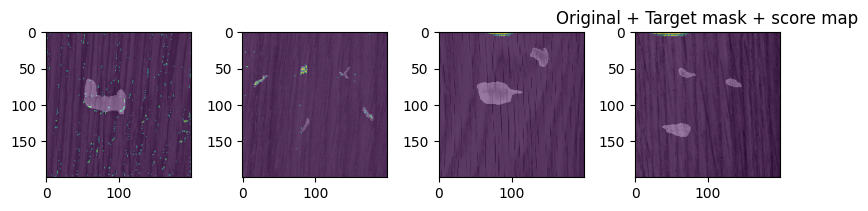

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.331: 100%|██████████| 56/56 [09:28<00:00, 10.14s/it]


Train loss: 0.383


loss = 0.300: 100%|██████████| 6/6 [00:17<00:00,  2.98s/it]


Validation loss: 0.303

Epoch 2/20


loss = 0.175: 100%|██████████| 56/56 [09:20<00:00, 10.01s/it]


Train loss: 0.233


loss = 0.186: 100%|██████████| 6/6 [00:17<00:00,  2.97s/it]


Validation loss: 0.185

Epoch 3/20


loss = 0.125: 100%|██████████| 56/56 [09:16<00:00,  9.93s/it]


Train loss: 0.146


loss = 0.121: 100%|██████████| 6/6 [00:16<00:00,  2.81s/it]


Validation loss: 0.118

Epoch 4/20


loss = 0.084: 100%|██████████| 56/56 [09:18<00:00,  9.97s/it]


Train loss: 0.096


loss = 0.078: 100%|██████████| 6/6 [00:16<00:00,  2.77s/it]


Validation loss: 0.077

Epoch 5/20


loss = 0.057: 100%|██████████| 56/56 [09:21<00:00, 10.02s/it]


Train loss: 0.067


loss = 0.056: 100%|██████████| 6/6 [00:17<00:00,  2.92s/it]


Validation loss: 0.055

Epoch 6/20


loss = 0.048: 100%|██████████| 56/56 [09:17<00:00,  9.96s/it]


Train loss: 0.049


loss = 0.043: 100%|██████████| 6/6 [00:17<00:00,  2.94s/it]


Validation loss: 0.043

Epoch 7/20


loss = 0.036: 100%|██████████| 56/56 [09:16<00:00,  9.94s/it]


Train loss: 0.037


loss = 0.033: 100%|██████████| 6/6 [00:16<00:00,  2.81s/it]


Validation loss: 0.033

Epoch 8/20


loss = 0.023: 100%|██████████| 56/56 [09:20<00:00, 10.00s/it]


Train loss: 0.029


loss = 0.026: 100%|██████████| 6/6 [00:16<00:00,  2.76s/it]


Validation loss: 0.026

Epoch 9/20


loss = 0.024: 100%|██████████| 56/56 [09:16<00:00,  9.94s/it]


Train loss: 0.023


loss = 0.024: 100%|██████████| 6/6 [00:17<00:00,  2.94s/it]


Validation loss: 0.024

Epoch 10/20


loss = 0.019: 100%|██████████| 56/56 [09:33<00:00, 10.24s/it]


Train loss: 0.018


loss = 0.015: 100%|██████████| 6/6 [00:17<00:00,  2.87s/it]


Validation loss: 0.016

Epoch 11/20


loss = 0.009: 100%|██████████| 56/56 [09:34<00:00, 10.25s/it]


Train loss: 0.014


loss = 0.012: 100%|██████████| 6/6 [00:17<00:00,  2.85s/it]


Validation loss: 0.012

Epoch 12/20


loss = 0.009: 100%|██████████| 56/56 [09:31<00:00, 10.20s/it]


Train loss: 0.011


loss = 0.009: 100%|██████████| 6/6 [00:17<00:00,  2.97s/it]


Validation loss: 0.009

Epoch 13/20


loss = 0.006: 100%|██████████| 56/56 [09:25<00:00, 10.10s/it]


Train loss: 0.008


loss = 0.008: 100%|██████████| 6/6 [00:16<00:00,  2.82s/it]


Validation loss: 0.009

Epoch 14/20


loss = 0.006: 100%|██████████| 56/56 [09:36<00:00, 10.29s/it]


Train loss: 0.007


loss = 0.006: 100%|██████████| 6/6 [00:17<00:00,  2.89s/it]


Validation loss: 0.007

Epoch 15/20


loss = 0.006: 100%|██████████| 56/56 [09:23<00:00, 10.06s/it]


Train loss: 0.006


loss = 0.004: 100%|██████████| 6/6 [00:17<00:00,  2.90s/it]


Validation loss: 0.005

Epoch 16/20


loss = 0.003: 100%|██████████| 56/56 [09:19<00:00,  9.99s/it]


Train loss: 0.005


loss = 0.004: 100%|██████████| 6/6 [00:17<00:00,  2.85s/it]


Validation loss: 0.004

Epoch 17/20


loss = 0.005: 100%|██████████| 56/56 [09:35<00:00, 10.28s/it]


Train loss: 0.005


loss = 0.004: 100%|██████████| 6/6 [00:16<00:00,  2.74s/it]


Validation loss: 0.004

Epoch 18/20


loss = 0.007: 100%|██████████| 56/56 [09:25<00:00, 10.09s/it]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:16<00:00,  2.76s/it]


Validation loss: 0.004

Epoch 19/20


loss = 0.002: 100%|██████████| 56/56 [09:17<00:00,  9.95s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:16<00:00,  2.74s/it]


Validation loss: 0.003

Epoch 20/20


loss = 0.003: 100%|██████████| 56/56 [09:20<00:00, 10.01s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:16<00:00,  2.72s/it]

Validation loss: 0.003


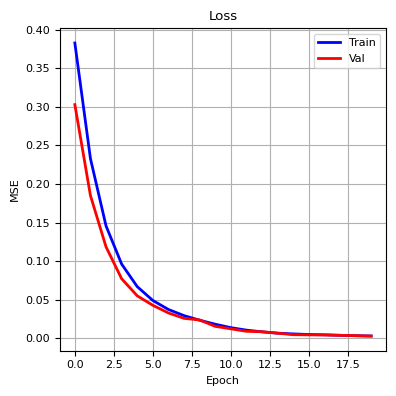

100%|██████████| 20/20 [00:54<00:00,  2.74s/it]


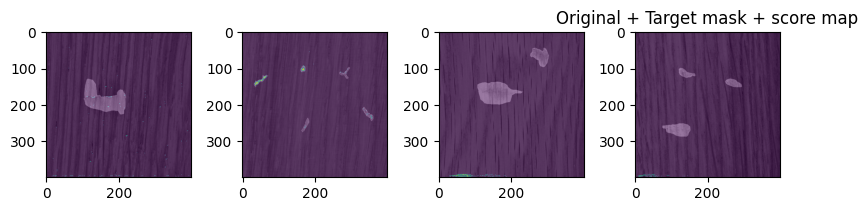

240 240


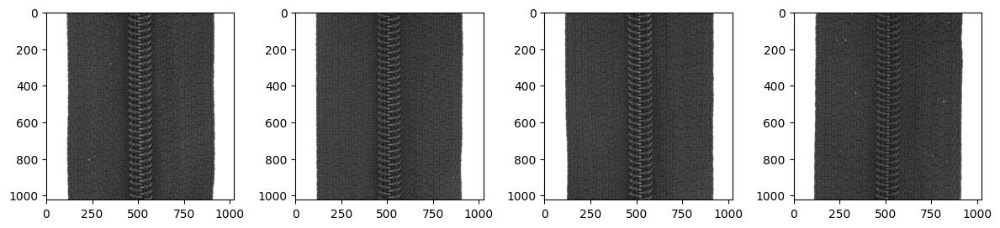

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.177: 100%|██████████| 54/54 [00:39<00:00,  1.35it/s]


Train loss: 0.271


loss = 0.181: 100%|██████████| 6/6 [00:01<00:00,  3.83it/s]


Validation loss: 0.182

Epoch 2/20


loss = 0.113: 100%|██████████| 54/54 [00:40<00:00,  1.35it/s]


Train loss: 0.146


loss = 0.114: 100%|██████████| 6/6 [00:01<00:00,  4.10it/s]


Validation loss: 0.114

Epoch 3/20


loss = 0.068: 100%|██████████| 54/54 [00:40<00:00,  1.35it/s]


Train loss: 0.090


loss = 0.070: 100%|██████████| 6/6 [00:01<00:00,  3.98it/s]


Validation loss: 0.071

Epoch 4/20


loss = 0.047: 100%|██████████| 54/54 [00:40<00:00,  1.35it/s]


Train loss: 0.057


loss = 0.045: 100%|██████████| 6/6 [00:01<00:00,  3.97it/s]


Validation loss: 0.046

Epoch 5/20


loss = 0.033: 100%|██████████| 54/54 [00:40<00:00,  1.35it/s]


Train loss: 0.039


loss = 0.031: 100%|██████████| 6/6 [00:01<00:00,  3.96it/s]


Validation loss: 0.032

Epoch 6/20


loss = 0.023: 100%|██████████| 54/54 [00:40<00:00,  1.34it/s]


Train loss: 0.028


loss = 0.023: 100%|██████████| 6/6 [00:01<00:00,  4.02it/s]


Validation loss: 0.024

Epoch 7/20


loss = 0.019: 100%|██████████| 54/54 [00:40<00:00,  1.34it/s]


Train loss: 0.021


loss = 0.017: 100%|██████████| 6/6 [00:01<00:00,  4.04it/s]


Validation loss: 0.018

Epoch 8/20


loss = 0.014: 100%|██████████| 54/54 [00:40<00:00,  1.35it/s]


Train loss: 0.016


loss = 0.014: 100%|██████████| 6/6 [00:01<00:00,  4.11it/s]


Validation loss: 0.014

Epoch 9/20


loss = 0.011: 100%|██████████| 54/54 [00:40<00:00,  1.34it/s]


Train loss: 0.013


loss = 0.011: 100%|██████████| 6/6 [00:01<00:00,  3.96it/s]


Validation loss: 0.012

Epoch 10/20


loss = 0.009: 100%|██████████| 54/54 [00:40<00:00,  1.35it/s]


Train loss: 0.011


loss = 0.009: 100%|██████████| 6/6 [00:01<00:00,  4.04it/s]


Validation loss: 0.010

Epoch 11/20


loss = 0.009: 100%|██████████| 54/54 [00:40<00:00,  1.34it/s]


Train loss: 0.009


loss = 0.008: 100%|██████████| 6/6 [00:01<00:00,  4.04it/s]


Validation loss: 0.009

Epoch 12/20


loss = 0.007: 100%|██████████| 54/54 [00:40<00:00,  1.34it/s]


Train loss: 0.008


loss = 0.007: 100%|██████████| 6/6 [00:01<00:00,  3.98it/s]


Validation loss: 0.007

Epoch 13/20


loss = 0.008: 100%|██████████| 54/54 [00:40<00:00,  1.35it/s]


Train loss: 0.007


loss = 0.006: 100%|██████████| 6/6 [00:01<00:00,  4.03it/s]


Validation loss: 0.006

Epoch 14/20


loss = 0.006: 100%|██████████| 54/54 [00:40<00:00,  1.34it/s]


Train loss: 0.006


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  4.12it/s]


Validation loss: 0.006

Epoch 15/20


loss = 0.006: 100%|██████████| 54/54 [00:40<00:00,  1.34it/s]


Train loss: 0.005


loss = 0.005: 100%|██████████| 6/6 [00:01<00:00,  4.07it/s]


Validation loss: 0.005

Epoch 16/20


loss = 0.004: 100%|██████████| 54/54 [00:39<00:00,  1.35it/s]


Train loss: 0.005


loss = 0.004: 100%|██████████| 6/6 [00:01<00:00,  4.03it/s]


Validation loss: 0.005

Epoch 17/20


loss = 0.004: 100%|██████████| 54/54 [00:40<00:00,  1.35it/s]


Train loss: 0.004


loss = 0.004: 100%|██████████| 6/6 [00:01<00:00,  3.95it/s]


Validation loss: 0.004

Epoch 18/20


loss = 0.003: 100%|██████████| 54/54 [00:40<00:00,  1.35it/s]


Train loss: 0.004


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  4.03it/s]


Validation loss: 0.004

Epoch 19/20


loss = 0.003: 100%|██████████| 54/54 [00:40<00:00,  1.35it/s]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  3.98it/s]


Validation loss: 0.003

Epoch 20/20


loss = 0.003: 100%|██████████| 54/54 [00:40<00:00,  1.34it/s]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:01<00:00,  3.99it/s]

Validation loss: 0.003


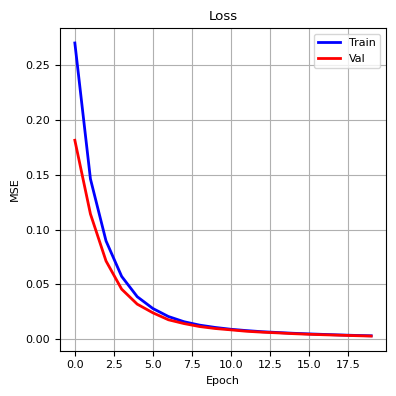

100%|██████████| 38/38 [00:09<00:00,  4.03it/s]


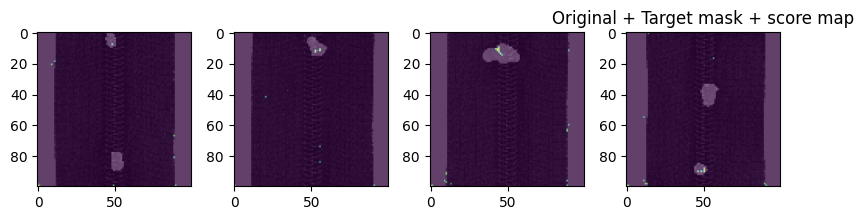

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.360: 100%|██████████| 54/54 [02:10<00:00,  2.41s/it]


Train loss: 0.471


loss = 0.320: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.320

Epoch 2/20


loss = 0.219: 100%|██████████| 54/54 [02:10<00:00,  2.41s/it]


Train loss: 0.283


loss = 0.214: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.215

Epoch 3/20


loss = 0.141: 100%|██████████| 54/54 [02:10<00:00,  2.41s/it]


Train loss: 0.175


loss = 0.130: 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]


Validation loss: 0.131

Epoch 4/20


loss = 0.092: 100%|██████████| 54/54 [02:10<00:00,  2.42s/it]


Train loss: 0.112


loss = 0.083: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.085

Epoch 5/20


loss = 0.066: 100%|██████████| 54/54 [02:10<00:00,  2.41s/it]


Train loss: 0.076


loss = 0.061: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.061

Epoch 6/20


loss = 0.052: 100%|██████████| 54/54 [02:10<00:00,  2.42s/it]


Train loss: 0.057


loss = 0.048: 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]


Validation loss: 0.049

Epoch 7/20


loss = 0.042: 100%|██████████| 54/54 [02:10<00:00,  2.42s/it]


Train loss: 0.045


loss = 0.039: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.040

Epoch 8/20


loss = 0.035: 100%|██████████| 54/54 [02:10<00:00,  2.42s/it]


Train loss: 0.037


loss = 0.032: 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]


Validation loss: 0.033

Epoch 9/20


loss = 0.028: 100%|██████████| 54/54 [02:10<00:00,  2.42s/it]


Train loss: 0.031


loss = 0.027: 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]


Validation loss: 0.028

Epoch 10/20


loss = 0.024: 100%|██████████| 54/54 [02:10<00:00,  2.42s/it]


Train loss: 0.026


loss = 0.023: 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]


Validation loss: 0.024

Epoch 11/20


loss = 0.021: 100%|██████████| 54/54 [02:10<00:00,  2.41s/it]


Train loss: 0.022


loss = 0.020: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.020

Epoch 12/20


loss = 0.017: 100%|██████████| 54/54 [02:10<00:00,  2.41s/it]


Train loss: 0.019


loss = 0.017: 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]


Validation loss: 0.017

Epoch 13/20


loss = 0.016: 100%|██████████| 54/54 [02:10<00:00,  2.42s/it]


Train loss: 0.016


loss = 0.015: 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


Validation loss: 0.015

Epoch 14/20


loss = 0.013: 100%|██████████| 54/54 [02:11<00:00,  2.43s/it]


Train loss: 0.014


loss = 0.013: 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]


Validation loss: 0.013

Epoch 15/20


loss = 0.012: 100%|██████████| 54/54 [02:14<00:00,  2.50s/it]


Train loss: 0.012


loss = 0.011: 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]


Validation loss: 0.011

Epoch 16/20


loss = 0.009: 100%|██████████| 54/54 [02:14<00:00,  2.48s/it]


Train loss: 0.010


loss = 0.009: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.009

Epoch 17/20


loss = 0.007: 100%|██████████| 54/54 [02:10<00:00,  2.41s/it]


Train loss: 0.007


loss = 0.006: 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]


Validation loss: 0.006

Epoch 18/20


loss = 0.006: 100%|██████████| 54/54 [02:11<00:00,  2.43s/it]


Train loss: 0.006


loss = 0.006: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


Validation loss: 0.006

Epoch 19/20


loss = 0.007: 100%|██████████| 54/54 [02:12<00:00,  2.45s/it]


Train loss: 0.007


loss = 0.006: 100%|██████████| 6/6 [00:04<00:00,  1.40it/s]


Validation loss: 0.006

Epoch 20/20


loss = 0.005: 100%|██████████| 54/54 [02:10<00:00,  2.42s/it]


Train loss: 0.005


loss = 0.004: 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]

Validation loss: 0.004


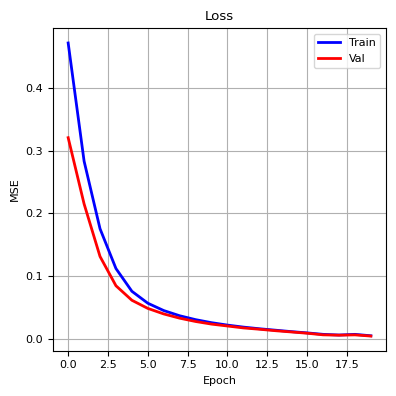

100%|██████████| 38/38 [00:27<00:00,  1.38it/s]


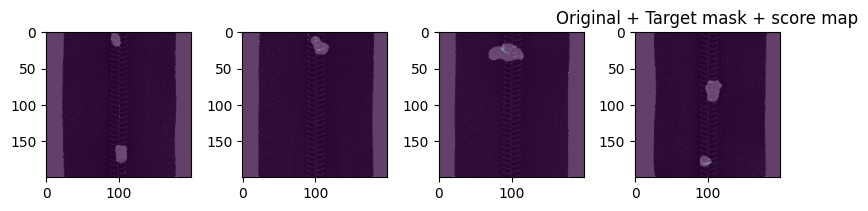

Total trainable parameters: 3.10e+07

Epoch 1/20


loss = 0.179: 100%|██████████| 54/54 [09:03<00:00, 10.06s/it]


Train loss: 0.290


loss = 0.232: 100%|██████████| 6/6 [00:16<00:00,  2.69s/it]


Validation loss: 0.234

Epoch 2/20


loss = 0.118: 100%|██████████| 54/54 [09:14<00:00, 10.27s/it]


Train loss: 0.148


loss = 0.115: 100%|██████████| 6/6 [00:16<00:00,  2.68s/it]


Validation loss: 0.116

Epoch 3/20


loss = 0.074: 100%|██████████| 54/54 [09:09<00:00, 10.18s/it]


Train loss: 0.093


loss = 0.072: 100%|██████████| 6/6 [00:18<00:00,  3.16s/it]


Validation loss: 0.073

Epoch 4/20


loss = 0.051: 100%|██████████| 54/54 [09:03<00:00, 10.07s/it]


Train loss: 0.060


loss = 0.049: 100%|██████████| 6/6 [00:16<00:00,  2.70s/it]


Validation loss: 0.049

Epoch 5/20


loss = 0.034: 100%|██████████| 54/54 [08:46<00:00,  9.75s/it]


Train loss: 0.042


loss = 0.034: 100%|██████████| 6/6 [00:16<00:00,  2.79s/it]


Validation loss: 0.035

Epoch 6/20


loss = 0.027: 100%|██████████| 54/54 [08:47<00:00,  9.77s/it]


Train loss: 0.031


loss = 0.025: 100%|██████████| 6/6 [00:16<00:00,  2.68s/it]


Validation loss: 0.026

Epoch 7/20


loss = 0.020: 100%|██████████| 54/54 [08:49<00:00,  9.81s/it]


Train loss: 0.023


loss = 0.020: 100%|██████████| 6/6 [00:16<00:00,  2.79s/it]


Validation loss: 0.020

Epoch 8/20


loss = 0.016: 100%|██████████| 54/54 [08:43<00:00,  9.70s/it]


Train loss: 0.018


loss = 0.016: 100%|██████████| 6/6 [00:16<00:00,  2.75s/it]


Validation loss: 0.016

Epoch 9/20


loss = 0.014: 100%|██████████| 54/54 [08:42<00:00,  9.69s/it]


Train loss: 0.015


loss = 0.013: 100%|██████████| 6/6 [00:15<00:00,  2.62s/it]


Validation loss: 0.013

Epoch 10/20


loss = 0.011: 100%|██████████| 54/54 [08:40<00:00,  9.64s/it]


Train loss: 0.012


loss = 0.010: 100%|██████████| 6/6 [00:16<00:00,  2.72s/it]


Validation loss: 0.011

Epoch 11/20


loss = 0.008: 100%|██████████| 54/54 [09:11<00:00, 10.22s/it]


Train loss: 0.010


loss = 0.008: 100%|██████████| 6/6 [00:16<00:00,  2.72s/it]


Validation loss: 0.008

Epoch 12/20


loss = 0.008: 100%|██████████| 54/54 [08:40<00:00,  9.64s/it]


Train loss: 0.008


loss = 0.007: 100%|██████████| 6/6 [00:16<00:00,  2.67s/it]


Validation loss: 0.007

Epoch 13/20


loss = 0.006: 100%|██████████| 54/54 [08:36<00:00,  9.57s/it]


Train loss: 0.007


loss = 0.006: 100%|██████████| 6/6 [00:15<00:00,  2.62s/it]


Validation loss: 0.006

Epoch 14/20


loss = 0.005: 100%|██████████| 54/54 [08:45<00:00,  9.73s/it]


Train loss: 0.005


loss = 0.005: 100%|██████████| 6/6 [00:17<00:00,  2.96s/it]


Validation loss: 0.005

Epoch 15/20


loss = 0.004: 100%|██████████| 54/54 [09:13<00:00, 10.26s/it]


Train loss: 0.005


loss = 0.004: 100%|██████████| 6/6 [00:17<00:00,  2.88s/it]


Validation loss: 0.004

Epoch 16/20


loss = 0.003: 100%|██████████| 54/54 [09:19<00:00, 10.35s/it]


Train loss: 0.004


loss = 0.003: 100%|██████████| 6/6 [00:17<00:00,  2.92s/it]


Validation loss: 0.003

Epoch 17/20


loss = 0.003: 100%|██████████| 54/54 [09:03<00:00, 10.06s/it]


Train loss: 0.003


loss = 0.003: 100%|██████████| 6/6 [00:17<00:00,  2.94s/it]


Validation loss: 0.003

Epoch 18/20


loss = 0.003: 100%|██████████| 54/54 [08:53<00:00,  9.87s/it]


Train loss: 0.003


loss = 0.002: 100%|██████████| 6/6 [00:16<00:00,  2.82s/it]


Validation loss: 0.003

Epoch 19/20


loss = 0.002: 100%|██████████| 54/54 [08:56<00:00,  9.94s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:16<00:00,  2.82s/it]


Validation loss: 0.002

Epoch 20/20


loss = 0.002: 100%|██████████| 54/54 [08:41<00:00,  9.65s/it]


Train loss: 0.002


loss = 0.002: 100%|██████████| 6/6 [00:16<00:00,  2.69s/it]

Validation loss: 0.002


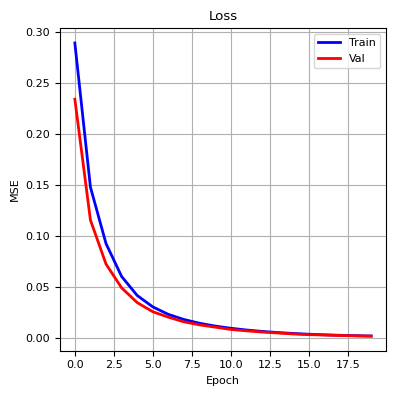

100%|██████████| 38/38 [01:44<00:00,  2.74s/it]


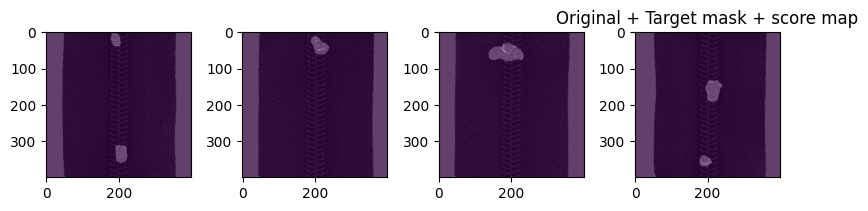

CPU times: user 4d 20h 28min 3s, sys: 2d 10h 58min 54s, total: 7d 7h 26min 57s
Wall time: 2d 13h 40min 35s


In [5]:
%%time
df_results = run_all_categories(all_categories, explore_dimensions)